<a href="https://colab.research.google.com/github/reine298/Dementia_Classification/blob/main/Dementia_Classification_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setting and Load data

### Set up

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install pydub

In [ ]:
#### Extracting MFCC's For every audio file
import pandas as pd
import os
import librosa
import numpy as np
import tensorflow as tf
import librosa
from pydub import AudioSegment
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
import seaborn as sns


my_classes = ['cn', 'ad']
map_class_to_id = {'cn':0, 'ad':1} # 1=dementia
gender=['male','female']
map_gender_to_id = {'male':0, 'female':1}



audio_dataset_path='drive/MyDrive/A_senior_project/origi_wav/a/cut_wav'
metadata= pd.read_csv('/content/drive/MyDrive/A_senior_project/origi_wav/a/cut_wav/update_class_label_15dec.csv')
full_path = metadata['filename'].apply(lambda row: os.path.join(audio_dataset_path, row))
metadata = metadata.assign(filename=full_path)
metadata

,filename,age,gender,target,dx,class_id,fold
0,drive/MyDrive/A_senior_project/origi_wav/a/cut...,70,female,0,cn,0,1
1,drive/MyDrive/A_senior_project/origi_wav/a/cut...,72,female,0,cn,0,1
2,drive/MyDrive/A_senior_project/origi_wav/a/cut...,67,female,0,cn,0,1
3,drive/MyDrive/A_senior_project/origi_wav/a/cut...,67,female,0,cn,0,1
4,drive/MyDrive/A_senior_project/origi_wav/a/cut...,68,male,0,cn,0,1
...,...,...,...,...,...,...,...
151,drive/MyDrive/A_senior_project/origi_wav/a/cut...,54,female,0,cn,0,3
152,drive/MyDrive/A_senior_project/origi_wav/a/cut...,54,male,0,cn,0,3
153,drive/MyDrive/A_senior_project/origi_wav/a/cut...,67,female,0,cn,0,3
154,drive/MyDrive/A_senior_project/origi_wav/a/cut...,58,male,0,cn,0,3


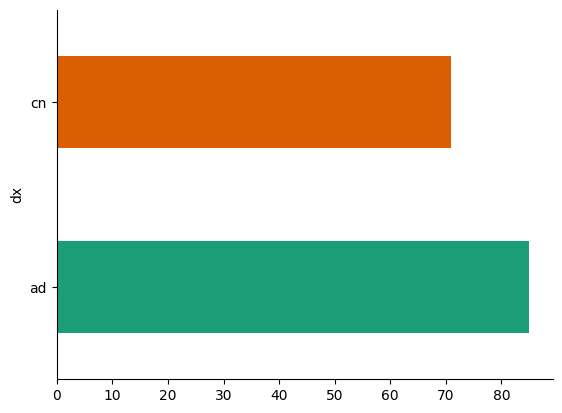

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
metadata.groupby('dx').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

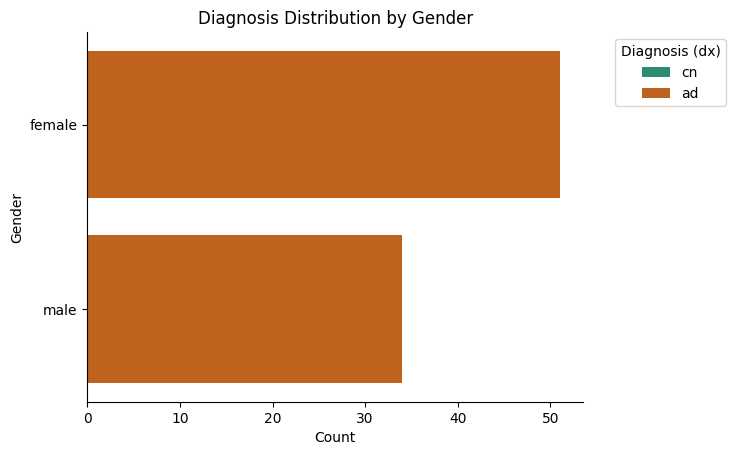

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming metadata is your DataFrame
sns.countplot(y='gender', hue='dx', data=metadata, palette='Dark2', orient='h', dodge=False)
plt.xlabel('Count')
plt.ylabel('Gender')
plt.title('Diagnosis Distribution by Gender')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.legend(title='Diagnosis (dx)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

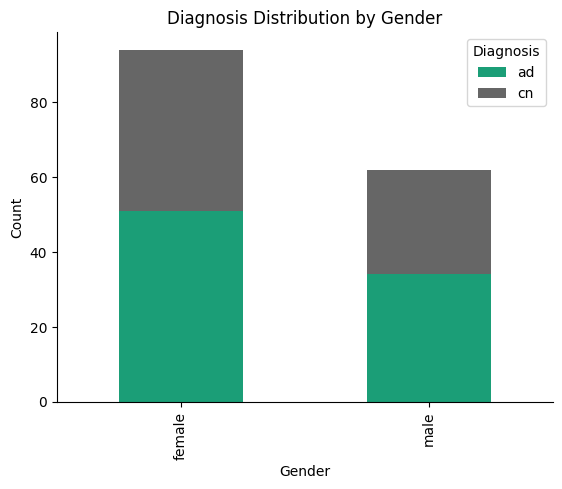

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming metadata is your DataFrame
# Here, 'gender' and 'dx' are assumed to be columns in your DataFrame

# Create a pivot table to count occurrences of each dx for each gender
pivot_table = metadata.pivot_table(index='gender', columns='dx', aggfunc='size', fill_value=0)

# Plot the stacked bar chart
pivot_table.plot(kind='bar', stacked=True, colormap='Dark2')

# Add labels and title
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Diagnosis Distribution by Gender')
plt.legend(title='Diagnosis')

# Remove top and right spines
plt.gca().spines[['top', 'right']].set_visible(False)

# Show the plot
plt.show()

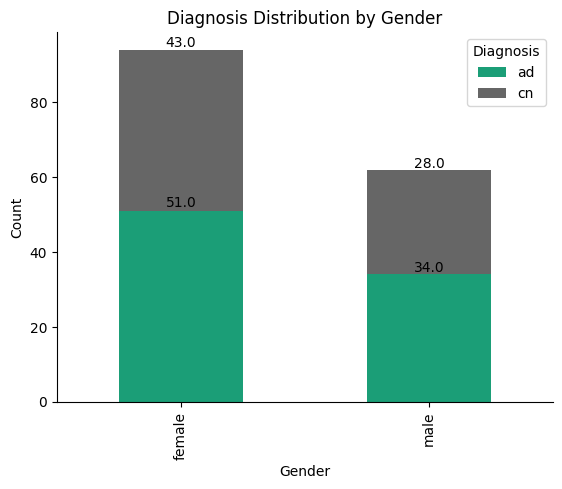

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming metadata is your DataFrame
# Here, 'gender' and 'dx' are assumed to be columns in your DataFrame

# Create a pivot table to count occurrences of each dx for each gender
pivot_table = metadata.pivot_table(index='gender', columns='dx', aggfunc='size', fill_value=0)

# Plot the stacked bar chart
ax = pivot_table.plot(kind='bar', stacked=True, colormap='Dark2')

# Add labels and title
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Diagnosis Distribution by Gender')
plt.legend(title='Diagnosis')

# Remove top and right spines
plt.gca().spines[['top', 'right']].set_visible(False)

# Annotate each bar with the raw counts
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    ax.annotate(f'{height}', (x + width/2, y + height*1.02), ha='center')

# Show the plot
plt.show()

## Create Model

### Yamnet with attention

In [ ]:
#config
EPOCHS = 100
BATCH_SIZE = 16
VALIDATION_RATIO = 0.1
class_names = [
    "ad",
    "cn"]
MODEL_NAME = "yamnet_dementia_attention"

In [ ]:
!pip install -U -q tensorflow_io
!pip install keras-attention

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 MB 12.4 MB/s eta 0:00:00


In [ ]:
import tensorflow_hub as hub
import tensorflow_io as tfio
from tensorflow import keras
import seaborn as sns
from scipy import stats
from IPython.display import Audio

yamnet_model = hub.load("https://tfhub.dev/google/yamnet/1")

In [ ]:
metadata.shape

(156, 7)

In [ ]:
metadata['filename'][3]

'drive/MyDrive/A_senior_project/origi_wav/a/cut_wav/adrso008_split4.wav'

### functions

In [ ]:
def filename_to_predictions(filename):
    # Load 16k audio wave
    audio_wav = load_16k_audio_wav(filename)

    # Get audio embeddings & scores.
    scores, embeddings, mel_spectrogram = yamnet_model(audio_wav)

    # Predict the output of the accent recognition model with embeddings as input
    predictions = model.predict(embeddings)

    return audio_wav, predictions, mel_spectrogram

def get_att_end(a, attention, embedding):
    #select range
    frames_per_file = 64
    i = a
    start_index = i * frames_per_file
    end_index = (i + 1) * frames_per_file

    attention_weights_for_file_i = attention[start_index:end_index]
    embedding_file_i = embedding[start_index:end_index]
    return attention_weights_for_file_i, embedding_file_i

def plot_all(audio_wav,mel_spectrogram,emddings,attention,predictions,class_names):
  weight=15
  height=15
  plt.figure(figsize=(weight, height))

  # Plot the waveform.
  plt.subplot(5, 1, 1)
  plt.title('Signal wave')
  plt.plot(audio_wav)
  plt.xlim([0, len(audio_wav)])

  # Plot the log-mel spectrogram (returned by the model).
  plt.subplot(5, 1, 2)
  plt.title('Log-mel spectrogram')
  plt.imshow(
       mel_spectrogram.numpy().T, aspect="auto", interpolation="nearest", origin="lower"
  )
  plt.colorbar()
  plt.show()

  # Plot Embeddings
  plt.figure(figsize=(weight, height))
  plt.subplot(5, 1, 3)
  plt.imshow(
     emddings.T, aspect="auto", interpolation="nearest", origin="lower"
  )
  plt.ylim(0,1024) # 1024 scale to 16
  plt.title('Embeddings')
  plt.colorbar()
  plt.show()

  # Plot Attention
  plt.figure(figsize=(weight, height))
  plt.subplot(5, 1, 4)
  plt.title('Attention')
  plt.imshow(
      attention, aspect="auto", interpolation="nearest", origin="lower"
  )
  plt.colorbar()

  # Plot and label the model output scores for the top-scoring classes.
  mean_predictions = np.mean(predictions, axis=0)
  top_class_indices = np.argsort(mean_predictions)[::-1]
  plt.subplot(5, 1, 5)
  plt.title('Class Props')
  plt.imshow(
    predictions[:, top_class_indices].T,
    aspect="auto",
    interpolation="nearest",
    cmap="gray_r",
  )
  patch_padding = (0.025 / 2) / 0.01
  plt.xlim([-patch_padding - 0.5, predictions.shape[0] + patch_padding - 0.5])
  # Label the top_N classes.
  yticks = range(0, len(class_names), 1)
  plt.yticks(yticks, [class_names[top_class_indices[x]] for x in yticks])
  _ = plt.ylim(-0.5 + np.array([len(class_names), 0]))
  plt.colorbar()

  plt.subplots_adjust(hspace=0.75)

  plt.show()

def plot_frame(frame_index, audio_wav, mel_spectrogram, embedding, attention):
    print('Frame :', frame_index)
    weight = 12
    height = 16
    plt.figure(figsize=(weight, height))
    plt.suptitle('Frame {}'.format(frame_index), fontsize=20)

    # Plot Attention
    plt.subplot(4, 1, 1)
    plt.title('Attention 64 features per frame')
    plt.plot(attention.T)
    plt.grid(True)

    # Plot the waveform.
    plt.subplot(4, 1, 2)
    plt.title('Signal wave')
    plt.plot(audio_wav)
    plt.xlim([0, len(audio_wav)])

    # Plot the log-mel spectrogram (returned by the model).
    plt.subplot(4, 1, 3)
    plt.title('Log-mel spectrogram')
    plt.imshow(
        mel_spectrogram.numpy().T, aspect="auto", interpolation="nearest", origin="lower"
    )
    #plt.colorbar()

    # Plot Embeddings
    plt.subplot(4, 1, 4)
    plt.imshow(
        embedding.T, aspect="auto", interpolation="nearest", origin="lower"
    )
    plt.ylim(0, 1024)  # 1024 scale to 16
    plt.title('Embeddings')
    plt.colorbar()

    plt.tight_layout()
    plt.show()


def gen_dataframe(audio_wav,mel_spectrogram,embedding,attention,predictions):
  data = []
  for i, timeframe in enumerate(timeframes):
    frame=i+1
    prediction_ad=predictions[i][0]
    prediction_cn=predictions[i][1]
    start=round(timeframe['start_time'])
    end=round(timeframe['end_time'])

    audio = audio_wav[start:end]

    s=round(i*48)
    e=round((i+1)*48)
    mel_spec=mel_spectrogram[s:e]

    trim_embedding=embedding[i:i+1]
    trim_attention=attention[i:i+1]

    data.append([frame,start,end,audio,mel_spec,trim_embedding,trim_attention,prediction_ad,prediction_cn])


  df = pd.DataFrame(data,columns=['frame','start','end','audio','mel_spec','emb','att','ad_score','cn_score'])
  return df


edit time per frame here

In [ ]:
def post_process(predictions, threshold=0.5, smoothing_window=3):
    # Apply thresholding
    predictions[predictions < threshold] = 0.0

    # Apply smoothing
    for i in range(smoothing_window, len(predictions) - smoothing_window):
        predictions[i] = predictions[i - smoothing_window:i + smoothing_window + 1].mean()

    return predictions

def map_timeframes(predictions, spectrogram):
    # Assuming predictions is a list of time-varying probabilities from YAMNet
    # and spectrogram is the 2D representation of the audio signal

    # Get the duration of each time step in the spectrogram
    # Spectrogram duration per frame
    spectrogram_duration_per_frame = 7732.421875 #(7732.421875*4)=30929.6875 #milli sec


    # Map YAMNet predictions to corresponding timeframes in the original audio
    audio_timeframes = []
    for prediction, spec_frame_index in zip(predictions, range(len(predictions))):
        # Calculate the start and end time for the current frame in the audio
        start_time = spec_frame_index * spectrogram_duration_per_frame
        end_time = (spec_frame_index + 1) * spectrogram_duration_per_frame

        # Append the corresponding timeframe along with the prediction
        audio_timeframes.append({
            'start_time': start_time,
            'end_time': end_time,
            'prediction': prediction
        })

    return audio_timeframes

import matplotlib.pyplot as plt
import numpy as np

import numpy as np
import matplotlib.pyplot as plt
import librosa.display

def visualize_predictions_on_audio(audio, predictions, attention_scores, sample_rate):
    # Assuming 'predictions' is a list of YAMNet predictions for each frame
    # and 'attention_scores' is a list of corresponding attention scores

    # Plot the waveform.
    plt.subplot(4, 1, 1)
    plt.plot(audio_wav)
    plt.xlim([0, len(audio_wav)])

    # Plot the log-mel spectrogram (returned by the model).
    plt.subplot(4, 1, 2)
    plt.imshow(
        mel_spectrogram.numpy().T, aspect="auto", interpolation="nearest", origin="lower"
    )

    # Plot predictions on the spectrogram with attention scores
    plt.figure(figsize=(50, 30))
    librosa.display.specshow(librosa.power_to_db(mel_spectrogram.numpy().T, ref=np.max), y_axis='mel', x_axis='time')

    for frame_idx, (prediction, attention_score) in enumerate(zip(predictions, attention_scores)):
        # Highlight or emphasize the portion of the spectrogram based on attention score
        alpha = attention_score  # Adjust alpha based on attention score
        plt.fill_between([frame_idx * 0.48, (frame_idx + 1) * 0.48], 0, 100, color='red', alpha=alpha)

        # You can also annotate the spectrogram with predicted labels, etc.
        plt.text(frame_idx * 0.48 + 0.24, 50, prediction, ha='center', va='center', color='white', fontsize=16)

    plt.title('Predictions on Spectrogram with Attention Scores')
    plt.show()


import numpy as np
import matplotlib.pyplot as plt
import librosa.display

def visualize_predictions_on_audio(audio, predictions, attention_scores, sample_rate):
    # Assuming 'predictions' is a list of YAMNet predictions for each frame
    # and 'attention_scores' is a list of corresponding attention scores

    # Calculate the time axis for the audio signal
    audio_duration = len(audio) / sample_rate
    time_axis = np.linspace(0, audio_duration, len(audio))

    # Plot the original audio waveform
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, audio)
    plt.title('Original Audio Waveform')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Amplitude')

    # Plot the spectrogram
    plt.figure(figsize=(10, 4))
    plt.imshow(
        mel_spectrogram.numpy().T, aspect="auto", interpolation="nearest", origin="lower"
    )
    plt.title('Spectrogram')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Frequency')

    specgram = mel_spectrogram.numpy().T

    # Plot predictions on the spectrogram with attention scores
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(librosa.power_to_db(specgram, ref=np.max), y_axis='mel', x_axis='time')

    for frame_idx, (prediction, attention_score) in enumerate(zip(predictions, attention_scores)):
        # Highlight or emphasize the portion of the spectrogram based on attention score
        alpha = attention_score  # Adjust alpha based on attention score
        plt.fill_between([frame_idx * 0.48, (frame_idx + 1) * 0.48], 0, specgram.shape[0], color='red', alpha=alpha)

        # You can also annotate the spectrogram with predicted labels, etc.
        #plt.text(frame_idx * 0.48 + 0.24, specgram.shape[0] / 2, prediction, ha='center', va='center', color='white', fontsize=8)

    plt.title('Predictions on Spectrogram with Attention Scores')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display


def visualize_predictions_on_audio(audio, timeframes, attention_scores):
    sample_rate = 16000
    # Plot the audio waveform
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(audio, sr=sample_rate, alpha=0.5)

    # Plot the attention scores on the audio waveform
    for timeframe, attention_score in zip(timeframes, attention_scores):
        start_sample = int(timeframe['start_time'] * sample_rate)
        end_sample = int(timeframe['end_time'] * sample_rate)
        plt.axvspan(start_sample, end_sample, color='red', alpha=0.3 + 0.7 * attention_score)

    plt.title('Audio Waveform with Attention Scores')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()

    # Plot the spectrogram
    plt.figure(figsize=(10, 4))
    spectrogram = librosa.feature.melspectrogram(y=audio, sr=sample_rate)
    librosa.display.specshow(librosa.power_to_db(spectrogram, ref=np.max), y_axis='mel', x_axis='time')

    # Plot the attention scores on the spectrogram
    for timeframe, attention_score in zip(timeframes, attention_scores):
        start_frame = int(timeframe['start_time'] / 0.048)  # Assuming 0.048 seconds per frame
        end_frame = int(timeframe['end_time'] / 0.048)
        plt.axvspan(start_frame, end_frame, color='red', alpha=0.3 + 0.7 * attention_score)

    plt.title('Spectrogram with Attention Scores')
    plt.xlabel('Time (s)')
    plt.ylabel('Mel Frequency')
    plt.show()

    # Print attention scores for each audio frame
    for i, timeframe in enumerate(timeframes):
        print(f"Frame {i + 1}: Start Time = {timeframe['start_time']}, End Time = {timeframe['end_time']}, Attention Score = {attention_scores[i]}")

###Dataset

In [ ]:
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder

# Assuming metadata is a DataFrame
split = int(len(metadata) * (1 - VALIDATION_RATIO))

ranges = [(0, 2),(18, 157)]
subsets = []
for start, end in ranges:
    subset = metadata.iloc[start:end]
    subsets.append(subset)
train_df = pd.concat(subsets, ignore_index=True)
valid_df = metadata[2:18]

# Encode categorical variables if needed
label_encoder = LabelEncoder()
train_df['encoded_gender'] = label_encoder.fit_transform(train_df['gender'])
valid_df['encoded_gender'] = label_encoder.transform(valid_df['gender'])

# Convert DataFrame to tensors
train_data = (
    train_df['filename'].values,
    train_df[['age', 'encoded_gender', 'target', 'class_id', 'fold']].values
)
valid_data = (
    valid_df['filename'].values,
    valid_df[['age', 'encoded_gender', 'target', 'class_id', 'fold']].values
)

# Creating datasets without shuffling
train_dataset = tf.data.Dataset.from_tensor_slices(train_data)
train_dataset = train_dataset.repeat(1)  # Ensure dataset is iterated over only once
valid_dataset = tf.data.Dataset.from_tensor_slices(valid_data)
valid_dataset = valid_dataset.repeat(1)  # Ensure dataset is iterated over only once

print(
    f"We have {train_df.shape[0]} training samples & {valid_df.shape[0]} validation ones"
)

We have 140 training samples & 16 validation ones


<ipython-input-17-7931bac052f7>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_df['encoded_gender'] = label_encoder.transform(valid_df['gender'])


In [ ]:
def load_16k_audio_wav(filename):
    # Read file content
    file_content = tf.io.read_file(filename)

    # Decode audio wave
    audio_wav, sample_rate = tf.audio.decode_wav(file_content, desired_channels=1)
    audio_wav = tf.squeeze(audio_wav, axis=-1)
    sample_rate = tf.cast(sample_rate, dtype=tf.int64)

    # Resample to 16k
    audio_wav = tfio.audio.resample(audio_wav, rate_in=sample_rate, rate_out=16000)

    return audio_wav


def filepath_to_embeddings(filename, label):
    # Load 16k audio wave
    audio_wav = load_16k_audio_wav(filename)

    # Get audio embeddings & scores.
    # The embeddings are the audio features extracted using transfer learning
    # while scores will be used to identify time slots that are not speech
    # which will then be gathered into a specific new category 'other'
    scores, embeddings, _ = yamnet_model(audio_wav)

    # Number of embeddings in order to know how many times to repeat the label
    embeddings_num = tf.shape(embeddings)[0]
    labels = tf.repeat(label, embeddings_num)

    # Change labels for time-slots that are not speech into a new category 'other'
    labels = tf.where(tf.argmax(scores, axis=1) == 0, label, len(class_names) - 1)

    # Using one-hot in order to use AUC
    return (embeddings, tf.one_hot(labels, len(class_names)))


def dataframe_to_dataset(dataframe, batch_size=64):
    dataset = tf.data.Dataset.from_tensor_slices(
        (dataframe["filename"], dataframe["class_id"])
    )

    dataset = dataset.map(
        lambda x, y: filepath_to_embeddings(x, y),
        num_parallel_calls=tf.data.experimental.AUTOTUNE,
    ).unbatch()

    return dataset.cache().batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Assuming metadata is your DataFrame
all_ds = dataframe_to_dataset(metadata)
train_ds = dataframe_to_dataset(train_df)
valid_ds = dataframe_to_dataset(valid_df)

In [ ]:
"""from keras import backend as K
from keras.layers import Layer, Input, Dense, Flatten

class AttentionLayer(Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        # Create a trainable weight variable for this layer.
        self.W_q = self.add_weight(name='W_q',
                                  shape=(input_shape[-1], input_shape[-1]),
                                  initializer='uniform',
                                  trainable=True)
        self.W_k = self.add_weight(name='W_k',
                                  shape=(input_shape[-1], input_shape[-1]),
                                  initializer='uniform',
                                  trainable=True)
        super(AttentionLayer, self).build(input_shape)  # Be sure to call this at the end

    def call(self, x):
        q = K.dot(x, self.W_q)
        k = K.dot(x, self.W_k)
        attn_score = K.dot(q, K.transpose(k))
        attn_score = K.softmax(attn_score)
        output = K.batch_dot(attn_score, x)
        return output

    def compute_output_shape(self, input_shape):
        return input_shape
        """

"from keras import backend as K\nfrom keras.layers import Layer, Input, Dense, Flatten\n\nclass AttentionLayer(Layer):\n    def __init__(self, **kwargs):\n        super(AttentionLayer, self).__init__(**kwargs)\n\n    def build(self, input_shape):\n        # Create a trainable weight variable for this layer.\n        self.W_q = self.add_weight(name='W_q',\n                                  shape=(input_shape[-1], input_shape[-1]),\n                                  initializer='uniform',\n                                  trainable=True)\n        self.W_k = self.add_weight(name='W_k',\n                                  shape=(input_shape[-1], input_shape[-1]),\n                                  initializer='uniform',\n                                  trainable=True)\n        super(AttentionLayer, self).build(input_shape)  # Be sure to call this at the end\n\n    def call(self, x):\n        q = K.dot(x, self.W_q)\n        k = K.dot(x, self.W_k)\n        attn_score = K.dot(q, K.transpose

In [ ]:
# set initualizer
from keras import backend as K
from keras.layers import Layer, Input, Dense, Flatten
from keras.initializers import GlorotUniform

class AttentionLayer(Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        # Create a trainable weight variable for this layer.
        self.W_q = self.add_weight(name='W_q',
                                  shape=(input_shape[-1], input_shape[-1]),
                                  initializer=GlorotUniform(seed=42),
                                  trainable=True)
        self.W_k = self.add_weight(name='W_k',
                                  shape=(input_shape[-1], input_shape[-1]),
                                  initializer=GlorotUniform(seed=42),
                                  trainable=True)
        super(AttentionLayer, self).build(input_shape)  # Be sure to call this at the end

    def call(self, x):
        q = K.dot(x, self.W_q)
        k = K.dot(x, self.W_k)
        attn_score = K.dot(q, K.transpose(k))
        attn_score = K.softmax(attn_score)
        output = K.batch_dot(attn_score, x)
        return output

    def compute_output_shape(self, input_shape):
        return input_shape


In [ ]:
"""
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Dropout, Concatenate, Input, Attention
from tensorflow.keras.models import Model

K.clear_session()

def build_and_compile_model():
    inputs = Input(shape=(1024,), name="embedding")

    x = Dense(128, activation="relu", name="dense_1")(inputs)

    query = Dense(64, activation='relu', name='query')(x)
    value = Dense(64, activation='relu', name='value')(x)

    attention = Attention()([query, value])

    x = Concatenate(axis=-1, name='concatenate')([x, attention])

    outputs = Dense(len(class_names), activation="softmax", name="output")(x)

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", keras.metrics.AUC(name="auc")],
    )

    return model

model = build_and_compile_model()
model.summary()
"""

'\nfrom tensorflow.keras import backend as K\nfrom tensorflow.keras.layers import Dense, Dropout, Concatenate, Input, Attention\nfrom tensorflow.keras.models import Model\n\nK.clear_session()\n\ndef build_and_compile_model():\n    inputs = Input(shape=(1024,), name="embedding")\n\n    x = Dense(128, activation="relu", name="dense_1")(inputs)\n\n    query = Dense(64, activation=\'relu\', name=\'query\')(x)\n    value = Dense(64, activation=\'relu\', name=\'value\')(x)\n\n    attention = Attention()([query, value])\n\n    x = Concatenate(axis=-1, name=\'concatenate\')([x, attention])\n\n    outputs = Dense(len(class_names), activation="softmax", name="output")(x)\n\n    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")\n\n    model.compile(\n        optimizer=keras.optimizers.Adam(learning_rate=1.9644e-5),\n        loss=keras.losses.CategoricalCrossentropy(),\n        metrics=["accuracy", keras.metrics.AUC(name="auc")],\n    )\n\n    return model\n\nmodel = build_a

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, Input, Reshape, Attention, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform
from sklearn.model_selection import train_test_split


def build_and_compile_model():
    inputs = Input(shape=(1024,), name="embedding")

    # Reshape input for Conv1D layer
    x = Reshape((1024, 1))(inputs)

    # Add a Conv1D layer
    x = Conv1D(32, 3, activation='relu', padding='same', kernel_initializer=GlorotUniform(seed=42))(x)
    x = MaxPooling1D(pool_size=2)(x)

    # Flatten the output before passing it to dense layers
    x = Flatten()(x)

    # Continue with your existing architecture
    x = Dense(64, activation="relu", kernel_initializer=GlorotUniform(seed=42), name="dense_1")(x)

    query = Dense(64, activation='relu', kernel_initializer=GlorotUniform(seed=42), name='query')(x)
    value = Dense(64, activation='relu', kernel_initializer=GlorotUniform(seed=42), name='value')(x)

    attention = Attention()([query, value])

    x = attention

    outputs = Dense(len(class_names), activation=None, name="output")(x)
    outputs = Softmax()(outputs)  # Add Softmax activation here

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", keras.metrics.AUC(name="auc")],
    )

    return model

model = build_and_compile_model()
model.summary()

Model: "accent_recognition"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 embedding (InputLayer)      [(None, 1024)]               0         []                            
                                                                                                  
 reshape (Reshape)           (None, 1024, 1)              0         ['embedding[0][0]']           
                                                                                                  
 conv1d (Conv1D)             (None, 1024, 32)             128       ['reshape[0][0]']             
                                                                                                  
 max_pooling1d (MaxPooling1  (None, 512, 32)              0         ['conv1d[0][0]']              
 D)                                                                              

In [ ]:
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Dropout, Concatenate, Input, Attention
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform

K.clear_session()

def build_and_compile_model2(seed=None):
    inputs = Input(shape=(1024,), name="embedding")

    # Using GlorotUniform initializer for the dense layer
    x = Dense(64, activation="relu", kernel_initializer=GlorotUniform(seed=seed), name="dense_1")(inputs)

    query = Dense(64, activation='relu', kernel_initializer=GlorotUniform(seed=seed), name='query')(x)
    value = Dense(64, activation='relu', kernel_initializer=GlorotUniform(seed=seed), name='value')(x)

    attention = Attention()([query, value])

    x = attention

    outputs = Dense(len(class_names), activation="softmax", name="output")(x)
    outputs = Softmax()(outputs)

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", keras.metrics.AUC(name="auc")],
    )

    return model

model2 = build_and_compile_model2()
model2.summary()


Model: "accent_recognition"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 embedding (InputLayer)      [(None, 1024)]               0         []                            
                                                                                                  
 dense_1 (Dense)             (None, 64)                   65600     ['embedding[0][0]']           
                                                                                                  
 query (Dense)               (None, 64)                   4160      ['dense_1[0][0]']             
                                                                                                  
 value (Dense)               (None, 64)                   4160      ['dense_1[0][0]']             
                                                                                 

In [ ]:
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Softmax

def build_and_compile_model3(seed=None):
    inputs = Input(shape=(1024,), name="embedding")

    # Reshape input for Conv1D layer
    x = Reshape((1024, 1))(inputs)

    # Add a Conv1D layer
    x = Conv1D(32, 3, activation='relu', padding='same', kernel_initializer=GlorotUniform(seed=42))(x)
    x = MaxPooling1D(pool_size=2)(x)

    # Flatten the output before passing it to dense layers
    x = Flatten()(x)

    # Continue with your existing architecture
    x = Dense(64, activation="relu", kernel_initializer=GlorotUniform(seed=seed), name="dense_1")(x)

    outputs = Dense(len(class_names), activation=None, name="output")(x)
    outputs = Softmax()(outputs)  # Add Softmax activation here

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", keras.metrics.AUC(name="auc")],
    )

    return model

model3 = build_and_compile_model3()
model3.summary()

Model: "accent_recognition"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (InputLayer)      [(None, 1024)]            0         
                                                                 
 reshape (Reshape)           (None, 1024, 1)           0         
                                                                 
 conv1d (Conv1D)             (None, 1024, 32)          128       
                                                                 
 max_pooling1d (MaxPooling1  (None, 512, 32)           0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 dense_1 (Dense)             (None, 64)                1048640   
                                                

In [ ]:
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Dropout, Concatenate, Input, Attention
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform

K.clear_session()

def build_and_compile_model4(seed=None):
    inputs = Input(shape=(1024,), name="embedding")

    # Using GlorotUniform initializer for the dense layer
    x = Dense(64, activation="relu", kernel_initializer=GlorotUniform(seed=seed), name="dense_1")(inputs)
    outputs = Dense(len(class_names), activation="softmax", name="output")(x)
    outputs = Softmax()(outputs)

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", keras.metrics.AUC(name="auc")],
    )

    return model

model4 = build_and_compile_model4()
model4.summary()


Model: "accent_recognition"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (InputLayer)      [(None, 1024)]            0         
                                                                 
 dense_1 (Dense)             (None, 64)                65600     
                                                                 
 output (Dense)              (None, 2)                 130       
                                                                 
 softmax (Softmax)           (None, 2)                 0         
                                                                 
Total params: 65730 (256.76 KB)
Trainable params: 65730 (256.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
"""
class_counts = tf.zeros(shape=(len(class_names),), dtype=tf.int32)

for x, y in iter(train_ds):
    class_counts = class_counts + tf.math.bincount(
        tf.cast(tf.math.argmax(y, axis=1), tf.int32), minlength=len(class_names)
    )

class_weight = {
    i: tf.math.reduce_sum(class_counts).numpy() / class_counts[i].numpy()
    for i in range(len(class_counts))
}

print(class_weight)
"""

{0: 3.0705962988348183, 1: 1.4829526646805693}


In [ ]:
class_weight = {0: 3.0705962988348183, 1: 1.4829526646805693}

In [ ]:
"""
early_stopping_cb = keras.callbacks.EarlyStopping(
    monitor="val_auc", patience=10, restore_best_weights=True
)

model_checkpoint_cb = keras.callbacks.ModelCheckpoint(
    MODEL_NAME + ".h5", monitor="val_auc", save_best_only=True
)

tensorboard_cb = keras.callbacks.TensorBoard(
    os.path.join(os.curdir, "logs", model.name)
)

callbacks = [early_stopping_cb, model_checkpoint_cb, tensorboard_cb]
"""

'\nearly_stopping_cb = keras.callbacks.EarlyStopping(\n    monitor="val_auc", patience=10, restore_best_weights=True\n)\n\nmodel_checkpoint_cb = keras.callbacks.ModelCheckpoint(\n    MODEL_NAME + ".h5", monitor="val_auc", save_best_only=True\n)\n\ntensorboard_cb = keras.callbacks.TensorBoard(\n    os.path.join(os.curdir, "logs", model.name)\n)\n\ncallbacks = [early_stopping_cb, model_checkpoint_cb, tensorboard_cb]\n'

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with the EarlyStopping callback
history = model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=valid_ds,
    batch_size=BATCH_SIZE,
    class_weight=class_weight,
    callbacks=[early_stopping],  # Include the EarlyStopping callback here
    verbose=2,
    shuffle=False
)

# After training, you can inspect the history object to determine the best epoch:
best_epoch = np.argmin(history.history['val_loss']) + 1
print("Best epoch:", best_epoch)

In [ ]:
EPOCHS=25

In [ ]:
"""
np.random.seed(50)
tf.random.set_seed(50)

# Now, proceed with model training using model.fit()
history = model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=valid_ds,
    batch_size=BATCH_SIZE,
    class_weight=class_weight,
    callbacks=callbacks,
    verbose=2
)
"""

'\nnp.random.seed(50)\ntf.random.set_seed(50)\n\n# Now, proceed with model training using model.fit()\nhistory = model.fit(\n    train_ds,\n    epochs=EPOCHS,\n    validation_data=valid_ds,\n    batch_size=BATCH_SIZE,\n    class_weight=class_weight,\n    callbacks=callbacks,\n    verbose=2\n)\n'

In [ ]:
history = model.fit(
    train_ds,
    epochs=25,
    validation_data=valid_ds,
    batch_size=BATCH_SIZE,
    class_weight=class_weight,
    #callbacks=callbacks,
    verbose=2,
    shuffle=False
)

Epoch 1/25
140/140 - 231s - loss: 1.5276 - accuracy: 0.5874 - auc: 0.5931 - val_loss: 0.6809 - val_accuracy: 0.8828 - val_auc: 0.8294 - 231s/epoch - 2s/step
Epoch 2/25
140/140 - 6s - loss: 1.3997 - accuracy: 0.6280 - auc: 0.6582 - val_loss: 0.6711 - val_accuracy: 0.5938 - val_auc: 0.7592 - 6s/epoch - 41ms/step
Epoch 3/25
140/140 - 7s - loss: 1.3773 - accuracy: 0.5897 - auc: 0.6239 - val_loss: 0.6633 - val_accuracy: 0.5352 - val_auc: 0.7170 - 7s/epoch - 53ms/step
Epoch 4/25
140/140 - 6s - loss: 1.3701 - accuracy: 0.5335 - auc: 0.5854 - val_loss: 0.6531 - val_accuracy: 0.5361 - val_auc: 0.7316 - 6s/epoch - 41ms/step
Epoch 5/25
140/140 - 7s - loss: 1.3518 - accuracy: 0.4891 - auc: 0.5729 - val_loss: 0.6426 - val_accuracy: 0.5361 - val_auc: 0.7280 - 7s/epoch - 53ms/step
Epoch 6/25
140/140 - 8s - loss: 1.3353 - accuracy: 0.5036 - auc: 0.5769 - val_loss: 0.6285 - val_accuracy: 0.5361 - val_auc: 0.7258 - 8s/epoch - 58ms/step
Epoch 7/25
140/140 - 6s - loss: 1.3574 - accuracy: 0.5355 - auc: 0.5

In [ ]:
history = model2.fit(
    train_ds,
    epochs=25,
    validation_data=valid_ds,
    batch_size=BATCH_SIZE,
    class_weight=class_weight,
    #callbacks=callbacks,
    verbose=2,
    shuffle=False
)

In [ ]:
history = model3.fit(
    train_ds,
    epochs=12,
    validation_data=valid_ds,
    batch_size=BATCH_SIZE,
    class_weight=class_weight,
    #callbacks=callbacks,
    verbose=2,
    shuffle=False
)

In [ ]:
history = model4.fit(
    train_ds,
    epochs=25,
    validation_data=valid_ds,
    batch_size=BATCH_SIZE,
    class_weight=class_weight,
    #callbacks=callbacks,
    verbose=2,
    shuffle=False
)

###10 times runing

In [ ]:
def f1_score(precision, recall):
  return 2 * (precision * recall) / (precision + recall)

In [ ]:
losses = []
accuracies = []
training_losses = []
training_accuracies = []
his_loss = []
his_val_loss = []
his_acc = []
his_val_acc = []
his_auc =[]
his_val_auc = []
precision_list = []
recall_list =[]
f_one = []

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, Input, Reshape, Attention, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform
from sklearn.model_selection import train_test_split

# Assuming you have defined your dataset and other necessary variables
# train_ds, valid_ds, EPOCHS, BATCH_SIZE, class_weight, callbacks, class_names

losses = []
accuracies = []
training_losses = []
training_accuracies = []
his_loss = []
his_val_loss = []
his_acc = []
his_val_acc = []
his_auc =[]
his_val_auc = []
precision_list = []
recall_list =[]
f_one = []

def build_and_compile_model(seed=None):
    K.clear_session()
    tf.random.set_seed(seed)  # Set the random seed for TensorFlow operations
    np.random.seed(seed)  # Set the random seed for numpy operations

    inputs = Input(shape=(1024,), name="embedding")

    # Reshape input for Conv1D layer
    x = Reshape((1024, 1))(inputs)

    # Add a Conv1D layer
    x = Conv1D(32, 3, activation='relu', padding='same', kernel_initializer=GlorotUniform(seed=42))(x)
    x = MaxPooling1D(pool_size=2)(x)

    # Flatten the output before passing it to dense layers
    x = Flatten()(x)

    # Continue with your existing architecture
    x = Dense(64, activation="relu", kernel_initializer=GlorotUniform(seed=seed), name="dense_1")(x)

    query = Dense(64, activation='relu', kernel_initializer=GlorotUniform(seed=seed), name='query')(x)
    value = Dense(64, activation='relu', kernel_initializer=GlorotUniform(seed=seed), name='value')(x)

    attention = Attention()([query, value])

    x = attention

    outputs = Dense(len(class_names), activation=None, name="output")(x)
    outputs = Softmax()(outputs)  # Add Softmax activation here

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=tf.keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", tf.keras.metrics.AUC(name="auc")],
    )

    return model

# Number of runs with different random seeds
num_runs = 10
EPOCHS=25

from sklearn.metrics import precision_score, recall_score, f1_score
from tensorflow.keras.callbacks import Callback

class MetricsCallback(Callback):
    def __init__(self, validation_data):
        super(MetricsCallback, self).__init__()
        self.validation_data = validation_data
        self.precision_list = []
        self.recall_list = []
        self.f1_list = []

    def on_epoch_end(self, epoch, logs=None):
        val_pred = []
        val_true = []
        for batch in self.validation_data:
            val_pred_batch = self.model.predict(batch[0])
            val_true_batch = batch[1]
            val_pred.append(val_pred_batch)
            val_true.append(val_true_batch)

        val_pred = np.vstack(val_pred)
        val_true = np.vstack(val_true)

        precision = precision_score(np.argmax(val_true, axis=1), np.argmax(val_pred, axis=1), average='weighted')
        recall = recall_score(np.argmax(val_true, axis=1), np.argmax(val_pred, axis=1), average='weighted')
        f1 = f1_score(np.argmax(val_true, axis=1), np.argmax(val_pred, axis=1), average='weighted')

        # Log the metrics to the history object
        self.precision_list.append(precision)
        self.recall_list.append(recall)
        self.f1_list.append(f1)

        logs["precision"] = precision
        logs["recall"] = recall
        logs["f1_score"] = f1



# Modify your model training loop to include the custom callback
for i in range(num_runs):
    print(f"Run {i+1}/{num_runs}")

    # Build and compile model with a different random seed for each run
    model = build_and_compile_model(seed=i)

    # Train the model
    history = model.fit(
        train_ds,
        epochs=EPOCHS,
        validation_data=valid_ds,
        batch_size=BATCH_SIZE,
        class_weight=class_weight,
        callbacks=[MetricsCallback(validation_data=valid_ds)],
        verbose=2,
        shuffle=False
    )

    # Collect loss and accuracy
    loss, accuracy, _ = model.evaluate(valid_ds, verbose=0)
    t_loss, t_acc, _ = model.evaluate(train_ds, verbose=0)
    losses.append(loss)
    accuracies.append(accuracy)
    training_losses.append(t_loss)
    training_accuracies.append(t_acc)

    his_loss.append(history.history["loss"])
    his_val_loss.append(history.history["val_loss"])
    his_acc.append(history.history["accuracy"])
    his_val_acc.append(history.history["val_accuracy"])
    his_auc.append(history.history["auc"])
    his_val_auc.append(history.history["val_auc"])

    # Collect precision, recall, and F1 score
    precision_list.append(history.history['precision'])
    recall_list.append(history.history['recall'])
    f_one.append(history.history['f1_score'])


Run 1/10
Epoch 1/25
2/2 [==============================] - 0s 20ms/step
140/140 - 20s - loss: 1.4730 - accuracy: 0.3594 - auc: 0.3270 - val_loss: 0.6862 - val_accuracy: 0.4795 - val_auc: 0.6731 - precision: 0.7591 - recall: 0.5000 - f1_score: 0.3683 - 20s/epoch - 140ms/step
Epoch 2/25
2/2 [==============================] - 0s 28ms/step
140/140 - 27s - loss: 1.4058 - accuracy: 0.4411 - auc: 0.4872 - val_loss: 0.6753 - val_accuracy: 0.5361 - val_auc: 0.7147 - precision: 0.7602 - recall: 0.5049 - f1_score: 0.3778 - 27s/epoch - 190ms/step
Epoch 3/25
2/2 [==============================] - 0s 12ms/step
140/140 - 9s - loss: 1.3818 - accuracy: 0.4949 - auc: 0.5489 - val_loss: 0.6660 - val_accuracy: 0.5361 - val_auc: 0.7266 - precision: 0.7602 - recall: 0.5049 - f1_score: 0.3778 - 9s/epoch - 64ms/step
Epoch 4/25
2/2 [==============================] - 0s 12ms/step
140/140 - 9s - loss: 1.3628 - accuracy: 0.4857 - auc: 0.5567 - val_loss: 0.6516 - val_accuracy: 0.5361 - val_auc: 0.7102 - precision:

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 2/25
2/2 [==============================] - 0s 14ms/step
140/140 - 10s - loss: 1.4369 - accuracy: 0.4398 - auc: 0.4343 - val_loss: 0.6781 - val_accuracy: 0.5342 - val_auc: 0.6958 - precision: 0.7598 - recall: 0.5029 - f1_score: 0.3740 - 10s/epoch - 71ms/step
Epoch 3/25
2/2 [==============================] - 0s 14ms/step
140/140 - 11s - loss: 1.3908 - accuracy: 0.4904 - auc: 0.5203 - val_loss: 0.6653 - val_accuracy: 0.5361 - val_auc: 0.7054 - precision: 0.7602 - recall: 0.5049 - f1_score: 0.3778 - 11s/epoch - 79ms/step
Epoch 4/25
2/2 [==============================] - 0s 29ms/step
140/140 - 9s - loss: 1.3731 - accuracy: 0.4699 - auc: 0.5264 - val_loss: 0.6489 - val_accuracy: 0.5361 - val_auc: 0.7124 - precision: 0.7602 - recall: 0.5049 - f1_score: 0.3778 - 9s/epoch - 65ms/step
Epoch 5/25
2/2 [==============================] - 0s 16ms/step
140/140 - 11s - loss: 1.3561 - accuracy: 0.4712 - auc: 0.5369 - val_loss: 0.6334 - val_accuracy: 0.4990 - val_auc: 0.7101 - precision: 0.7602 - 

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
from tensorflow.keras.callbacks import Callback

class MetricsCallback(Callback):
    def __init__(self, validation_data):
        super(MetricsCallback, self).__init__()
        self.validation_data = validation_data
        self.precision_list = []
        self.recall_list = []
        self.f1_list = []

    def on_epoch_end(self, epoch, logs=None):
        val_pred = []
        val_true = []
        for batch in self.validation_data:
            val_pred_batch = self.model.predict(batch[0])
            val_true_batch = batch[1]
            val_pred.append(val_pred_batch)
            val_true.append(val_true_batch)

        val_pred = np.vstack(val_pred)
        val_true = np.vstack(val_true)

        precision = precision_score(np.argmax(val_true, axis=1), np.argmax(val_pred, axis=1), average='weighted')
        recall = recall_score(np.argmax(val_true, axis=1), np.argmax(val_pred, axis=1), average='weighted')
        f1 = f1_score(np.argmax(val_true, axis=1), np.argmax(val_pred, axis=1), average='weighted')

        # Log the metrics to the history object
        self.precision_list.append(precision)
        self.recall_list.append(recall)
        self.f1_list.append(f1)

        logs["precision"] = precision
        logs["recall"] = recall
        logs["f1_score"] = f1

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, Input, Reshape, Attention, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform
from sklearn.model_selection import train_test_split

losses = []
accuracies = []
training_losses = []
training_accuracies = []
his_loss = []
his_val_loss = []
his_acc = []
his_val_acc = []
his_auc =[]
his_val_auc = []
precision_list = []
recall_list =[]
f_one = []

num_runs = 10
EPOCHS=25

# Modify your model training loop to include the custom callback
for i in range(num_runs):
    print(f"Run {i+1}/{num_runs}")

    # Build and compile model with a different random seed for each run
    model4 = build_and_compile_model4(seed=i)

    # Train the model
    history = model4.fit(
        train_ds,
        epochs=EPOCHS,
        validation_data=valid_ds,
        batch_size=BATCH_SIZE,
        class_weight=class_weight,
        callbacks=[MetricsCallback(validation_data=valid_ds)],
        verbose=2,
        shuffle=False
    )

    # Collect loss and accuracy
    loss, accuracy, _ = model.evaluate(valid_ds, verbose=0)
    t_loss, t_acc, _ = model.evaluate(train_ds, verbose=0)
    losses.append(loss)
    accuracies.append(accuracy)
    training_losses.append(t_loss)
    training_accuracies.append(t_acc)

    his_loss.append(history.history["loss"])
    his_val_loss.append(history.history["val_loss"])
    his_acc.append(history.history["accuracy"])
    his_val_acc.append(history.history["val_accuracy"])
    his_auc.append(history.history["auc"])
    his_val_auc.append(history.history["val_auc"])

    # Collect precision, recall, and F1 score
    precision_list.append(history.history['precision'])
    recall_list.append(history.history['recall'])
    f_one.append(history.history['f1_score'])

Run 1/10
Epoch 1/25
2/2 [==============================] - 0s 6ms/step
140/140 - 5s - loss: 1.3735 - accuracy: 0.6009 - auc: 0.6627 - val_loss: 0.6772 - val_accuracy: 0.5645 - val_auc: 0.6034 - precision: 0.5803 - recall: 0.5645 - f1_score: 0.5592 - 5s/epoch - 32ms/step
Epoch 2/25
2/2 [==============================] - 0s 8ms/step
140/140 - 3s - loss: 1.3397 - accuracy: 0.6215 - auc: 0.6795 - val_loss: 0.6655 - val_accuracy: 0.5879 - val_auc: 0.6441 - precision: 0.6424 - recall: 0.5879 - f1_score: 0.5640 - 3s/epoch - 24ms/step
Epoch 3/25
2/2 [==============================] - 0s 5ms/step
140/140 - 6s - loss: 1.3182 - accuracy: 0.6199 - auc: 0.6721 - val_loss: 0.6582 - val_accuracy: 0.6084 - val_auc: 0.6569 - precision: 0.6923 - recall: 0.6084 - f1_score: 0.5776 - 6s/epoch - 42ms/step
Epoch 4/25
2/2 [==============================] - 0s 9ms/step
140/140 - 3s - loss: 1.3027 - accuracy: 0.6220 - auc: 0.6701 - val_loss: 0.6530 - val_accuracy: 0.6211 - val_auc: 0.6645 - precision: 0.7200 - 

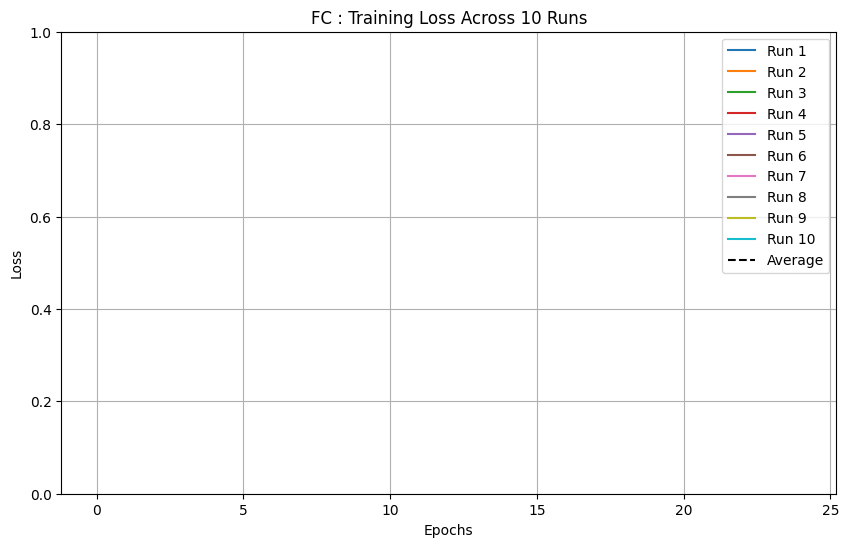

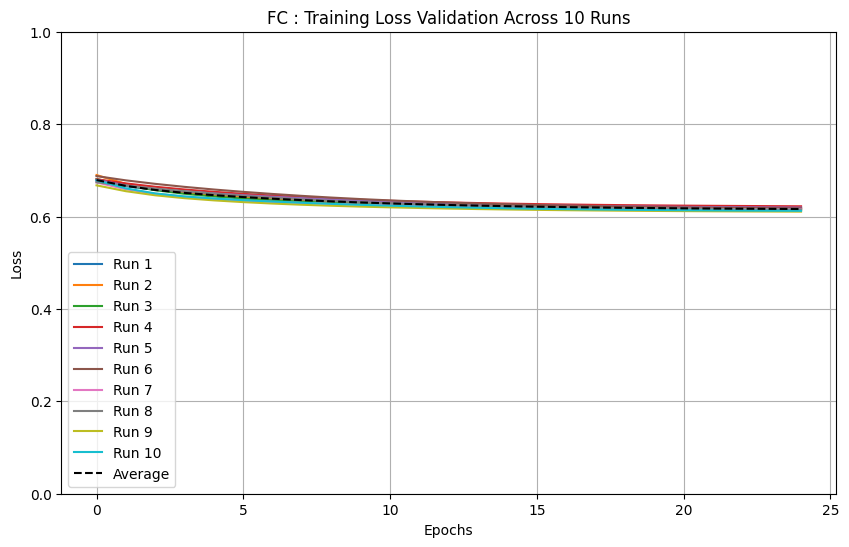

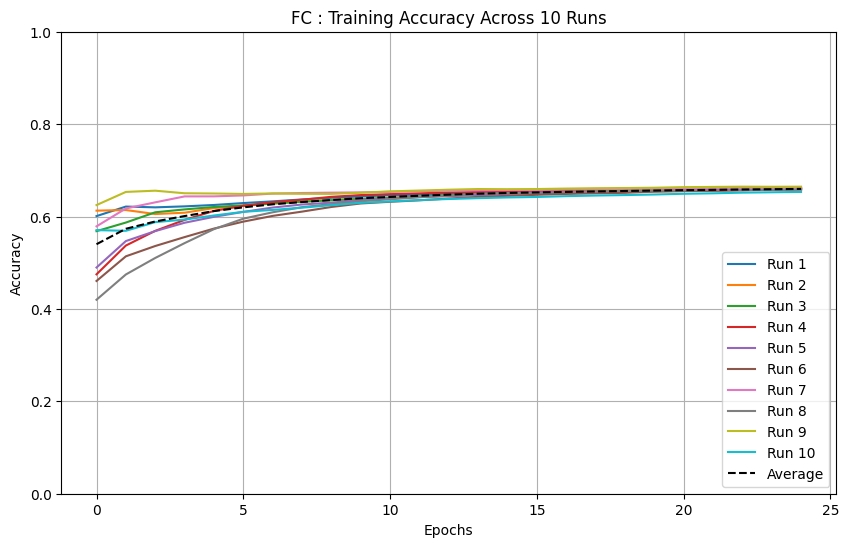

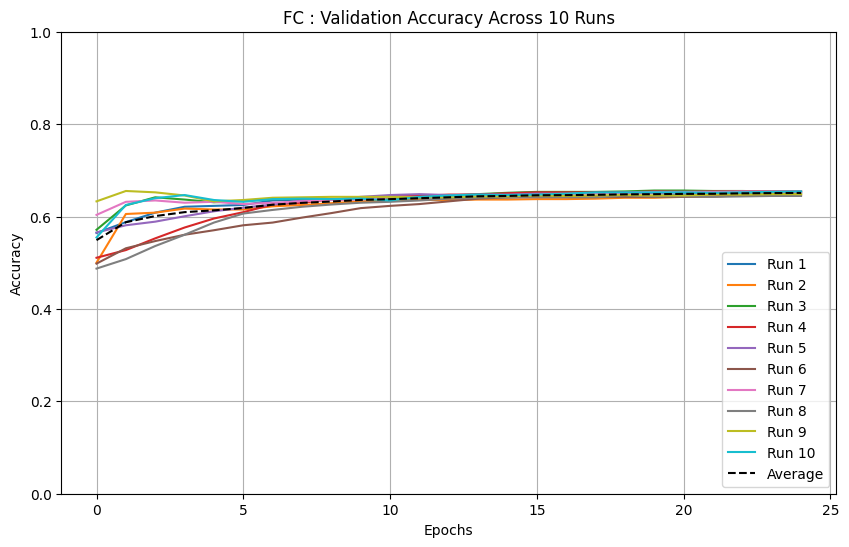

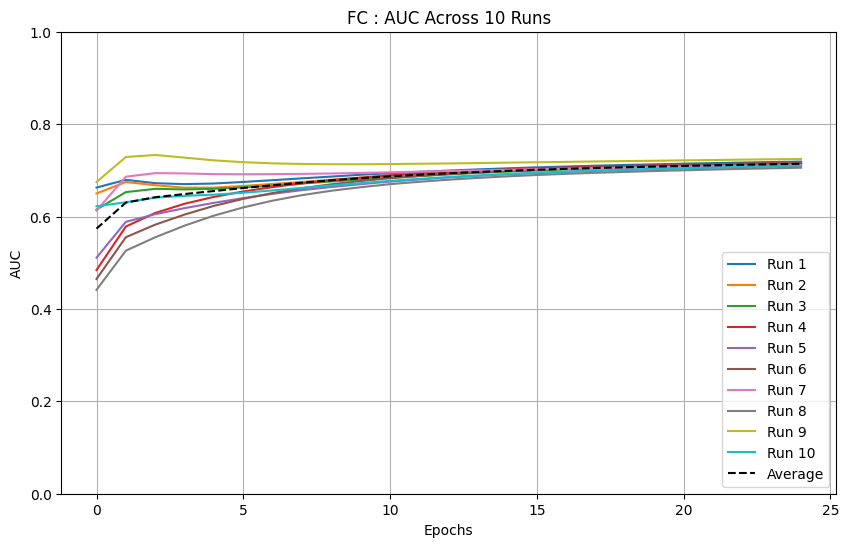

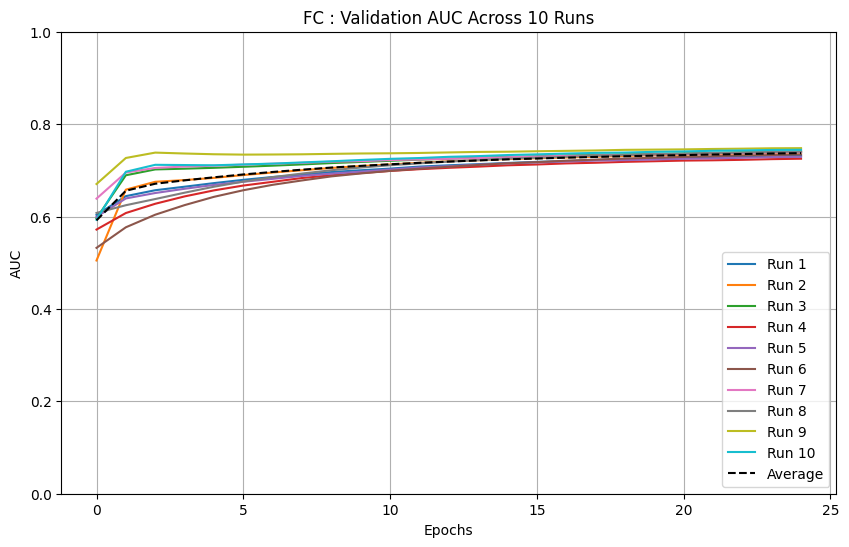

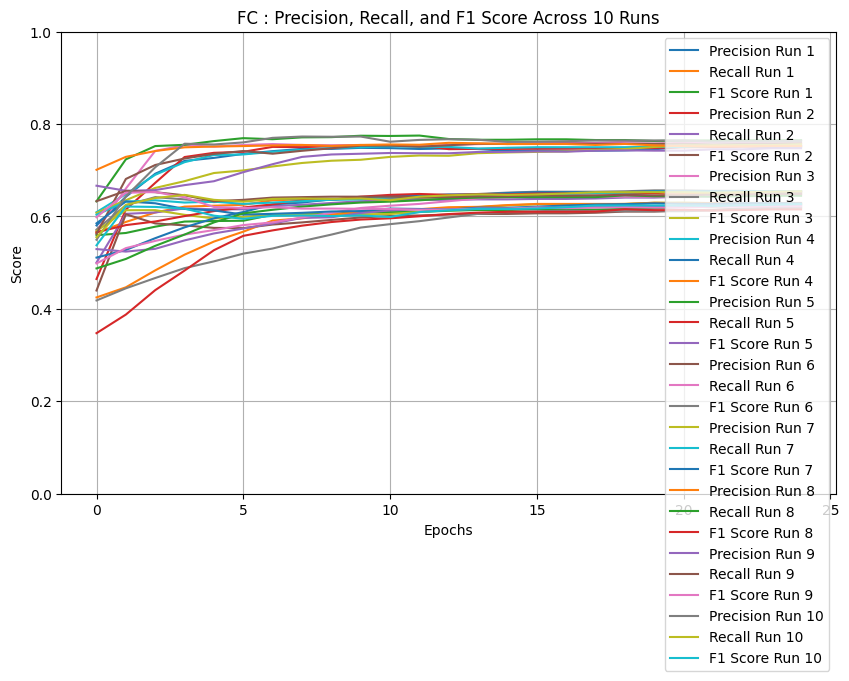

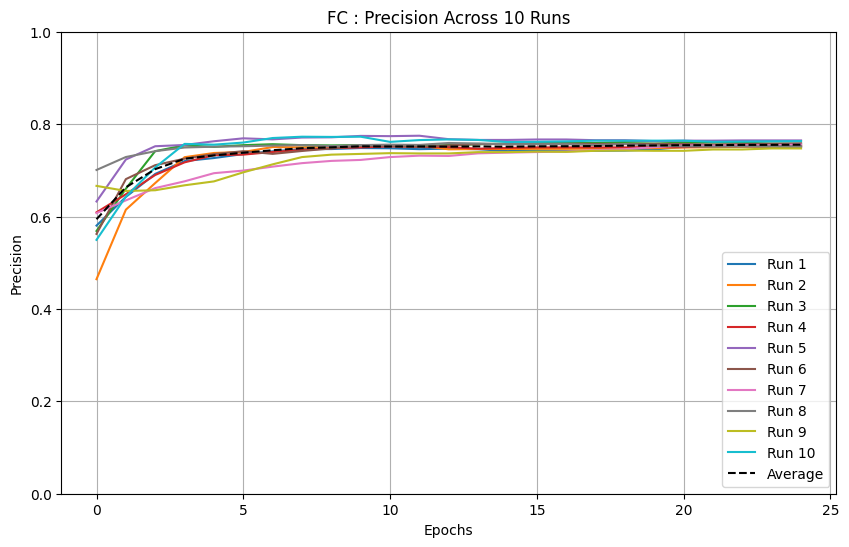

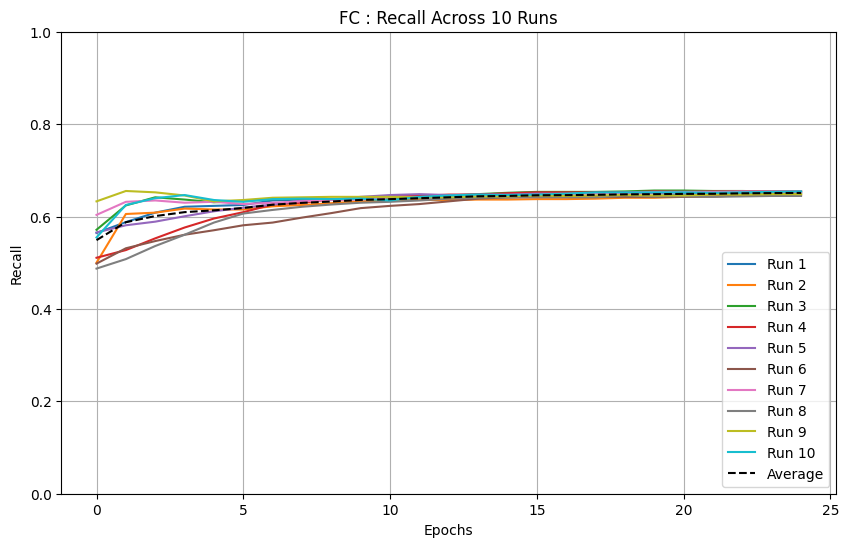

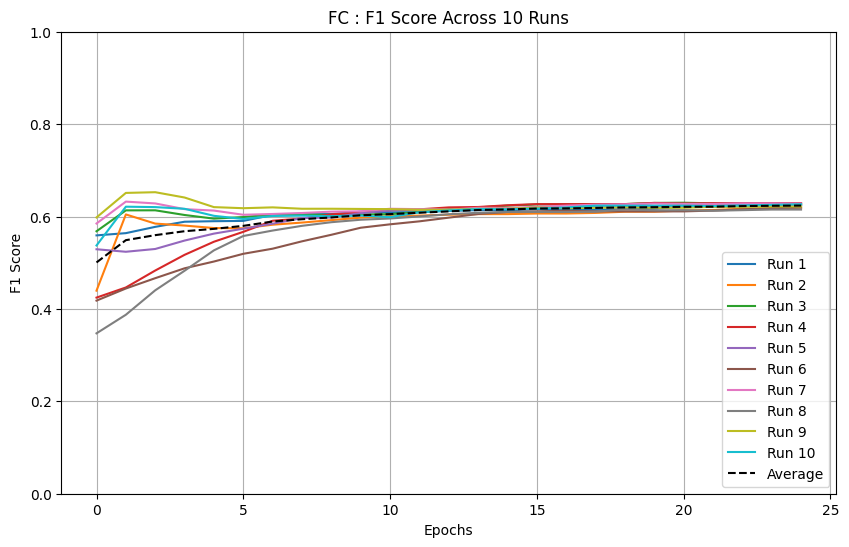

In [ ]:
model_n = 'FC'

avg_loss = np.mean(his_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_loss_val = np.mean(his_val_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_val_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss_val, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Validation Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()


avg_acc = np.mean(his_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, acc in enumerate(his_acc):
    plt.plot(acc, label=f"Run {i+1}")
plt.plot(avg_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Training Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_acc = np.mean(his_val_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_acc in enumerate(his_val_acc):
    plt.plot(val_acc, label=f"Run {i+1}")
plt.plot(avg_val_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_auc = np.mean(his_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, auc in enumerate(his_auc):
    plt.plot(auc, label=f"Run {i+1}")
plt.plot(avg_auc, label='Average', color='black', linestyle='--')
name=model_n+' : AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_auc = np.mean(his_val_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_auc in enumerate(his_val_auc):
    plt.plot(val_auc, label=f"Run {i+1}")
plt.plot(avg_val_auc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

plt.figure(figsize=(10, 6))
for i in range(num_runs):
    plt.plot(precision_list[i], label=f"Precision Run {i+1}")
    plt.plot(recall_list[i], label=f"Recall Run {i+1}")
    plt.plot(f_one[i], label=f"F1 Score Run {i+1}")
name=model_n+' : Precision, Recall, and F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_precision = np.mean(precision_list, axis=0)
avg_recall = np.mean(recall_list, axis=0)
avg_f1 = np.mean(f_one, axis=0)

# Plotting precision for each run
plt.figure(figsize=(10, 6))
for i, precision in enumerate(precision_list):
    plt.plot(precision, label=f"Run {i+1}")

# Plotting the average precision line
plt.plot(avg_precision, label='Average', color='black', linestyle='--')
name=model_n+' : Precision Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting recall for each run
plt.figure(figsize=(10, 6))
for i, recall in enumerate(recall_list):
    plt.plot(recall, label=f"Run {i+1}")

# Plotting the average recall line
plt.plot(avg_recall, label='Average', color='black', linestyle='--')
name=model_n+' : Recall Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting F1 score for each run
plt.figure(figsize=(10, 6))
for i, f1 in enumerate(f_one):
    plt.plot(f1, label=f"Run {i+1}")

# Plotting the average F1 score line
plt.plot(avg_f1, label='Average', color='black', linestyle='--')
name=model_n+' : F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

In [ ]:
sum_fc = [avg_loss,avg_loss_val,avg_acc ,avg_val_acc ,avg_auc ,avg_val_auc ,avg_precision ,avg_recall , avg_f1]

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, Input, Reshape, Attention, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform
from sklearn.model_selection import train_test_split

losses = []
accuracies = []
training_losses = []
training_accuracies = []
his_loss = []
his_val_loss = []
his_acc = []
his_val_acc = []
his_auc =[]
his_val_auc = []
precision_list = []
recall_list =[]
f_one = []

num_runs = 10
EPOCHS=25

# Modify your model training loop to include the custom callback
for i in range(num_runs):
    print(f"Run {i+1}/{num_runs}")

    # Build and compile model with a different random seed for each run
    model3 = build_and_compile_model3(seed=i)

    # Train the model
    history = model3.fit(
        train_ds,
        epochs=EPOCHS,
        validation_data=valid_ds,
        batch_size=BATCH_SIZE,
        class_weight=class_weight,
        callbacks=[MetricsCallback(validation_data=valid_ds)],
        verbose=2,
        shuffle=False
    )

    # Collect loss and accuracy
    loss, accuracy, _ = model.evaluate(valid_ds, verbose=0)
    t_loss, t_acc, _ = model.evaluate(train_ds, verbose=0)
    losses.append(loss)
    accuracies.append(accuracy)
    training_losses.append(t_loss)
    training_accuracies.append(t_acc)

    his_loss.append(history.history["loss"])
    his_val_loss.append(history.history["val_loss"])
    his_acc.append(history.history["accuracy"])
    his_val_acc.append(history.history["val_accuracy"])
    his_auc.append(history.history["auc"])
    his_val_auc.append(history.history["val_auc"])

    # Collect precision, recall, and F1 score
    precision_list.append(history.history['precision'])
    recall_list.append(history.history['recall'])
    f_one.append(history.history['f1_score'])

Run 1/10
Epoch 1/25
2/2 [==============================] - 0s 6ms/step
140/140 - 4s - loss: 1.4084 - accuracy: 0.5754 - auc: 0.6190 - val_loss: 0.6404 - val_accuracy: 0.6396 - val_auc: 0.7194 - precision: 0.7387 - recall: 0.6396 - f1_score: 0.6113 - 4s/epoch - 28ms/step
Epoch 2/25
2/2 [==============================] - 0s 5ms/step
140/140 - 2s - loss: 1.2873 - accuracy: 0.5974 - auc: 0.6629 - val_loss: 0.6201 - val_accuracy: 0.6387 - val_auc: 0.7279 - precision: 0.7592 - recall: 0.6387 - f1_score: 0.6050 - 2s/epoch - 12ms/step
Epoch 3/25
2/2 [==============================] - 0s 6ms/step
140/140 - 2s - loss: 1.2441 - accuracy: 0.6181 - auc: 0.6873 - val_loss: 0.6063 - val_accuracy: 0.6387 - val_auc: 0.7365 - precision: 0.7571 - recall: 0.6387 - f1_score: 0.6054 - 2s/epoch - 12ms/step
Epoch 4/25
2/2 [==============================] - 0s 4ms/step
140/140 - 2s - loss: 1.2120 - accuracy: 0.6287 - auc: 0.7019 - val_loss: 0.5973 - val_accuracy: 0.6426 - val_auc: 0.7437 - precision: 0.7633 - 

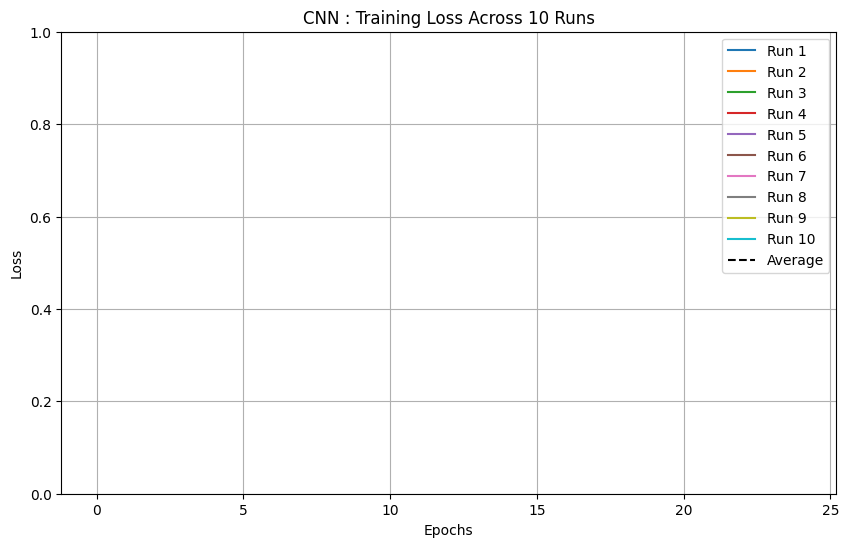

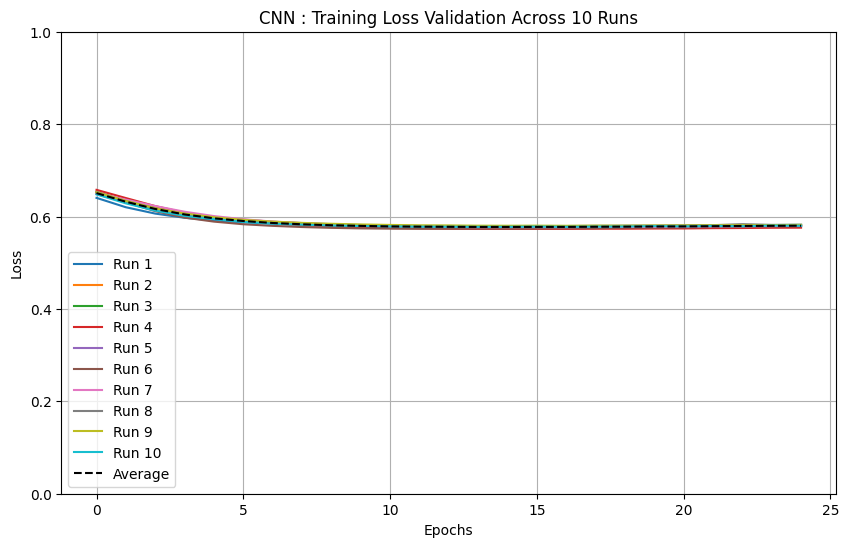

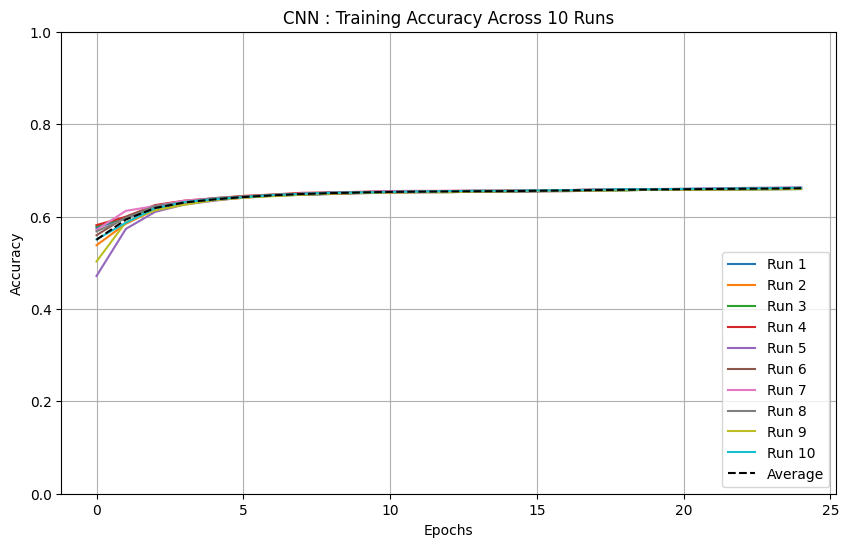

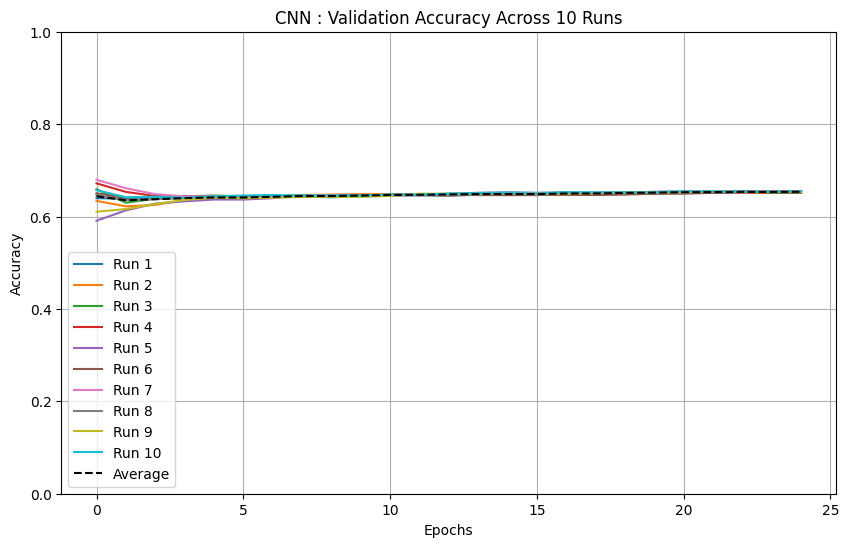

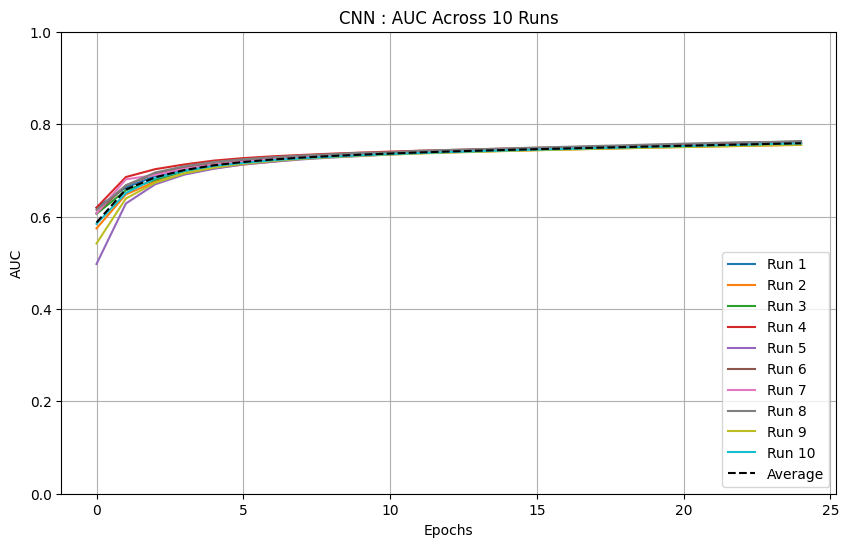

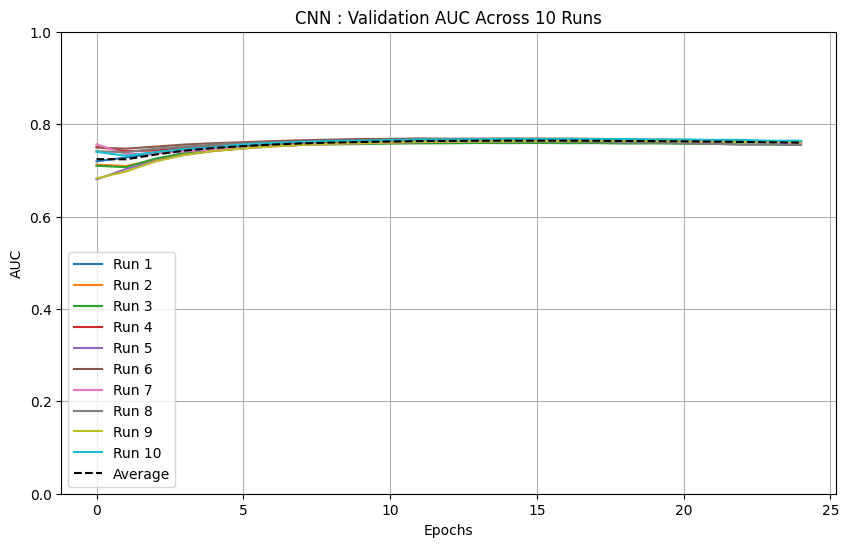

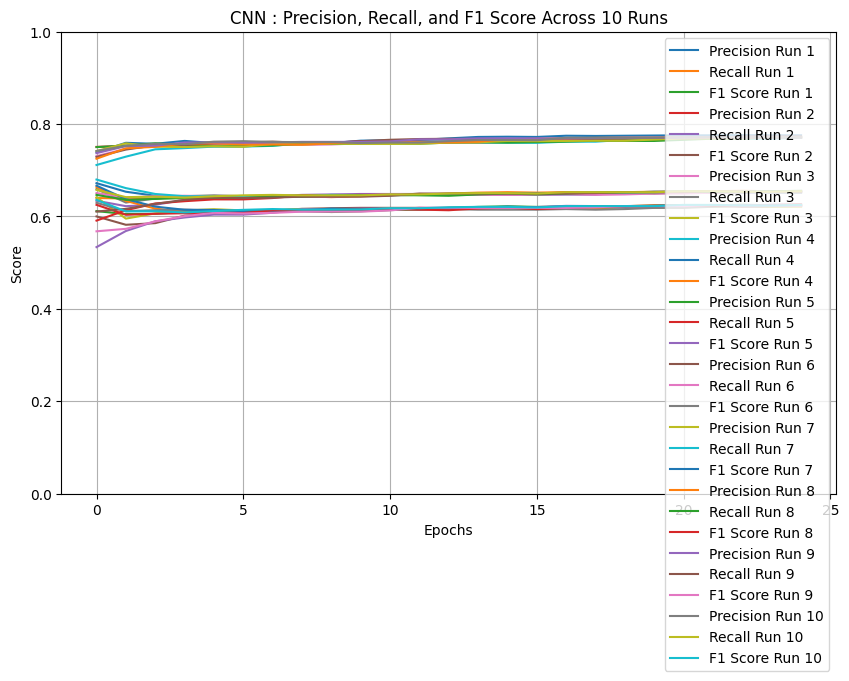

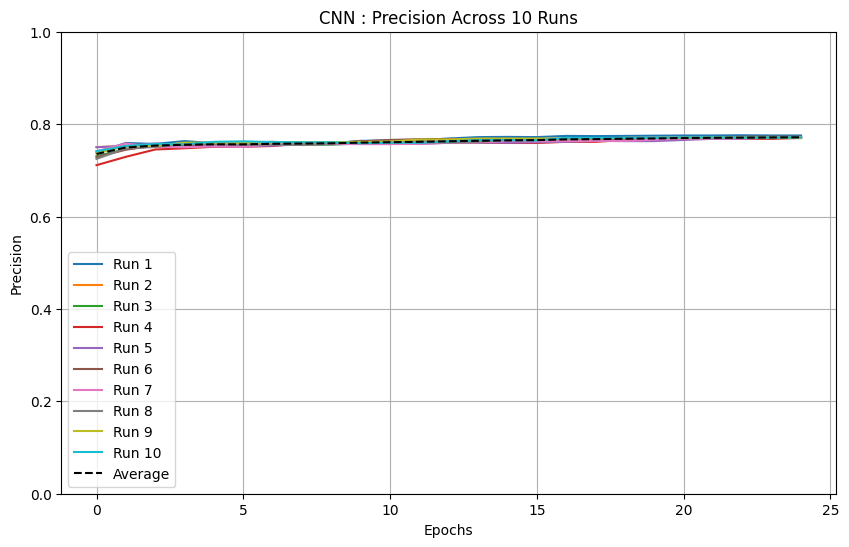

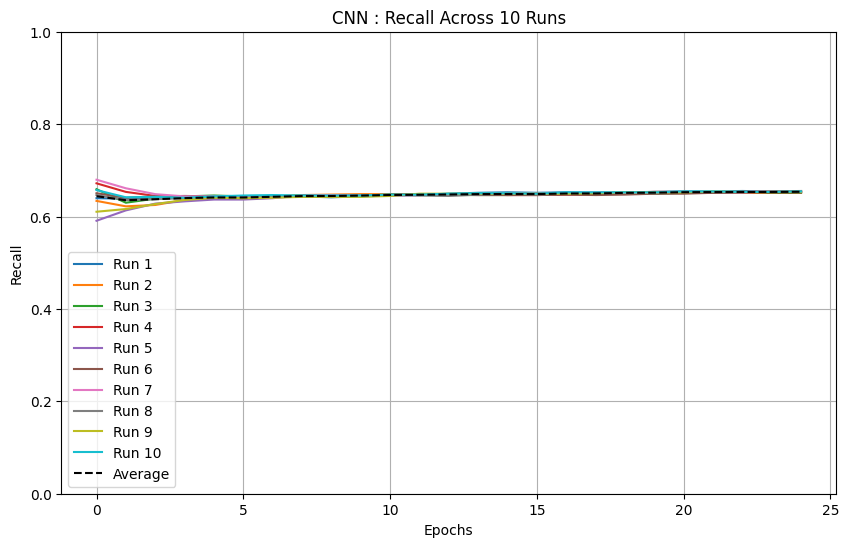

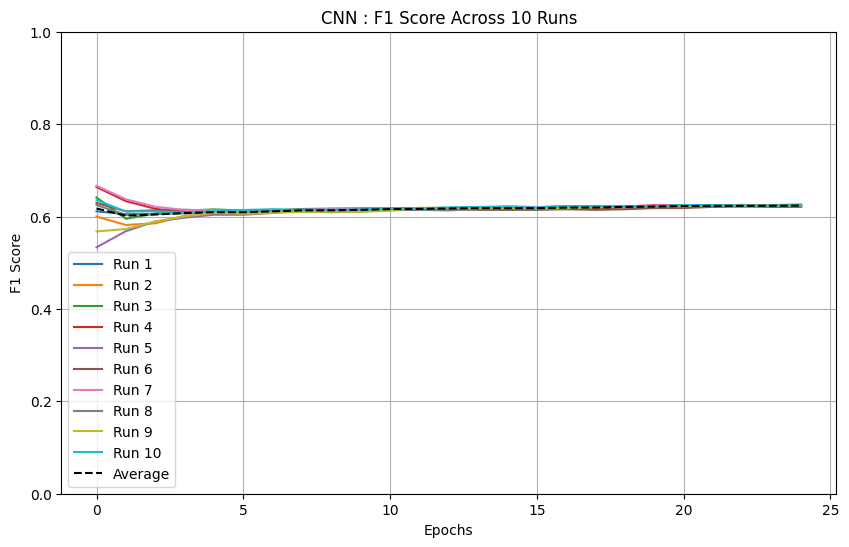

In [ ]:
model_n = 'CNN'

avg_loss = np.mean(his_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_loss_val = np.mean(his_val_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_val_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss_val, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Validation Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()


avg_acc = np.mean(his_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, acc in enumerate(his_acc):
    plt.plot(acc, label=f"Run {i+1}")
plt.plot(avg_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Training Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_acc = np.mean(his_val_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_acc in enumerate(his_val_acc):
    plt.plot(val_acc, label=f"Run {i+1}")
plt.plot(avg_val_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_auc = np.mean(his_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, auc in enumerate(his_auc):
    plt.plot(auc, label=f"Run {i+1}")
plt.plot(avg_auc, label='Average', color='black', linestyle='--')
name=model_n+' : AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_auc = np.mean(his_val_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_auc in enumerate(his_val_auc):
    plt.plot(val_auc, label=f"Run {i+1}")
plt.plot(avg_val_auc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

plt.figure(figsize=(10, 6))
for i in range(num_runs):
    plt.plot(precision_list[i], label=f"Precision Run {i+1}")
    plt.plot(recall_list[i], label=f"Recall Run {i+1}")
    plt.plot(f_one[i], label=f"F1 Score Run {i+1}")
name=model_n+' : Precision, Recall, and F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_precision = np.mean(precision_list, axis=0)
avg_recall = np.mean(recall_list, axis=0)
avg_f1 = np.mean(f_one, axis=0)

# Plotting precision for each run
plt.figure(figsize=(10, 6))
for i, precision in enumerate(precision_list):
    plt.plot(precision, label=f"Run {i+1}")

# Plotting the average precision line
plt.plot(avg_precision, label='Average', color='black', linestyle='--')
name=model_n+' : Precision Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting recall for each run
plt.figure(figsize=(10, 6))
for i, recall in enumerate(recall_list):
    plt.plot(recall, label=f"Run {i+1}")

# Plotting the average recall line
plt.plot(avg_recall, label='Average', color='black', linestyle='--')
name=model_n+' : Recall Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting F1 score for each run
plt.figure(figsize=(10, 6))
for i, f1 in enumerate(f_one):
    plt.plot(f1, label=f"Run {i+1}")

# Plotting the average F1 score line
plt.plot(avg_f1, label='Average', color='black', linestyle='--')
name=model_n+' : F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

sum_cnn = [avg_loss,avg_loss_val,avg_acc ,avg_val_acc ,avg_auc ,avg_val_auc ,avg_precision ,avg_recall , avg_f1]

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, Input, Reshape, Attention, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform
from sklearn.model_selection import train_test_split

losses = []
accuracies = []
training_losses = []
training_accuracies = []
his_loss = []
his_val_loss = []
his_acc = []
his_val_acc = []
his_auc =[]
his_val_auc = []
precision_list = []
recall_list =[]
f_one = []

num_runs = 10
EPOCHS=25

# Modify your model training loop to include the custom callback
for i in range(num_runs):
    print(f"Run {i+1}/{num_runs}")

    # Build and compile model with a different random seed for each run
    model2 = build_and_compile_model2(seed=i)

    # Train the model
    history = model2.fit(
        train_ds,
        epochs=EPOCHS,
        validation_data=valid_ds,
        batch_size=BATCH_SIZE,
        class_weight=class_weight,
        callbacks=[MetricsCallback(validation_data=valid_ds)],
        verbose=2,
        shuffle=False
    )

    # Collect loss and accuracy
    loss, accuracy, _ = model.evaluate(valid_ds, verbose=0)
    t_loss, t_acc, _ = model.evaluate(train_ds, verbose=0)
    losses.append(loss)
    accuracies.append(accuracy)
    training_losses.append(t_loss)
    training_accuracies.append(t_acc)

    his_loss.append(history.history["loss"])
    his_val_loss.append(history.history["val_loss"])
    his_acc.append(history.history["accuracy"])
    his_val_acc.append(history.history["val_accuracy"])
    his_auc.append(history.history["auc"])
    his_val_auc.append(history.history["val_auc"])

    # Collect precision, recall, and F1 score
    precision_list.append(history.history['precision'])
    recall_list.append(history.history['recall'])
    f_one.append(history.history['f1_score'])

In [ ]:
model_n = 'FC with Attention'

avg_loss = np.mean(his_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_loss_val = np.mean(his_val_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_val_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss_val, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Validation Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()


avg_acc = np.mean(his_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, acc in enumerate(his_acc):
    plt.plot(acc, label=f"Run {i+1}")
plt.plot(avg_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Training Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_acc = np.mean(his_val_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_acc in enumerate(his_val_acc):
    plt.plot(val_acc, label=f"Run {i+1}")
plt.plot(avg_val_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_auc = np.mean(his_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, auc in enumerate(his_auc):
    plt.plot(auc, label=f"Run {i+1}")
plt.plot(avg_auc, label='Average', color='black', linestyle='--')
name=model_n+' : AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_auc = np.mean(his_val_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_auc in enumerate(his_val_auc):
    plt.plot(val_auc, label=f"Run {i+1}")
plt.plot(avg_val_auc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

plt.figure(figsize=(10, 6))
for i in range(num_runs):
    plt.plot(precision_list[i], label=f"Precision Run {i+1}")
    plt.plot(recall_list[i], label=f"Recall Run {i+1}")
    plt.plot(f_one[i], label=f"F1 Score Run {i+1}")
name=model_n+' : Precision, Recall, and F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_precision = np.mean(precision_list, axis=0)
avg_recall = np.mean(recall_list, axis=0)
avg_f1 = np.mean(f_one, axis=0)

# Plotting precision for each run
plt.figure(figsize=(10, 6))
for i, precision in enumerate(precision_list):
    plt.plot(precision, label=f"Run {i+1}")

# Plotting the average precision line
plt.plot(avg_precision, label='Average', color='black', linestyle='--')
name=model_n+' : Precision Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting recall for each run
plt.figure(figsize=(10, 6))
for i, recall in enumerate(recall_list):
    plt.plot(recall, label=f"Run {i+1}")

# Plotting the average recall line
plt.plot(avg_recall, label='Average', color='black', linestyle='--')
name=model_n+' : Recall Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting F1 score for each run
plt.figure(figsize=(10, 6))
for i, f1 in enumerate(f_one):
    plt.plot(f1, label=f"Run {i+1}")

# Plotting the average F1 score line
plt.plot(avg_f1, label='Average', color='black', linestyle='--')
name=model_n+' : F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

sum_fcatt = [avg_loss,avg_loss_val,avg_acc ,avg_val_acc ,avg_auc ,avg_val_auc ,avg_precision ,avg_recall , avg_f1]

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, Input, Reshape, Attention, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform
from sklearn.model_selection import train_test_split

losses = []
accuracies = []
training_losses = []
training_accuracies = []
his_loss = []
his_val_loss = []
his_acc = []
his_val_acc = []
his_auc =[]
his_val_auc = []
precision_list = []
recall_list =[]
f_one = []

num_runs = 10
EPOCHS=25

# Modify your model training loop to include the custom callback
for i in range(num_runs):
    print(f"Run {i+1}/{num_runs}")

    # Build and compile model with a different random seed for each run
    model = build_and_compile_model(seed=i)

    # Train the model
    history = model.fit(
        train_ds,
        epochs=EPOCHS,
        validation_data=valid_ds,
        batch_size=BATCH_SIZE,
        class_weight=class_weight,
        callbacks=[MetricsCallback(validation_data=valid_ds)],
        verbose=2,
        shuffle=False
    )

    # Collect loss and accuracy
    loss, accuracy, _ = model.evaluate(valid_ds, verbose=0)
    t_loss, t_acc, _ = model.evaluate(train_ds, verbose=0)
    losses.append(loss)
    accuracies.append(accuracy)
    training_losses.append(t_loss)
    training_accuracies.append(t_acc)

    his_loss.append(history.history["loss"])
    his_val_loss.append(history.history["val_loss"])
    his_acc.append(history.history["accuracy"])
    his_val_acc.append(history.history["val_accuracy"])
    his_auc.append(history.history["auc"])
    his_val_auc.append(history.history["val_auc"])

    # Collect precision, recall, and F1 score
    precision_list.append(history.history['precision'])
    recall_list.append(history.history['recall'])
    f_one.append(history.history['f1_score'])

In [ ]:
model_n = 'CNN with Attention'

avg_loss = np.mean(his_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_loss_val = np.mean(his_val_loss, axis=0)
plt.figure(figsize=(10, 6))
for i, loss in enumerate(his_val_loss):
    plt.plot(loss, label=f"Run {i+1}")
plt.plot(avg_loss_val, label='Average', color='black', linestyle='--')
name=model_n+' : Training Loss Validation Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim(0,1)
plt.legend()
plt.grid(True)
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()


avg_acc = np.mean(his_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, acc in enumerate(his_acc):
    plt.plot(acc, label=f"Run {i+1}")
plt.plot(avg_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Training Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_acc = np.mean(his_val_acc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_acc in enumerate(his_val_acc):
    plt.plot(val_acc, label=f"Run {i+1}")
plt.plot(avg_val_acc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation Accuracy Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_auc = np.mean(his_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, auc in enumerate(his_auc):
    plt.plot(auc, label=f"Run {i+1}")
plt.plot(avg_auc, label='Average', color='black', linestyle='--')
name=model_n+' : AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_val_auc = np.mean(his_val_auc, axis=0)
plt.figure(figsize=(10, 6))
for i, val_auc in enumerate(his_val_auc):
    plt.plot(val_auc, label=f"Run {i+1}")
plt.plot(avg_val_auc, label='Average', color='black', linestyle='--')
name=model_n+' : Validation AUC Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('AUC')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

plt.figure(figsize=(10, 6))
for i in range(num_runs):
    plt.plot(precision_list[i], label=f"Precision Run {i+1}")
    plt.plot(recall_list[i], label=f"Recall Run {i+1}")
    plt.plot(f_one[i], label=f"F1 Score Run {i+1}")
name=model_n+' : Precision, Recall, and F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

avg_precision = np.mean(precision_list, axis=0)
avg_recall = np.mean(recall_list, axis=0)
avg_f1 = np.mean(f_one, axis=0)

# Plotting precision for each run
plt.figure(figsize=(10, 6))
for i, precision in enumerate(precision_list):
    plt.plot(precision, label=f"Run {i+1}")

# Plotting the average precision line
plt.plot(avg_precision, label='Average', color='black', linestyle='--')
name=model_n+' : Precision Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Precision')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting recall for each run
plt.figure(figsize=(10, 6))
for i, recall in enumerate(recall_list):
    plt.plot(recall, label=f"Run {i+1}")

# Plotting the average recall line
plt.plot(avg_recall, label='Average', color='black', linestyle='--')
name=model_n+' : Recall Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('Recall')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

# Plotting F1 score for each run
plt.figure(figsize=(10, 6))
for i, f1 in enumerate(f_one):
    plt.plot(f1, label=f"Run {i+1}")

# Plotting the average F1 score line
plt.plot(avg_f1, label='Average', color='black', linestyle='--')
name=model_n+' : F1 Score Across 10 Runs'
plt.title(name)
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.ylim(0,1)
plt.legend()
plt.grid(True)  # Add grid
plt.savefig('/content/drive/MyDrive/A_senior_project/Model_plots/'+name+'.png')
plt.show()

sum_cnnatt = [avg_loss,avg_loss_val,avg_acc ,avg_val_acc ,avg_auc ,avg_val_auc ,avg_precision ,avg_recall , avg_f1]

In [ ]:
model2_results= [losses,accuracies]
m2training = [training_losses,training_accuracies]

Run 1/10 with seed 0
Epoch 1/12
140/140 - 7s - loss: 1.4370 - accuracy: 0.5655 - auc: 0.5851 - val_loss: 0.6521 - val_accuracy: 0.6367 - val_auc: 0.7513 - 7s/epoch - 53ms/step
Epoch 2/12
140/140 - 7s - loss: 1.3015 - accuracy: 0.5887 - auc: 0.6548 - val_loss: 0.6331 - val_accuracy: 0.6318 - val_auc: 0.7404 - 7s/epoch - 51ms/step
Epoch 3/12
140/140 - 6s - loss: 1.2622 - accuracy: 0.6125 - auc: 0.6836 - val_loss: 0.6141 - val_accuracy: 0.6377 - val_auc: 0.7516 - 6s/epoch - 42ms/step
Epoch 4/12
140/140 - 8s - loss: 1.2257 - accuracy: 0.6288 - auc: 0.7033 - val_loss: 0.5986 - val_accuracy: 0.6348 - val_auc: 0.7593 - 8s/epoch - 54ms/step
Epoch 5/12
140/140 - 9s - loss: 1.1990 - accuracy: 0.6372 - auc: 0.7146 - val_loss: 0.5887 - val_accuracy: 0.6387 - val_auc: 0.7640 - 9s/epoch - 66ms/step
Epoch 6/12
140/140 - 6s - loss: 1.1799 - accuracy: 0.6431 - auc: 0.7216 - val_loss: 0.5823 - val_accuracy: 0.6406 - val_auc: 0.7664 - 6s/epoch - 45ms/step
Epoch 7/12
140/140 - 7s - loss: 1.1655 - accuracy

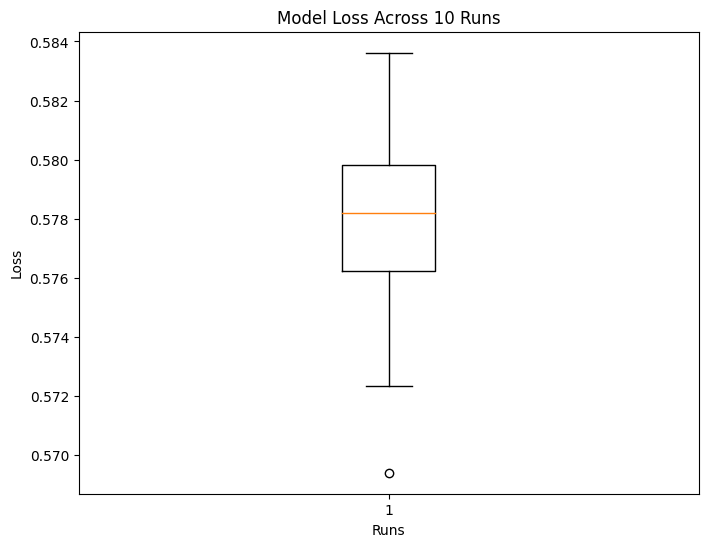

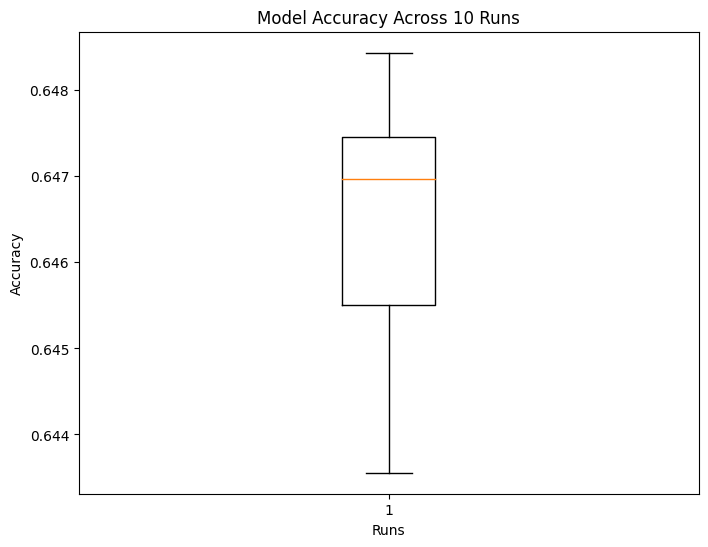

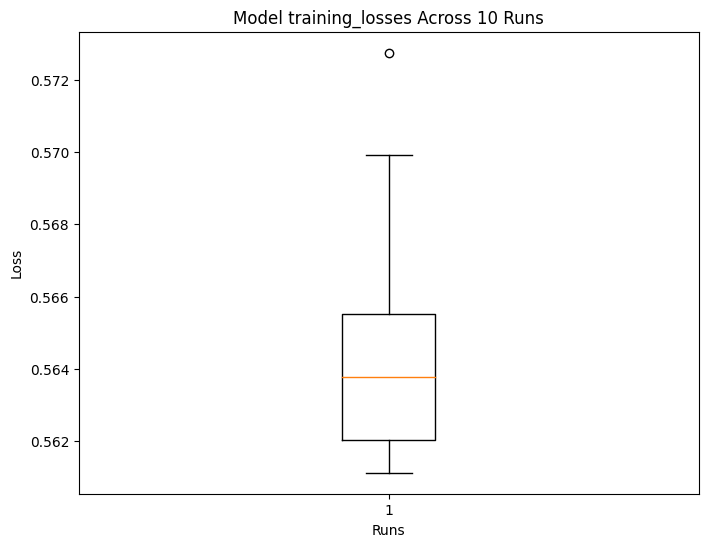

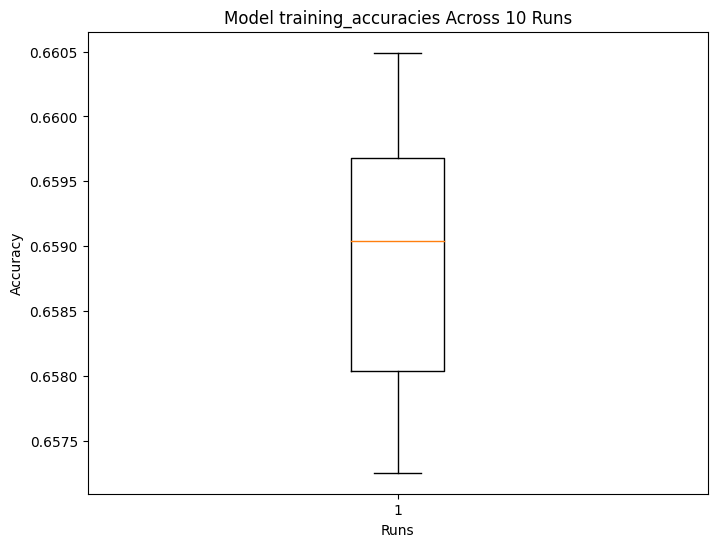

Seed numbers: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Softmax, Dense, Input, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform

# Assuming you have defined your dataset and other necessary variables
# train_ds, valid_ds, EPOCHS, BATCH_SIZE, class_weight, callbacks, class_names

def build_and_compile_model(seed=None):
    K.clear_session()
    tf.random.set_seed(seed)  # Set the random seed for TensorFlow operations
    np.random.seed(seed)  # Set the random seed for numpy operations

    inputs = Input(shape=(1024,), name="embedding")

    # Reshape input for Conv1D layer
    x = Reshape((1024, 1))(inputs)

    # Add a Conv1D layer
    x = Conv1D(32, 3, activation='relu', padding='same', kernel_initializer=GlorotUniform(seed=42))(x)
    x = MaxPooling1D(pool_size=2)(x)

    # Flatten the output before passing it to dense layers
    x = Flatten()(x)

    # Continue with your existing architecture
    x = Dense(64, activation="relu", kernel_initializer=GlorotUniform(seed=42), name="dense_1")(x)

    outputs = Dense(len(class_names), activation=None, name="output")(x)
    outputs = Softmax()(outputs)  # Add Softmax activation here

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=tf.keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", tf.keras.metrics.AUC(name="auc")],
    )

    return model

# Number of runs with different random seeds
num_runs = 10
EPOCHS = 12
# Lists to store loss and accuracy for each run
losses = []
accuracies = []
seeds = []
training_losses = []
training_accuracies = []

for i in range(num_runs):
    seed = i
    seeds.append(seed)
    print(f"Run {i+1}/{num_runs} with seed {seed}")

    # Clearing the Keras session to release memory and avoid resource contention
    tf.keras.backend.clear_session()

    # Build and compile model with a different random seed for each run
    model = build_and_compile_model(seed=seed)

    # Train the model
    history = model.fit(
        train_ds,
        epochs=EPOCHS,
        validation_data=valid_ds,
        batch_size=BATCH_SIZE,
        class_weight=class_weight,
        #callbacks=callbacks,
        verbose=2,
        shuffle=False
    )

    # Collect loss and accuracy
    loss, accuracy, _ = model.evaluate(valid_ds, verbose=0)
    t_loss, t_acc, _ = model.evaluate(train_ds, verbose=0)
    losses.append(loss)
    accuracies.append(accuracy)
    training_losses.append(t_loss)
    training_accuracies.append(t_acc)

# Plot boxplot for losses
plt.figure(figsize=(8, 6))
plt.boxplot(losses)
plt.title('Model Loss Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Loss')
plt.show()

# Plot boxplot for accuracies
plt.figure(figsize=(8, 6))
plt.boxplot(accuracies)
plt.title('Model Accuracy Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Accuracy')
plt.show()

plt.figure(figsize=(8, 6))
plt.boxplot(training_losses)
plt.title('Model training_losses Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Loss')
plt.show()

# Plot boxplot for accuracies
plt.figure(figsize=(8, 6))
plt.boxplot(training_accuracies)
plt.title('Model training_accuracies Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Accuracy')
plt.show()

# Print seed numbers
print("Seed numbers:", seeds)
model3_results= [losses,accuracies]
m3training = [training_losses,training_accuracies]

Run 1/10 with seed 0
Epoch 1/25
140/140 - 2s - loss: 1.3824 - accuracy: 0.5376 - auc: 0.5785 - val_loss: 0.6702 - val_accuracy: 0.5820 - val_auc: 0.6313 - 2s/epoch - 17ms/step
Epoch 2/25
140/140 - 1s - loss: 1.3429 - accuracy: 0.5686 - auc: 0.6162 - val_loss: 0.6576 - val_accuracy: 0.5898 - val_auc: 0.6572 - 694ms/epoch - 5ms/step
Epoch 3/25
140/140 - 0s - loss: 1.3194 - accuracy: 0.5827 - auc: 0.6279 - val_loss: 0.6504 - val_accuracy: 0.5986 - val_auc: 0.6682 - 479ms/epoch - 3ms/step
Epoch 4/25
140/140 - 0s - loss: 1.3026 - accuracy: 0.5914 - auc: 0.6384 - val_loss: 0.6454 - val_accuracy: 0.6035 - val_auc: 0.6776 - 490ms/epoch - 3ms/step
Epoch 5/25
140/140 - 0s - loss: 1.2893 - accuracy: 0.6019 - auc: 0.6480 - val_loss: 0.6414 - val_accuracy: 0.6113 - val_auc: 0.6856 - 430ms/epoch - 3ms/step
Epoch 6/25
140/140 - 0s - loss: 1.2780 - accuracy: 0.6096 - auc: 0.6566 - val_loss: 0.6380 - val_accuracy: 0.6182 - val_auc: 0.6918 - 471ms/epoch - 3ms/step
Epoch 7/25
140/140 - 0s - loss: 1.2683 

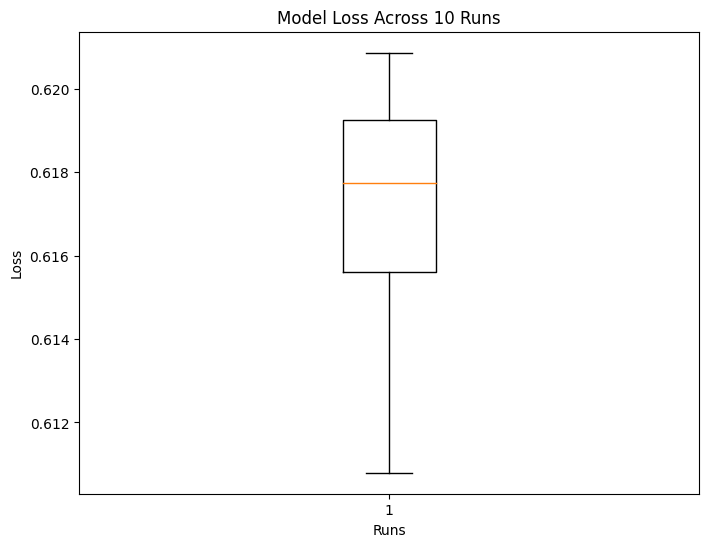

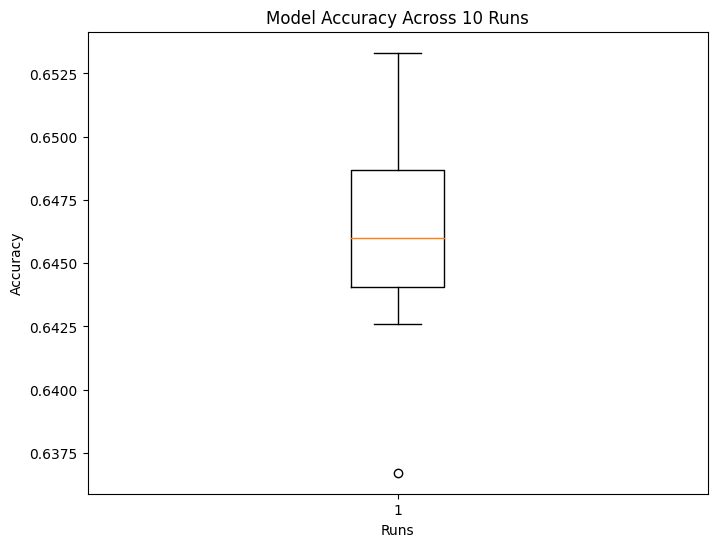

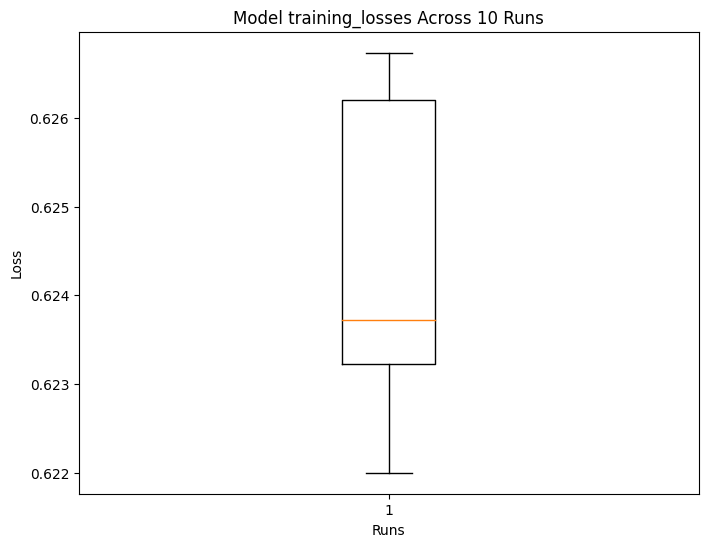

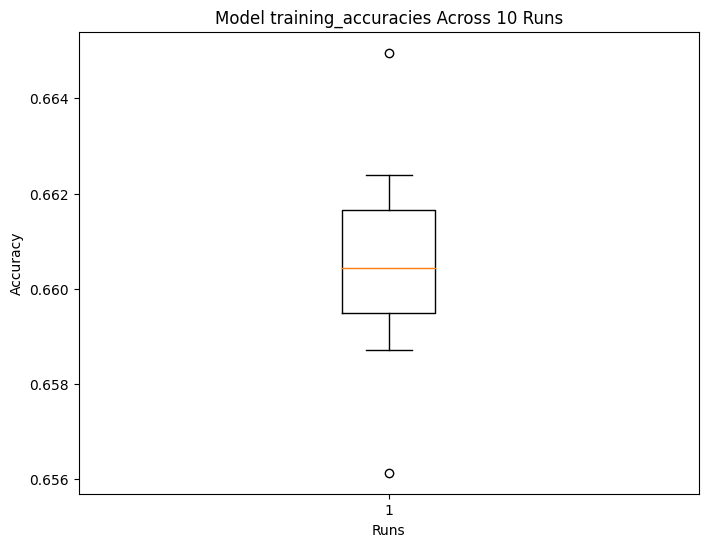

Seed numbers: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Input, Softmax
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import GlorotUniform

# Assuming you have defined your dataset and other necessary variables
# train_ds, valid_ds, EPOCHS, BATCH_SIZE, class_weight, callbacks, class_names

K.clear_session()

def build_and_compile_model(seed=None):
    K.clear_session()
    tf.random.set_seed(seed)  # Set the random seed for TensorFlow operations
    np.random.seed(seed)  # Set the random seed for numpy operations

    inputs = Input(shape=(1024,), name="embedding")

    # Using GlorotUniform initializer for the dense layer
    x = Dense(64, activation="relu", kernel_initializer=GlorotUniform(seed=42), name="dense_1")(inputs)
    outputs = Dense(len(class_names), activation="softmax", name="output")(x)
    outputs = Softmax()(outputs)

    model = Model(inputs=inputs, outputs=outputs, name="accent_recognition")

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1.9644e-5),
        loss=tf.keras.losses.CategoricalCrossentropy(),
        metrics=["accuracy", tf.keras.metrics.AUC(name="auc")],
    )

    return model

# Number of runs with different random seeds
num_runs = 10
EPOCHS = 25
# Lists to store loss and accuracy for each run
losses = []
accuracies = []
seeds = []
training_losses = []
training_accuracies = []

for i in range(num_runs):
    seed = i
    seeds.append(seed)
    print(f"Run {i+1}/{num_runs} with seed {seed}")

    # Clearing the Keras session to release memory and avoid resource contention
    tf.keras.backend.clear_session()

    # Build and compile model with a different random seed for each run
    model = build_and_compile_model(seed=seed)

    # Train the model
    history = model.fit(
        train_ds,
        epochs=EPOCHS,
        validation_data=valid_ds,
        batch_size=BATCH_SIZE,
        class_weight=class_weight,
        #callbacks=callbacks,
        verbose=2,
        shuffle=False
    )

    # Collect loss and accuracy
    loss, accuracy, _ = model.evaluate(valid_ds, verbose=0)
    t_loss, t_acc, _ = model.evaluate(train_ds, verbose=0)
    losses.append(loss)
    accuracies.append(accuracy)
    training_losses.append(t_loss)
    training_accuracies.append(t_acc)

# Plot boxplot for losses
plt.figure(figsize=(8, 6))
plt.boxplot(losses)
plt.title('Model Loss Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Loss')
plt.show()

# Plot boxplot for accuracies
plt.figure(figsize=(8, 6))
plt.boxplot(accuracies)
plt.title('Model Accuracy Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Accuracy')
plt.show()

plt.figure(figsize=(8, 6))
plt.boxplot(training_losses)
plt.title('Model training_losses Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Loss')
plt.show()

# Plot boxplot for accuracies
plt.figure(figsize=(8, 6))
plt.boxplot(training_accuracies)
plt.title('Model training_accuracies Across 10 Runs')
plt.xlabel('Runs')
plt.ylabel('Accuracy')
plt.show()

# Print seed numbers
print("Seed numbers:", seeds)

model4_results= [losses,accuracies]
m4training = [training_losses,training_accuracies]

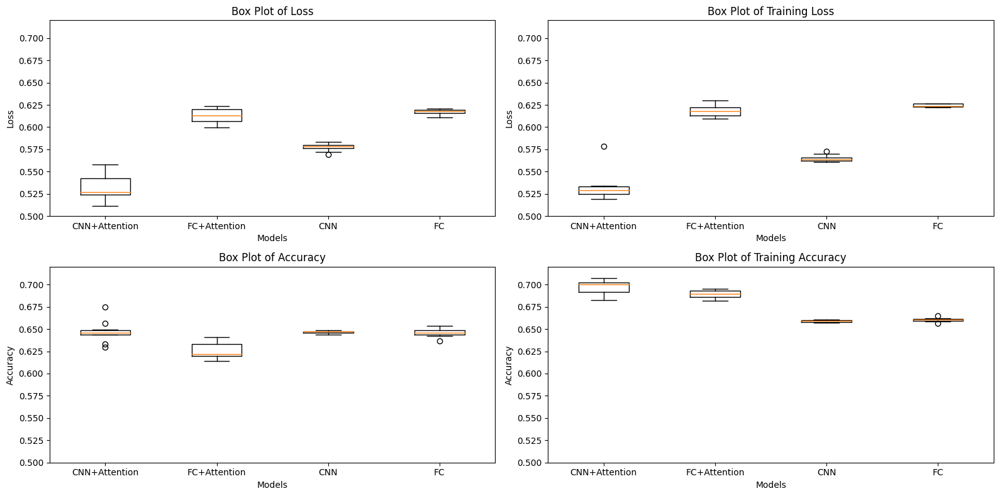

In [ ]:
import matplotlib.pyplot as plt

loss_list_model_results = [model1_results[0], model2_results[0], model3_results[0], model4_results[0]]
loss_list_training = [m1training[0], m2training[0], m3training[0], m4training[0]]
acc_list_model_results = [model1_results[1], model2_results[1], model3_results[1], model4_results[1]]
acc_list_training = [m1training[1], m2training[1], m3training[1], m4training[1]]

plt.figure(figsize=(16, 8))

# Plot boxplot for model results (loss)
plt.subplot(2, 2, 1)
plt.boxplot(loss_list_model_results)
plt.ylim(0.50,0.72) # Set the y-axis range
plt.xlabel('Models')
plt.ylabel('Loss')
plt.title('Box Plot of Loss')
plt.xticks([1, 2, 3, 4], ['CNN+Attention', 'FC+Attention', 'CNN', 'FC'])

# Plot boxplot for model results (accuracy)
plt.subplot(2, 2, 2)
plt.boxplot(loss_list_training)
plt.ylim(0.50,0.72)  # Set the y-axis range
plt.xlabel('Models')
plt.ylabel('Loss')
plt.title('Box Plot of Training Loss')
plt.xticks([1, 2, 3, 4], ['CNN+Attention', 'FC+Attention', 'CNN', 'FC'])

# Plot boxplot for training loss
plt.subplot(2, 2, 3)
plt.boxplot(acc_list_model_results)
plt.ylim(0.50,0.72)   # Set the y-axis range
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Box Plot of Accuracy')
plt.xticks([1, 2, 3, 4], ['CNN+Attention', 'FC+Attention', 'CNN', 'FC'])

# Plot boxplot for training accuracy
plt.subplot(2, 2, 4)
plt.boxplot(acc_list_training)
plt.ylim(0.50,0.72) # Set the y-axis range
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Box Plot of Training Accuracy')
plt.xticks([1, 2, 3, 4], ['CNN+Attention', 'FC+Attention', 'CNN', 'FC'])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

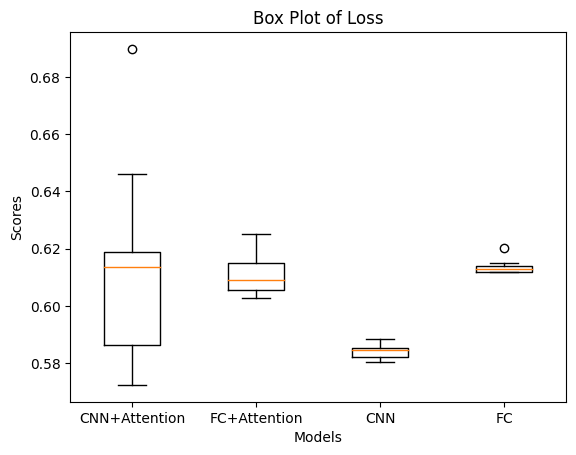

In [ ]:
loss_list = [model1_results[0], model2_results[0], model3_results[0], model4_results[0]]
plt.boxplot(loss_list)

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Box Plot of Loss')

plt.xticks([1, 2, 3, 4], ['CNN+Attention', 'FC+Attention', 'CNN', 'FC'])
plt.show()

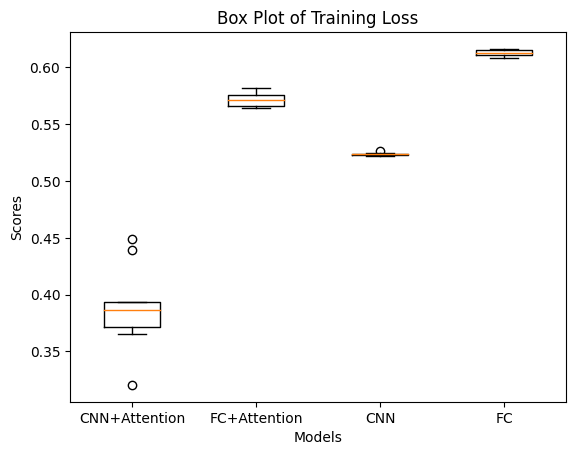

In [ ]:
loss_list = [m1training[0],m2training[0],m3training[0],m4training[0]]
plt.boxplot(loss_list)

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Box Plot of Training Loss')

plt.xticks([1, 2,3,4], ['CNN+Attention', 'FC+Attention', 'CNN', 'FC'])
plt.show()

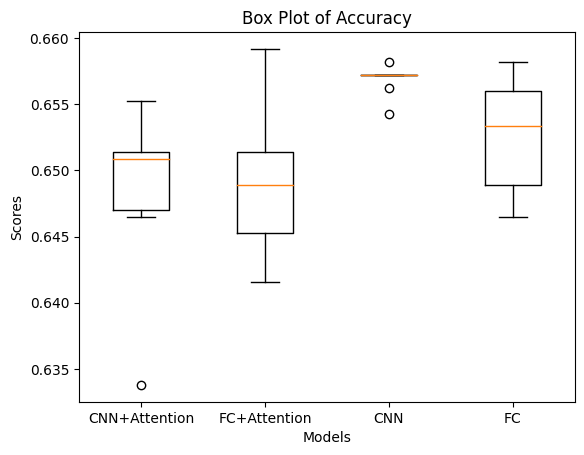

In [ ]:
acc_list = [model1_results[1], model2_results[1], model3_results[1], model4_results[1]]
plt.boxplot(acc_list)

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Box Plot of Accuracy')

plt.xticks([1, 2, 3, 4], ['CNN+Attention', 'FC+Attention', 'CNN', 'FC'])
plt.show()

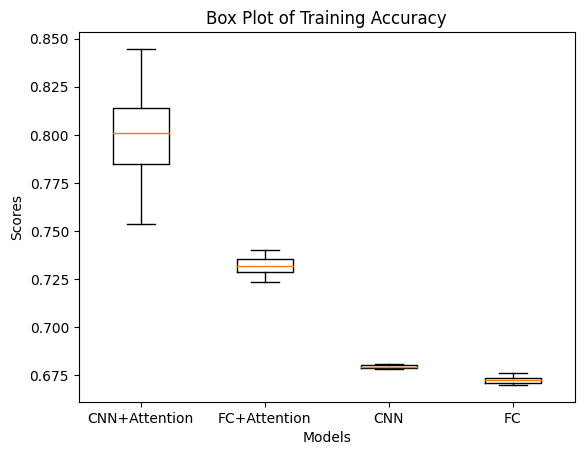

In [ ]:
acc_list = [m1training[1],m2training[1],m3training[1],m4training[1]]
plt.boxplot(acc_list)

plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Box Plot of Training Accuracy')

plt.xticks([1, 2,3,4], ['CNN+Attention', 'FC+Attention','CNN', 'FC'])
plt.show()

###Plot

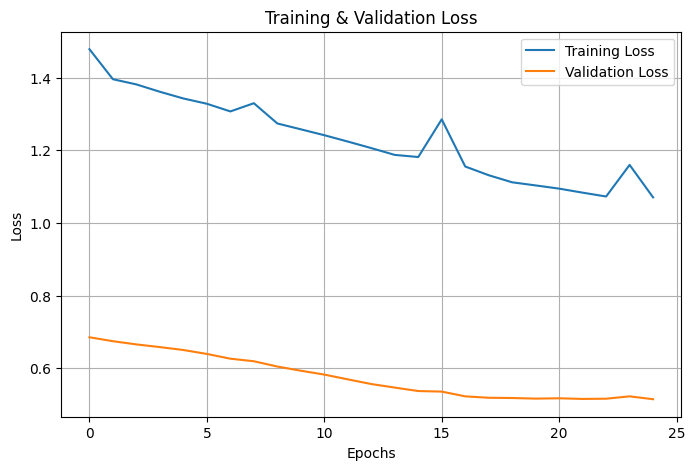

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 5))

EPOCHS = 25

ax.plot(range(EPOCHS), history.history["loss"], label="Training Loss")
ax.plot(range(EPOCHS), history.history["val_loss"], label="Validation Loss")
ax.set_xlabel("Epochs")
ax.set_ylabel("Loss")
ax.set_title("Training & Validation Loss")
ax.legend()
ax.grid(True)

plt.show()

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))

# Assuming history contains the history object from model training

# Function to calculate F1 score
def f1_score(precision, recall):
    return 2 * (precision * recall) / (precision + recall)

# Calculate precision, recall, and F1 score
precision = history.history['precision']
recall = history.history['recall']
f1 = [f1_score(p, r) for p, r in zip(precision, recall)]

# Plot recall and F1 score
axs[0].plot(range(EPOCHS), recall, label="Recall")
axs[0].plot(range(EPOCHS), f1, label="F1 Score")
axs[0].set_xlabel("Epochs")
axs[0].set_title("Recall & F1 Score")
axs[0].legend()
axs[0].grid(True)

# Plot AUC (you already have this part)
axs[1].plot(range(EPOCHS), history.history["auc"], label="Training")
axs[1].plot(range(EPOCHS), history.history["val_auc"], label="Validation")
axs[1].set_xlabel("Epochs")
axs[1].set_title("Training & Validation AUC")
axs[1].legend()
axs[1].grid(True)

plt.show()

0.6981026530265808
dict_keys(['loss', 'accuracy', 'auc', 'val_loss', 'val_accuracy', 'val_auc'])


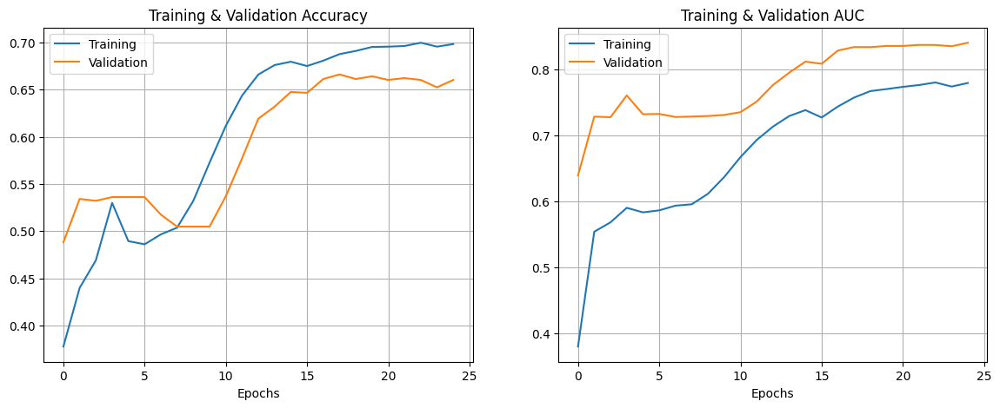

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))

def Average(lst):
    return sum(lst) / len(lst)
print(history.history['accuracy'][len(history.history['accuracy'])-1])

print(history.history.keys())
EPOCHS=25
axs[0].plot(range(EPOCHS), history.history["accuracy"], label="Training")
axs[0].plot(range(EPOCHS), history.history["val_accuracy"], label="Validation")
axs[0].set_xlabel("Epochs")
axs[0].set_title("Training & Validation Accuracy")
axs[0].legend()
axs[0].grid(True)

axs[1].plot(range(EPOCHS), history.history["auc"], label="Training")
axs[1].plot(range(EPOCHS), history.history["val_auc"], label="Validation")
axs[1].set_xlabel("Epochs")
axs[1].set_title("Training & Validation AUC")
axs[1].legend()
axs[1].grid(True)

plt.show()

In [ ]:
model.save('my_model.keras')

In [ ]:
train_loss, train_acc, train_auc = model.evaluate(train_ds)
valid_loss, valid_acc, valid_auc = model.evaluate(valid_ds)

16/16 [==============================] - 0s 7ms/step - loss: 0.5014 - accuracy: 0.7979 - auc: 0.8486


32/32 [==============================] - 0s 2ms/step


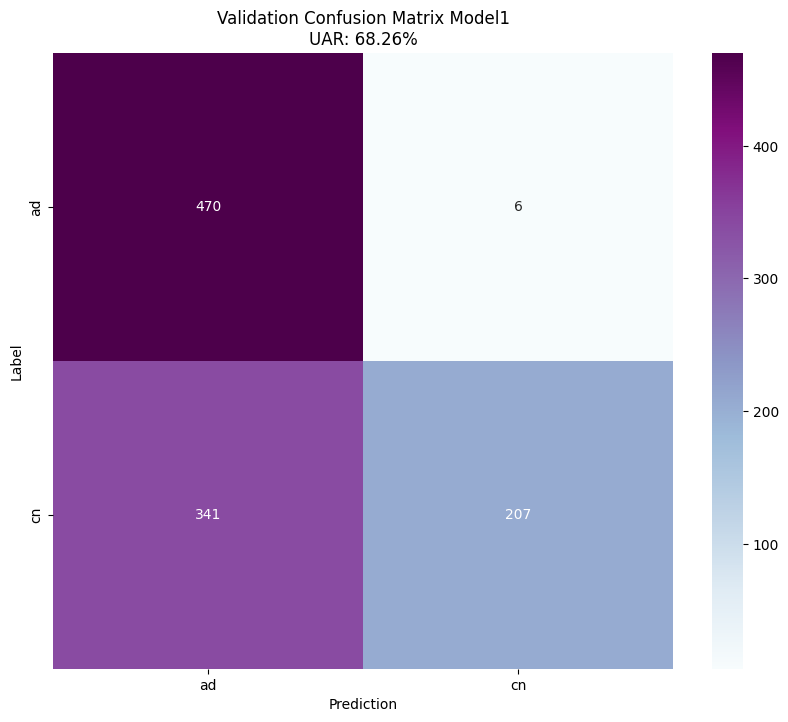

In [ ]:
x_valid = None
y_valid = None

for x, y in iter(valid_ds):
    if x_valid is None:
        x_valid = x.numpy()
        y_valid = y.numpy()
    else:
        x_valid = np.concatenate((x_valid, x.numpy()), axis=0)
        y_valid = np.concatenate((y_valid, y.numpy()), axis=0)

# Generate predictions
y_pred = model.predict(x_valid)

# Calculate confusion matrix
confusion_mtx = tf.math.confusion_matrix(
    np.argmax(y_valid, axis=1), np.argmax(y_pred, axis=1)
)

# Calculate recall for each class
recall_per_class = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)

# Calculate Unweighted Average Recall (UAR)
uar = np.mean(recall_per_class) * 100

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_mtx, xticklabels=class_names, yticklabels=class_names, annot=True, fmt="g", cmap="BuPu"
)
plt.xlabel("Prediction")
plt.ylabel("Label")
plt.title(f"Validation Confusion Matrix Model1\nUAR: {uar:.2f}%")
plt.show()


32/32 [==============================] - 0s 2ms/step


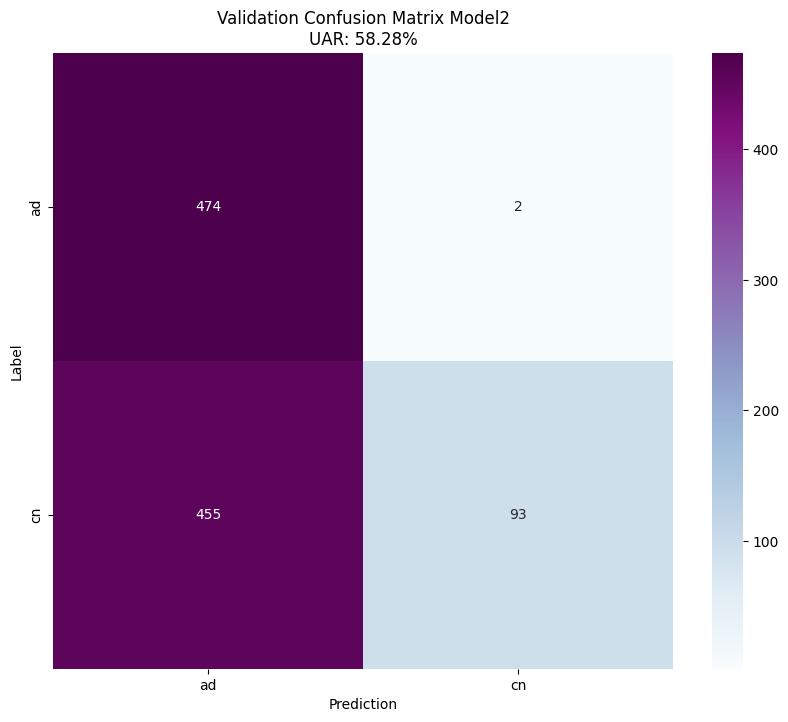

In [ ]:
x_valid = None
y_valid = None

for x, y in iter(valid_ds):
    if x_valid is None:
        x_valid = x.numpy()
        y_valid = y.numpy()
    else:
        x_valid = np.concatenate((x_valid, x.numpy()), axis=0)
        y_valid = np.concatenate((y_valid, y.numpy()), axis=0)

# Generate predictions
y_pred = model2.predict(x_valid)

# Calculate confusion matrix
confusion_mtx = tf.math.confusion_matrix(
    np.argmax(y_valid, axis=1), np.argmax(y_pred, axis=1)
)

# Calculate recall for each class
recall_per_class = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)

# Calculate Unweighted Average Recall (UAR)
uar = np.mean(recall_per_class) * 100

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_mtx, xticklabels=class_names, yticklabels=class_names, annot=True, fmt="g", cmap="BuPu"
)
plt.xlabel("Prediction")
plt.ylabel("Label")
plt.title(f"Validation Confusion Matrix Model2\nUAR: {uar:.2f}%")
plt.show()


32/32 [==============================] - 0s 2ms/step


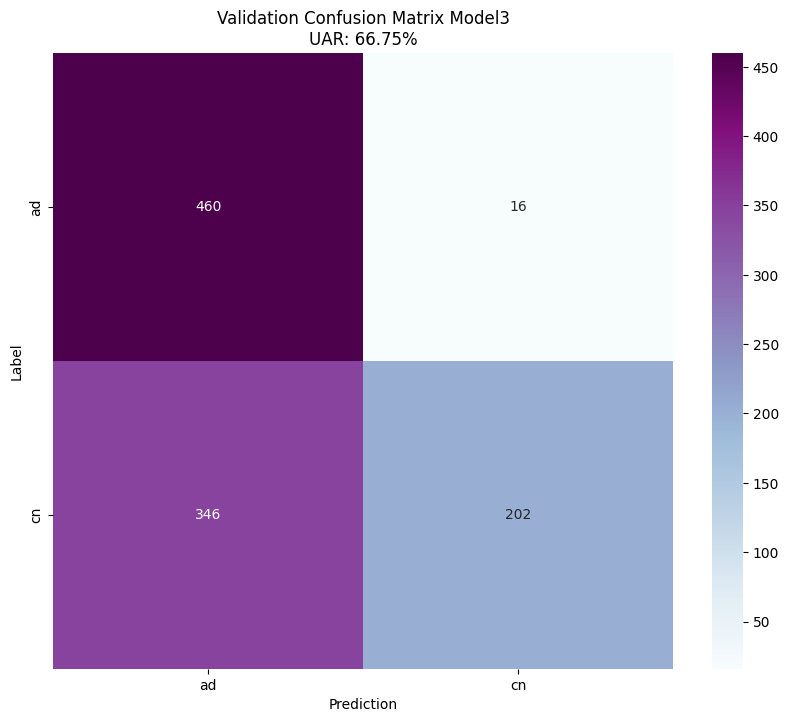

In [ ]:
x_valid = None
y_valid = None

for x, y in iter(valid_ds):
    if x_valid is None:
        x_valid = x.numpy()
        y_valid = y.numpy()
    else:
        x_valid = np.concatenate((x_valid, x.numpy()), axis=0)
        y_valid = np.concatenate((y_valid, y.numpy()), axis=0)

# Generate predictions
y_pred = model3.predict(x_valid)

# Calculate confusion matrix
confusion_mtx = tf.math.confusion_matrix(
    np.argmax(y_valid, axis=1), np.argmax(y_pred, axis=1)
)

# Calculate recall for each class
recall_per_class = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)

# Calculate Unweighted Average Recall (UAR)
uar = np.mean(recall_per_class) * 100

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_mtx, xticklabels=class_names, yticklabels=class_names, annot=True, fmt="g", cmap="BuPu"
)
plt.xlabel("Prediction")
plt.ylabel("Label")
plt.title(f"Validation Confusion Matrix Model3\nUAR: {uar:.2f}%")
plt.show()


32/32 [==============================] - 0s 2ms/step


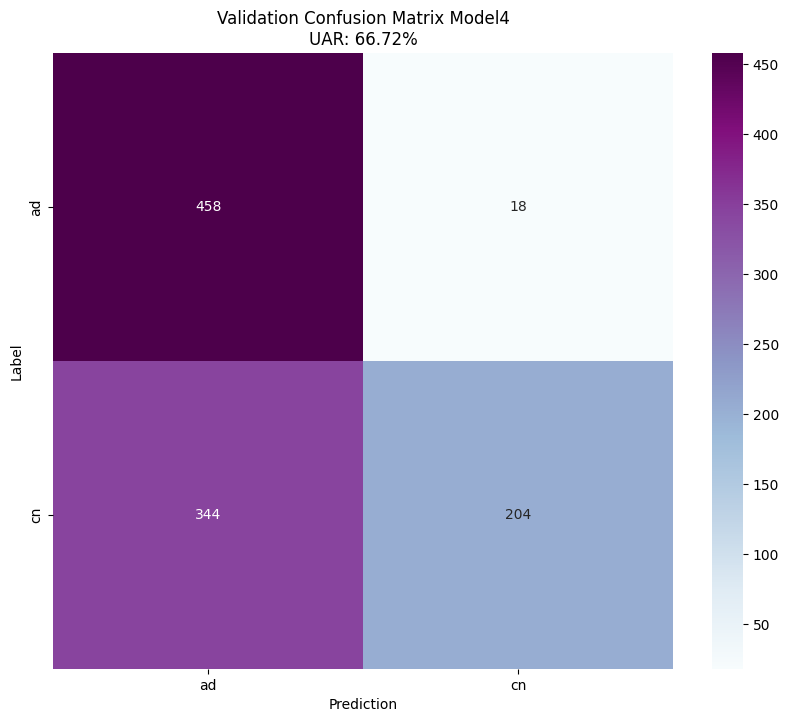

In [ ]:
x_valid = None
y_valid = None

for x, y in iter(valid_ds):
    if x_valid is None:
        x_valid = x.numpy()
        y_valid = y.numpy()
    else:
        x_valid = np.concatenate((x_valid, x.numpy()), axis=0)
        y_valid = np.concatenate((y_valid, y.numpy()), axis=0)

# Generate predictions
y_pred = model4.predict(x_valid)

# Calculate confusion matrix
confusion_mtx = tf.math.confusion_matrix(
    np.argmax(y_valid, axis=1), np.argmax(y_pred, axis=1)
)

# Calculate recall for each class
recall_per_class = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)

# Calculate Unweighted Average Recall (UAR)
uar = np.mean(recall_per_class) * 100

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_mtx, xticklabels=class_names, yticklabels=class_names, annot=True, fmt="g", cmap="BuPu"
)
plt.xlabel("Prediction")
plt.ylabel("Label")
plt.title(f"Validation Confusion Matrix Model4\nUAR: {uar:.2f}%")
plt.show()


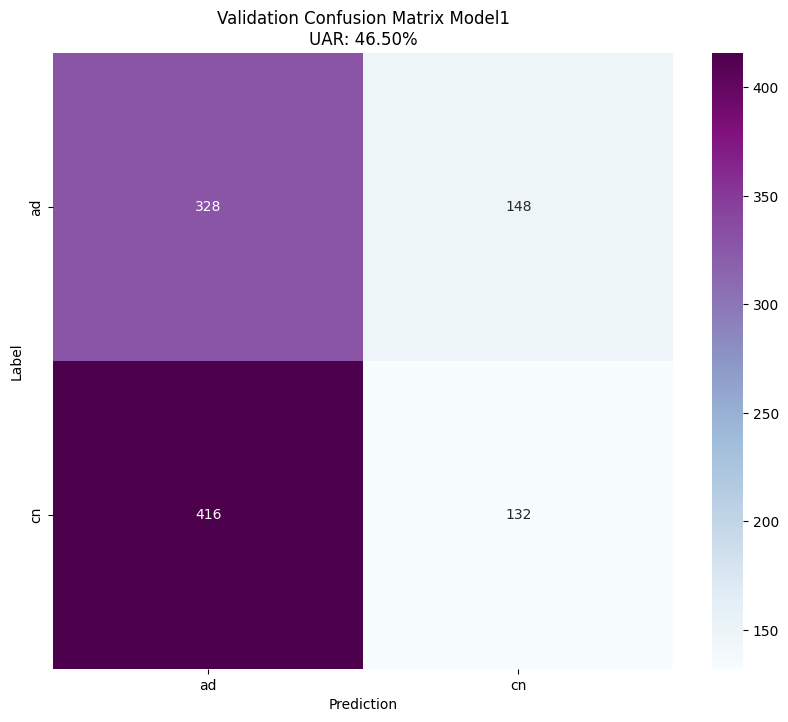

In [ ]:
# Calculate recall for each class
recall_per_class = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)

# Calculate Unweighted Average Recall (UAR)
uar = np.mean(recall_per_class) * 100

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_mtx, xticklabels=class_names, yticklabels=class_names, annot=True, fmt="g", cmap="BuPu"
)
plt.xlabel("Prediction")
plt.ylabel("Label")
plt.title(f"Validation Confusion Matrix Model4\nUAR: {uar:.2f}%")
plt.show()


In [ ]:
x_valid = None
y_valid = None

for x, y in iter(valid_ds):
    if x_valid is None:
        x_valid = x.numpy()
        y_valid = y.numpy()
    else:
        x_valid = np.concatenate((x_valid, x.numpy()), axis=0)
        y_valid = np.concatenate((y_valid, y.numpy()), axis=0)

# Generate predictions
y_pred = model.predict(x_valid)

# Calculate confusion matrix
confusion_mtx = tf.math.confusion_matrix(
    np.argmax(y_valid, axis=1), np.argmax(y_pred, axis=1)
)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    confusion_mtx, xticklabels=class_names, yticklabels=class_names, annot=True, fmt="g", cmap="BuPu"
)
plt.xlabel("Prediction")
plt.ylabel("Label")
plt.title("Validation Confusion Matrix Model1")
plt.show()

In [ ]:
from sklearn.metrics import f1_score

# Calculate precision, recall, and F1 score
precision = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=0)
recall = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)
f1 = 2 * (precision * recall) / (precision + recall)

# Average F1 score across all classes
average_f1 = np.mean(f1)

print("F1 scores for each class:", f1)
print("Average F1 score:", average_f1)

F1 scores for each class: [0.84912281 0.89186924]
Average F1 score: 0.8704960221173219


In [ ]:
dropout_1 = keras.Model(inputs=model.input,
                                 outputs=model.get_layer("dropout_1").output)
dropout_1=dropout_1.predict(all_ds)

156/156 [==============================] - 2s 10ms/step


In [ ]:
dropout_1.shape

(9984, 1024)

In [ ]:
# all_ds = all data
attention = keras.Model(inputs=model.input,
                                 outputs=model.get_layer("attention").output)
attention=attention.predict(all_ds)

embedding = keras.Model(inputs=model.input,
                                 outputs=model.get_layer("embedding").output)
embedding=embedding.predict(all_ds)

156/156 [==============================] - 0s 1ms/step


In [ ]:
import numpy as np # concat 64 row for 1 audio file
frames_per_file = 64
i = 0

# Calculate the start and end indices of attention weights for the ith audio file
start_index = i * frames_per_file
end_index = (i + 1) * frames_per_file

# Extract attention weights for the ith audio file
attention_weights_for_file_i = attention[start_index:end_index]
embedding_file_i = embedding[start_index:end_index]

In [ ]:
# for 1 file
# attention 1 frame : 64 features
# ebd 1 frame : 1024 features
# 16 ebd ~ 1 attention
attention_weights_for_file_i.shape, embedding_file_i.shape

((64, 64), (64, 1024))

##Ran sample

101
156/156 [==============================] - 1s 3ms/step
The dx is: cn 
The actual dx is: ad 
(64, 64) (64, 1024)


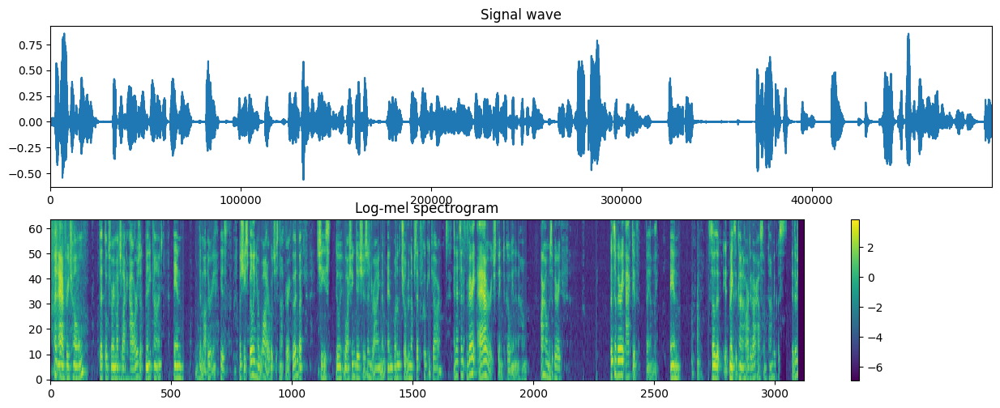

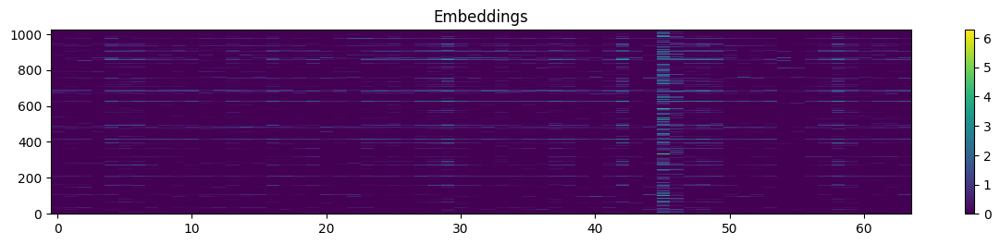

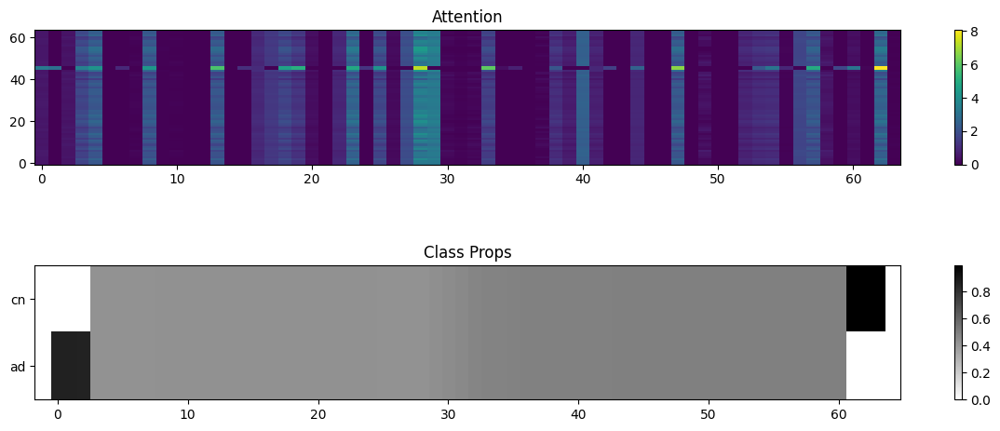

In [ ]:
import random
i = random.randint(0, 156)
print(i)
filename = metadata['filename'].iloc[i].split('/')[-1]
audio_wav, predictions, mel_spectrogram = filename_to_predictions(metadata['filename'].iloc[i])

infered_class = class_names[predictions.mean(axis=0).argmax()]

attention = keras.Model(inputs=model.input, outputs=model.get_layer("attention").output)
attention=attention.predict(all_ds)

embedding = keras.Model(inputs=model.input, outputs=model.get_layer("embedding").output)
embedding=embedding.predict(all_ds)

timeframes = map_timeframes(post_process(predictions),  mel_spectrogram.numpy().T)
attention, embedding = get_att_end(i, attention, embedding)
print(f"The dx is: {infered_class} ")
print(f"The actual dx is: {metadata['dx'].iloc[i]} ")
print(attention.shape,embedding.shape)
plot_all(audio_wav,mel_spectrogram,embedding,attention,predictions,class_names)

0
2/2 [==============================] - 0s 12ms/step
The dx is: ad 
The actual dx is: cn 


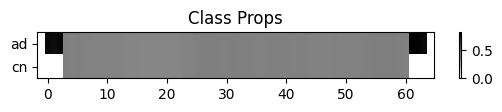

1
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


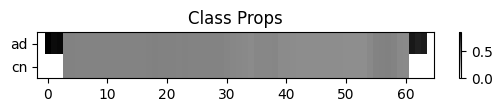

2
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


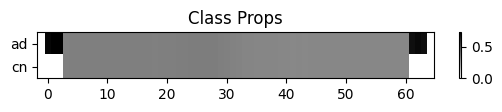

3
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


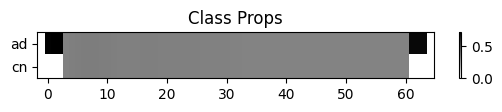

4
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


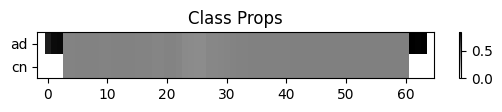

5
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


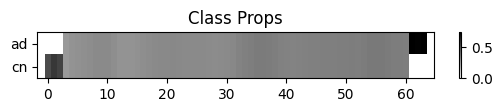

6
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


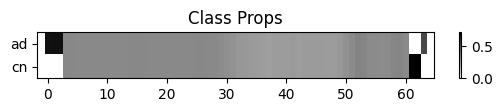

7
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


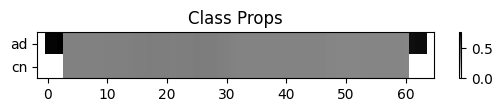

8
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


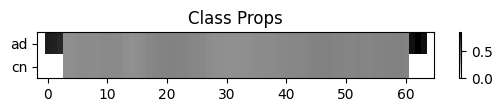

9
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


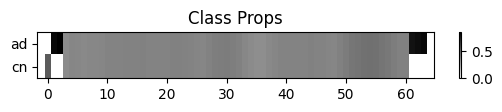

10
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: ad 


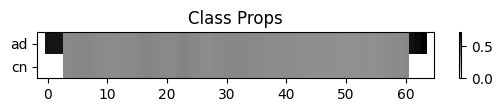

11
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


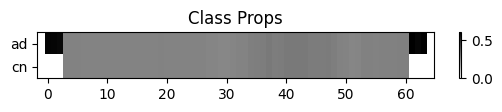

12
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


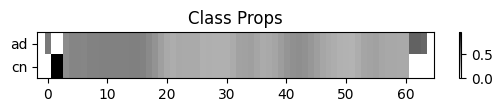

13
2/2 [==============================] - 0s 9ms/step
The dx is: cn 
The actual dx is: ad 


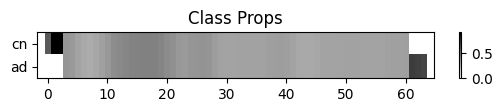

14
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: ad 


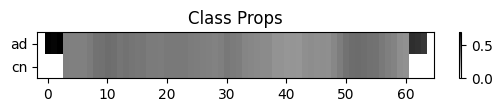

15
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


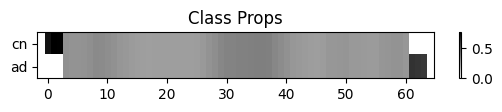

16
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


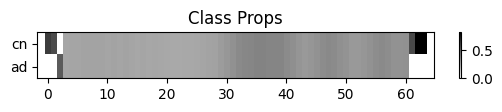

17
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: ad 


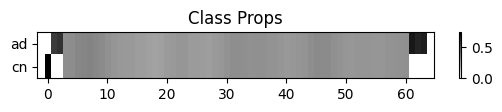

18
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


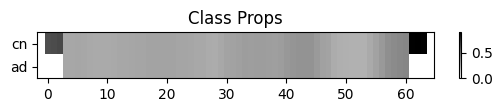

19
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


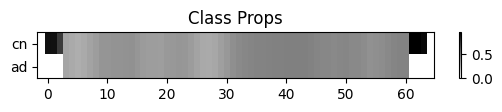

20
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


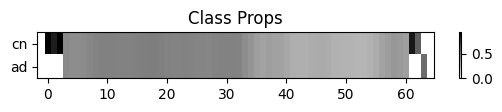

21
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


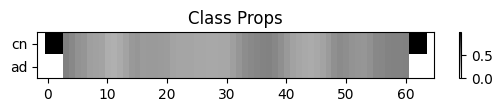

22
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


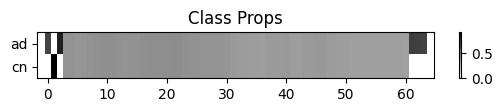

23
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: ad 


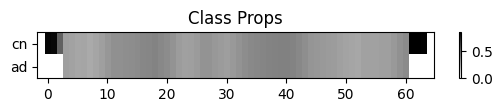

24
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


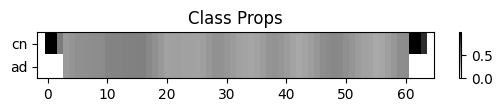

25
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


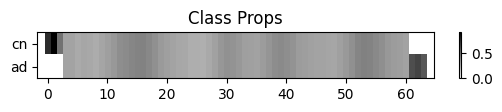

26
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: ad 


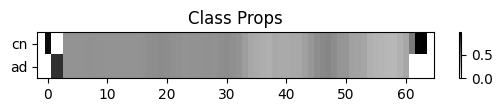

27
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


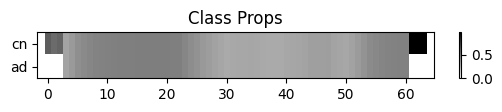

28
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


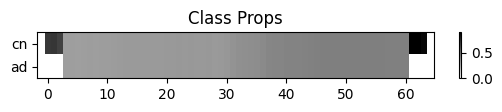

29
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


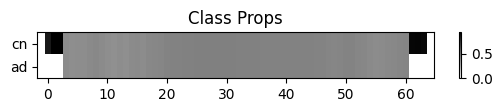

30
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: ad 


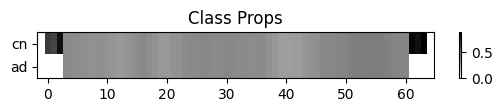

31
2/2 [==============================] - 0s 7ms/step
The dx is: cn 
The actual dx is: ad 


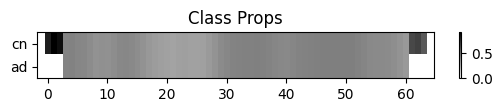

32
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: ad 


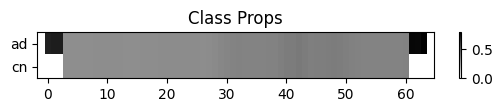

33
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


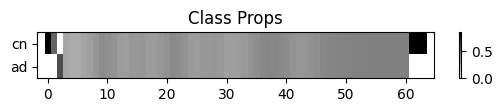

34
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: ad 


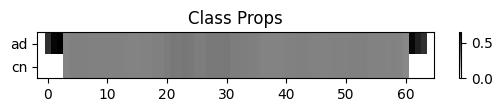

35
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


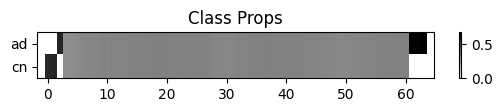

36
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


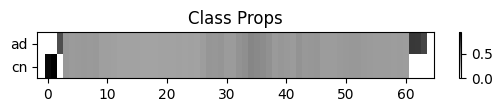

37
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


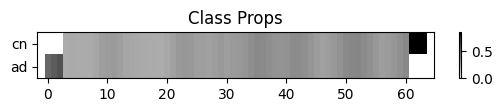

38
2/2 [==============================] - 0s 7ms/step
The dx is: cn 
The actual dx is: ad 


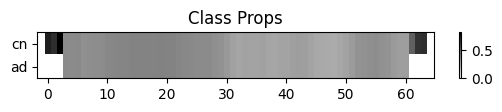

39
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


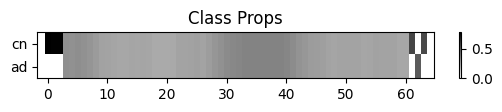

40
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


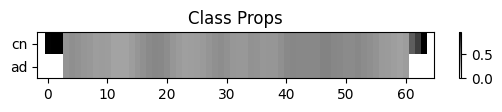

41
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: ad 


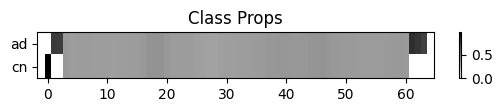

42
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


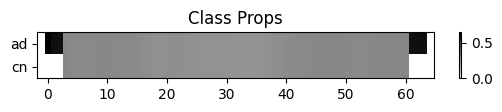

43
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: ad 


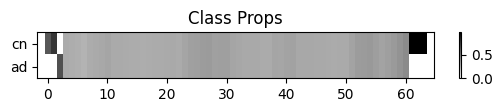

44
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


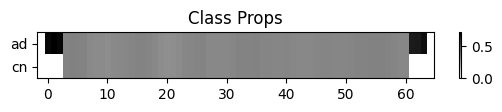

45
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


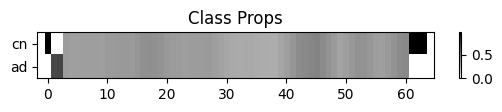

46
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: ad 


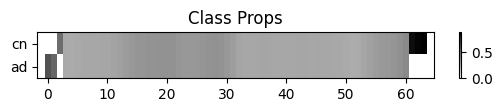

47
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


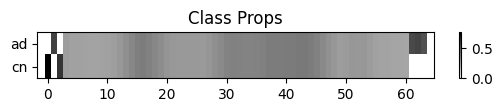

48
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


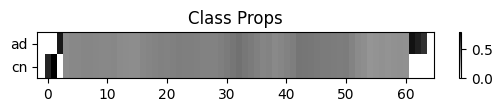

49
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


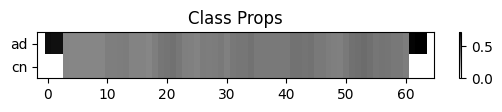

50
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


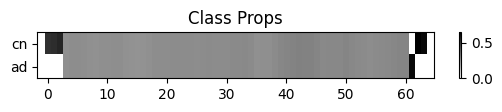

51
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


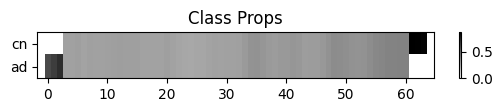

52
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


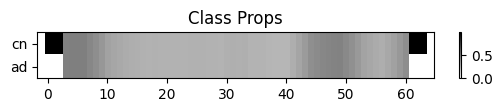

53
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


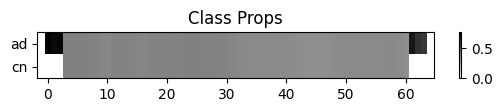

54
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


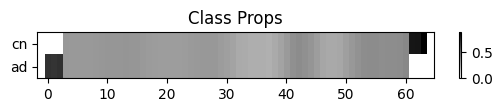

55
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


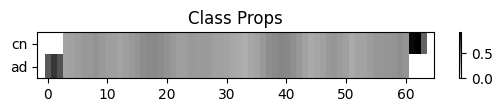

56
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


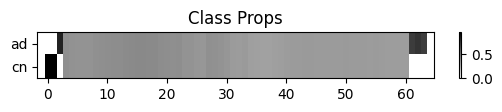

57
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: cn 


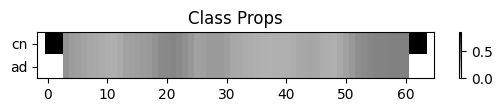

58
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


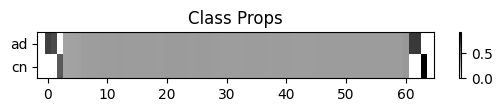

59
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: cn 


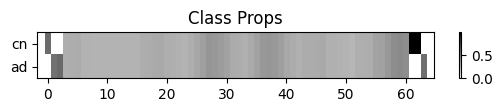

60
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: cn 


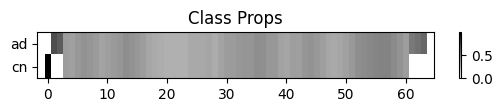

61
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: cn 


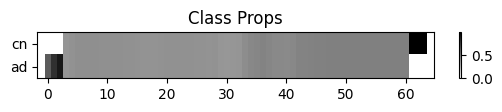

62
2/2 [==============================] - 0s 12ms/step
The dx is: ad 
The actual dx is: cn 


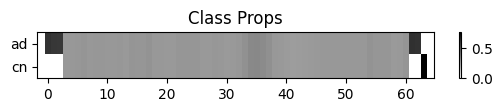

63
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


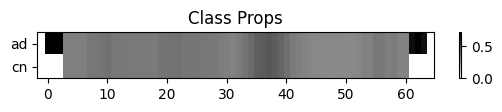

64
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


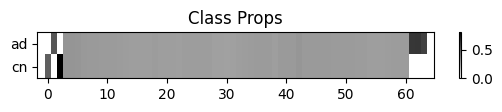

65
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: cn 


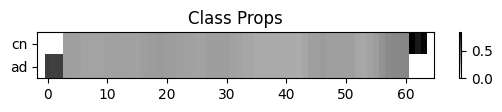

66
2/2 [==============================] - 0s 9ms/step
The dx is: cn 
The actual dx is: cn 


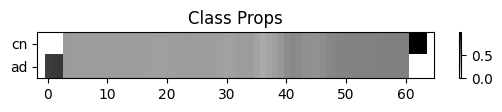

67
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: cn 


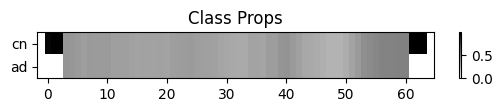

68
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


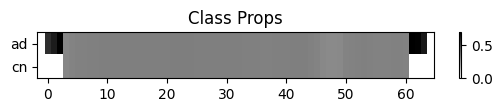

69
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


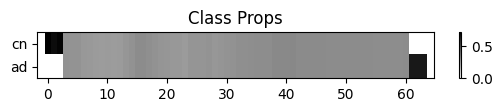

70
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


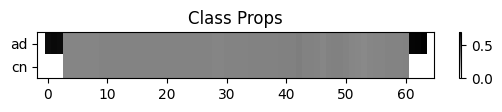

71
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: cn 


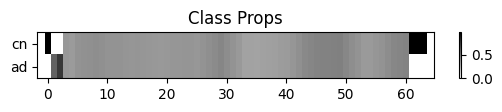

72
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


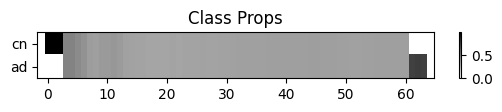

73
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


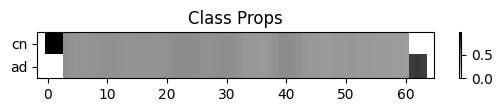

74
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


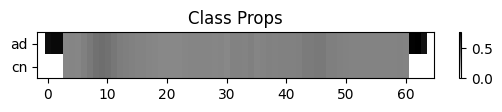

75
2/2 [==============================] - 0s 8ms/step
The dx is: ad 
The actual dx is: cn 


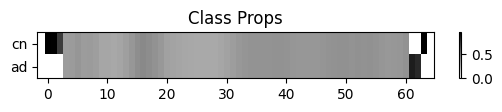

76
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


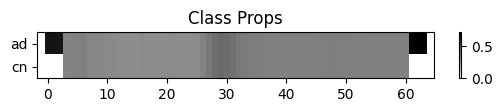

77
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


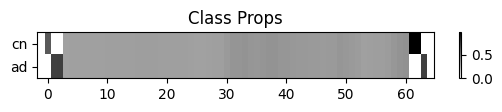

78
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


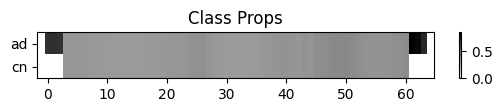

79
2/2 [==============================] - 0s 9ms/step
The dx is: ad 
The actual dx is: cn 


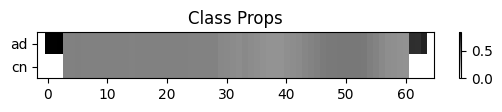

80
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: cn 


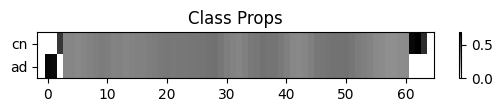

81
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


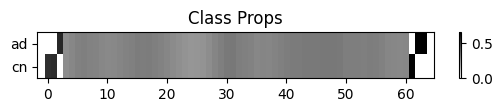

82
2/2 [==============================] - 0s 7ms/step
The dx is: cn 
The actual dx is: cn 


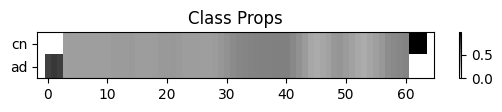

83
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


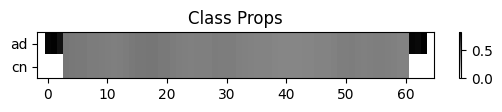

84
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


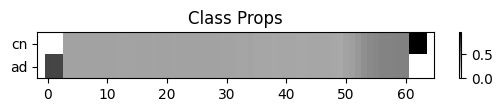

85
2/2 [==============================] - 0s 10ms/step
The dx is: ad 
The actual dx is: ad 


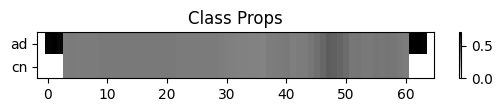

86
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


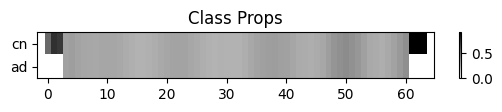

87
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


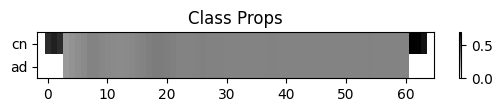

88
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


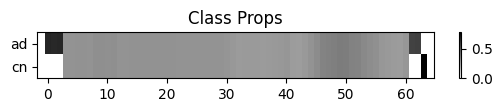

89
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


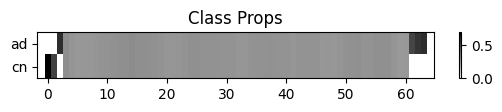

90
2/2 [==============================] - 0s 8ms/step
The dx is: ad 
The actual dx is: ad 


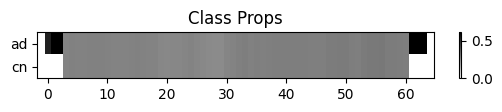

91
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


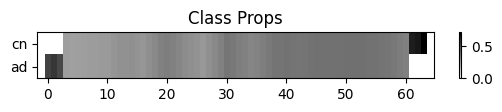

92
2/2 [==============================] - 0s 26ms/step
The dx is: cn 
The actual dx is: ad 


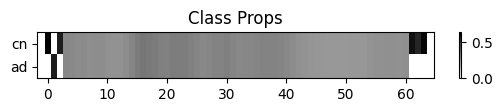

93
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


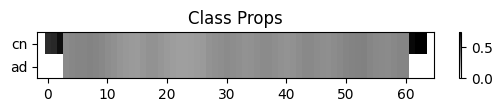

94
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


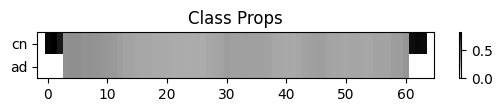

95
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: ad 


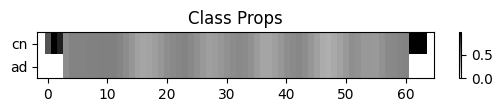

96
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


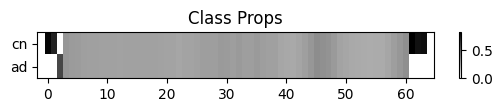

97
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


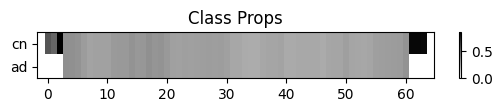

98
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


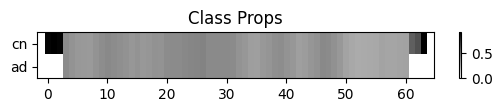

99
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: ad 


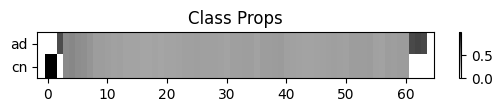

100
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


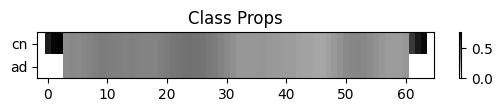

101
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: ad 


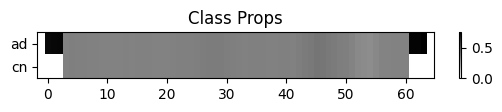

102
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


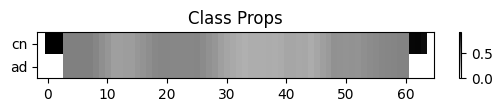

103
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


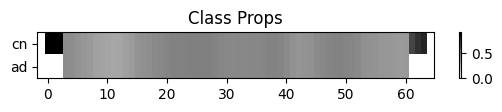

104
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


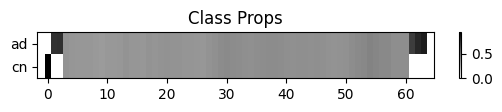

105
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


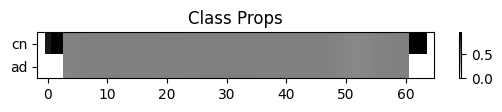

106
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


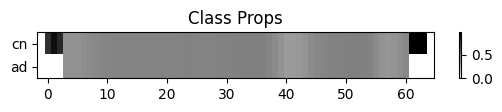

107
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: ad 


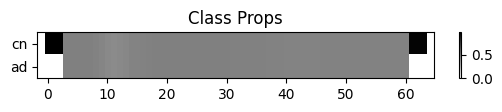

108
2/2 [==============================] - 0s 8ms/step
The dx is: cn 
The actual dx is: ad 


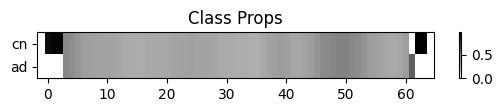

109
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: ad 


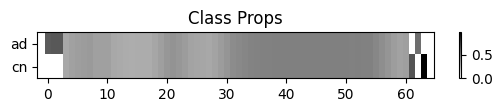

110
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


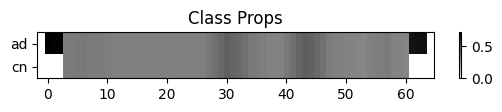

111
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


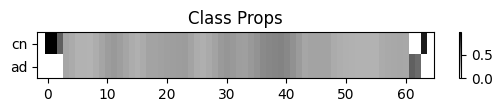

112
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


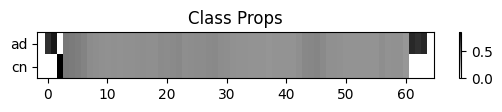

113
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: ad 


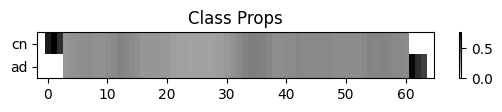

114
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: ad 


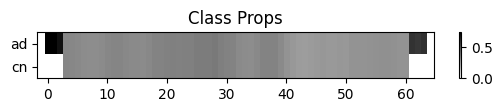

115
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


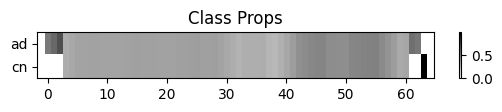

116
2/2 [==============================] - 0s 7ms/step
The dx is: cn 
The actual dx is: ad 


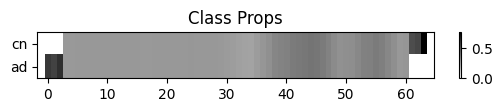

117
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: ad 


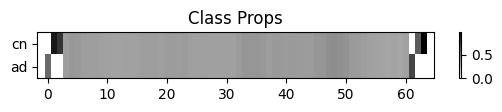

118
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


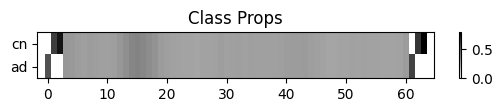

119
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: ad 


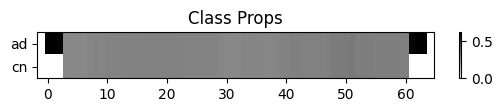

120
2/2 [==============================] - 0s 8ms/step
The dx is: ad 
The actual dx is: ad 


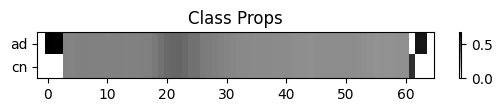

121
2/2 [==============================] - 0s 13ms/step
The dx is: ad 
The actual dx is: ad 


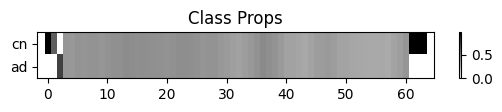

122
2/2 [==============================] - 0s 8ms/step
The dx is: cn 
The actual dx is: ad 


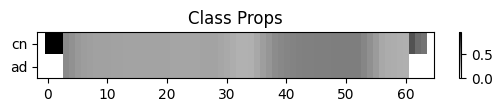

123
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: ad 


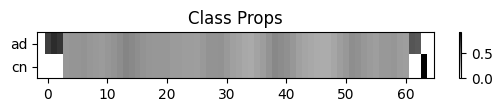

124
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


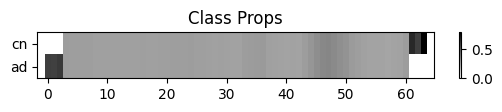

125
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


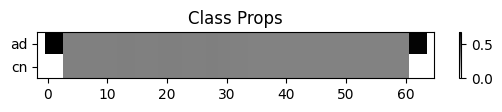

126
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


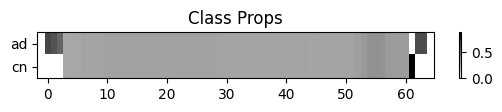

127
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


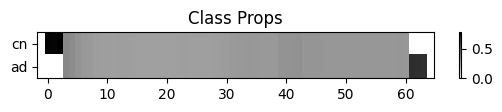

128
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


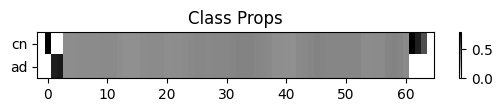

129
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


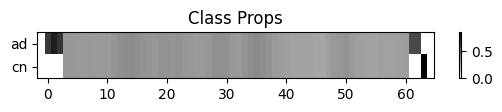

130
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: cn 


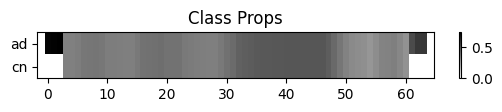

131
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


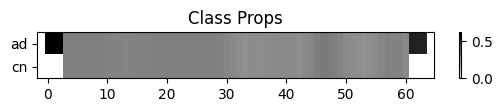

132
2/2 [==============================] - 0s 10ms/step
The dx is: ad 
The actual dx is: cn 


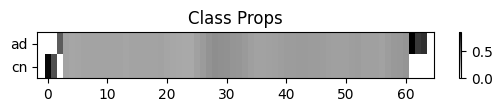

133
2/2 [==============================] - 0s 12ms/step
The dx is: ad 
The actual dx is: cn 


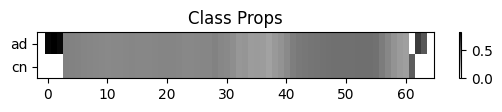

134
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


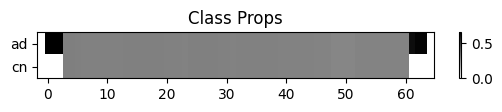

135
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


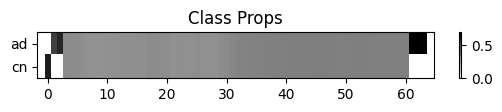

136
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


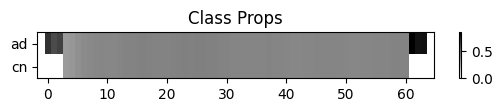

137
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


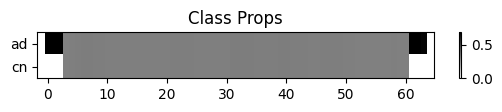

138
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


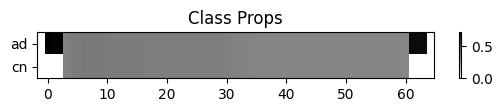

139
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


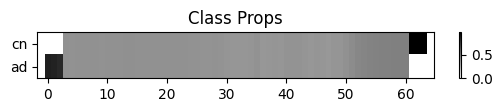

140
2/2 [==============================] - 0s 7ms/step
The dx is: cn 
The actual dx is: cn 


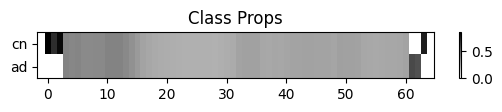

141
2/2 [==============================] - 0s 8ms/step
The dx is: ad 
The actual dx is: cn 


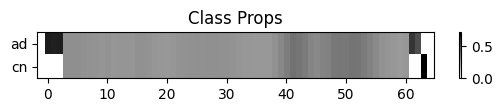

142
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


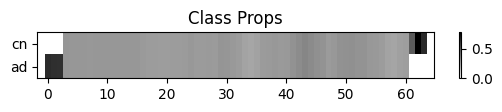

143
2/2 [==============================] - 0s 6ms/step
The dx is: ad 
The actual dx is: cn 


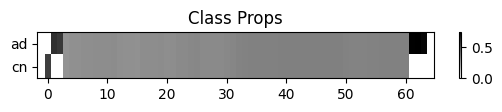

144
2/2 [==============================] - 0s 11ms/step
The dx is: cn 
The actual dx is: cn 


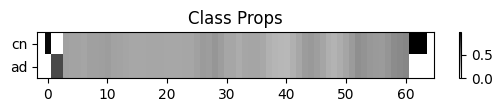

145
2/2 [==============================] - 0s 11ms/step
The dx is: cn 
The actual dx is: cn 


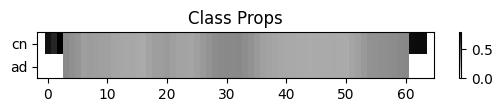

146
2/2 [==============================] - 0s 4ms/step
The dx is: cn 
The actual dx is: cn 


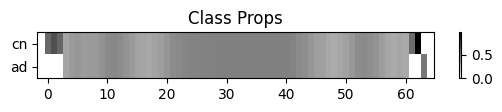

147
2/2 [==============================] - 0s 5ms/step
The dx is: cn 
The actual dx is: cn 


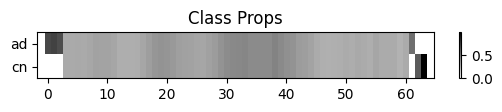

148
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


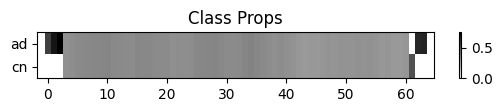

149
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


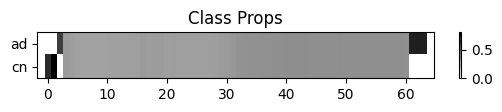

150
2/2 [==============================] - 0s 5ms/step
The dx is: ad 
The actual dx is: cn 


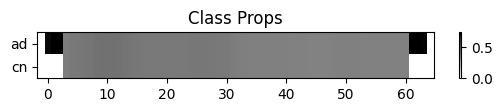

151
2/2 [==============================] - 0s 7ms/step
The dx is: ad 
The actual dx is: cn 


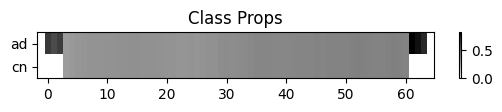

152
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


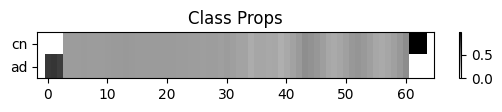

153
2/2 [==============================] - 0s 6ms/step
The dx is: cn 
The actual dx is: cn 


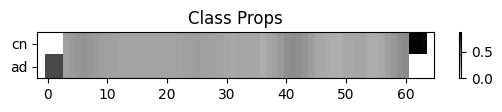

154
2/2 [==============================] - 0s 7ms/step
The dx is: cn 
The actual dx is: cn 


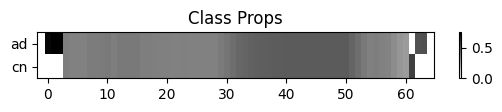

155
2/2 [==============================] - 0s 4ms/step
The dx is: ad 
The actual dx is: cn 


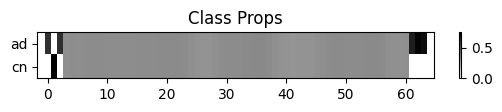

In [ ]:
for i in range(0,156):
  print(i)
  filename = metadata['filename'].iloc[i].split('/')[-1]
  audio_wav, predictions, mel_spectrogram = filename_to_predictions(metadata['filename'].iloc[i])

  infered_class = class_names[predictions.mean(axis=0).argmax()]

  timeframes = map_timeframes(post_process(predictions),  mel_spectrogram.numpy().T)
  print(f"The dx is: {infered_class} ")
  print(f"The actual dx is: {metadata['dx'].iloc[i]} ")


    # Plot and label the model output scores for the top-scoring classes.
  mean_predictions = np.mean(predictions, axis=0)
  top_class_indices = np.argsort(mean_predictions)[::-1]
  plt.subplot(5, 1, 5)
  plt.title('Class Props')
  plt.imshow(
    predictions[:, top_class_indices].T,
    aspect="auto",
    interpolation="nearest",
    cmap="gray_r",
  )
  patch_padding = (0.025 / 2) / 0.01
  plt.xlim([-patch_padding - 0.5, predictions.shape[0] + patch_padding - 0.5])
  # Label the top_N classes.
  yticks = range(0, len(class_names), 1)
  plt.yticks(yticks, [class_names[top_class_indices[x]] for x in yticks])
  _ = plt.ylim(-0.5 + np.array([len(class_names), 0]))
  plt.colorbar()
  plt.subplots_adjust(hspace=0.75)
  plt.savefig('/content/drive/MyDrive/A_senior_project/Prediction/'+'Class Props '+str(n)+' '+filename+'.png')
  plt.show()

0
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


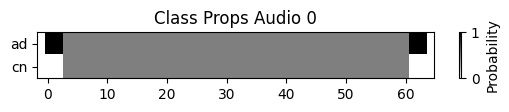

1
2/2 [==============================] - 0s 30ms/step
The dx is: ad 
The actual dx is: cn 


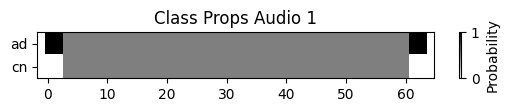

2
2/2 [==============================] - 0s 13ms/step
The dx is: ad 
The actual dx is: cn 


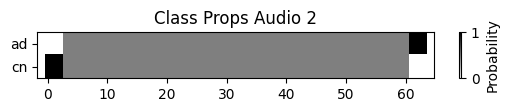

3
2/2 [==============================] - 0s 27ms/step
The dx is: ad 
The actual dx is: cn 


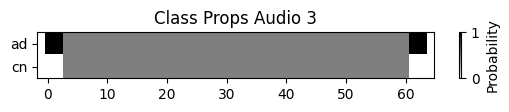

4
2/2 [==============================] - 0s 32ms/step
The dx is: ad 
The actual dx is: cn 


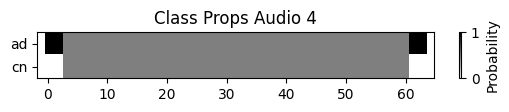

5
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


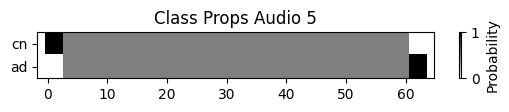

6
2/2 [==============================] - 0s 21ms/step
The dx is: ad 
The actual dx is: cn 


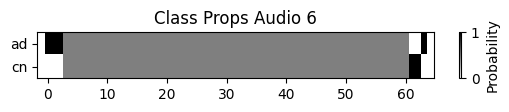

7
2/2 [==============================] - 0s 15ms/step
The dx is: ad 
The actual dx is: cn 


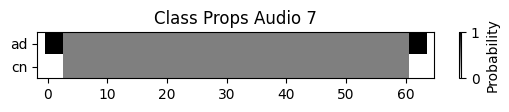

8
2/2 [==============================] - 0s 29ms/step
The dx is: ad 
The actual dx is: cn 


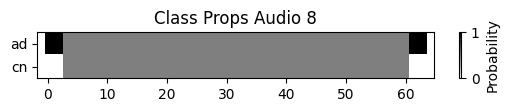

9
2/2 [==============================] - 0s 22ms/step
The dx is: ad 
The actual dx is: cn 


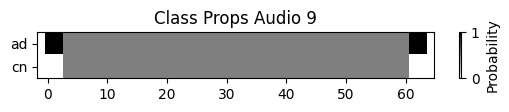

10
2/2 [==============================] - 0s 24ms/step
The dx is: ad 
The actual dx is: ad 


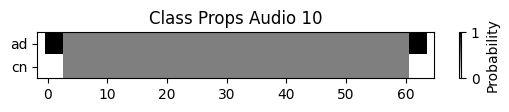

11
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: ad 


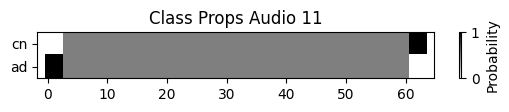

12
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


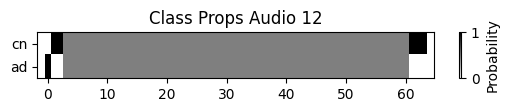

13
2/2 [==============================] - 0s 13ms/step
The dx is: cn 
The actual dx is: ad 


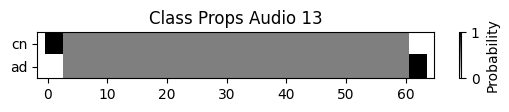

14
2/2 [==============================] - 0s 14ms/step
The dx is: ad 
The actual dx is: ad 


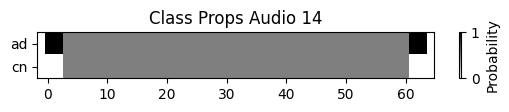

15
2/2 [==============================] - 0s 13ms/step
The dx is: cn 
The actual dx is: ad 


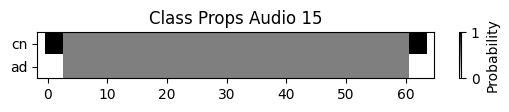

16
2/2 [==============================] - 0s 13ms/step
The dx is: cn 
The actual dx is: ad 


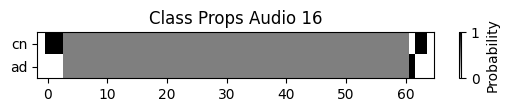

17
2/2 [==============================] - 0s 13ms/step
The dx is: ad 
The actual dx is: ad 


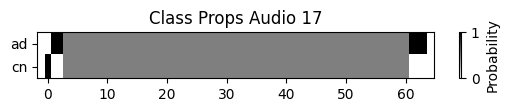

18
2/2 [==============================] - 0s 25ms/step
The dx is: cn 
The actual dx is: ad 


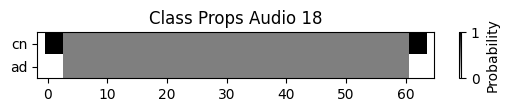

19
2/2 [==============================] - 0s 24ms/step
The dx is: cn 
The actual dx is: ad 


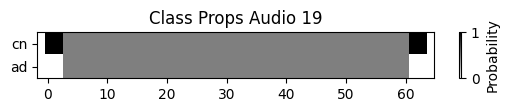

20
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


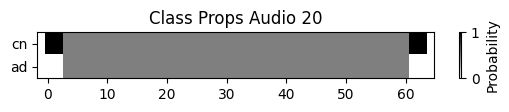

21
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


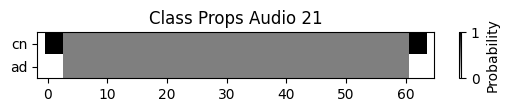

22
2/2 [==============================] - 0s 14ms/step
The dx is: ad 
The actual dx is: ad 


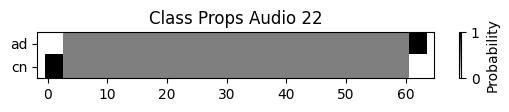

23
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


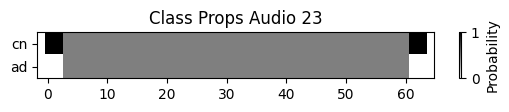

24
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


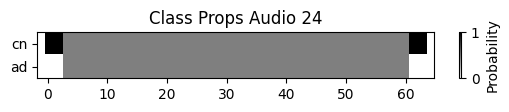

25
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


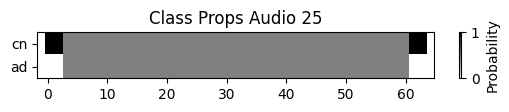

26
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


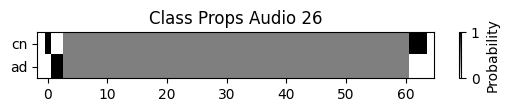

27
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


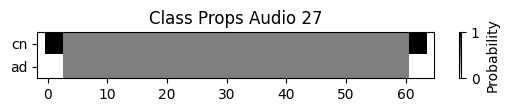

28
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


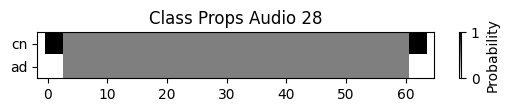

29
2/2 [==============================] - 0s 28ms/step
The dx is: cn 
The actual dx is: ad 


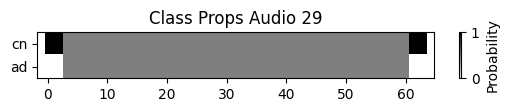

30
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


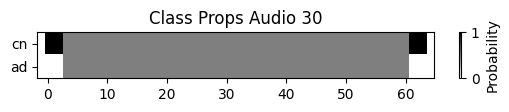

31
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


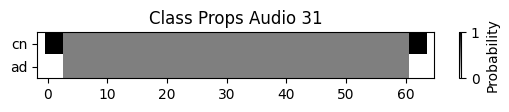

32
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


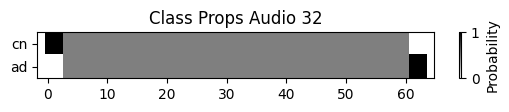

33
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


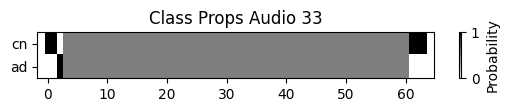

34
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


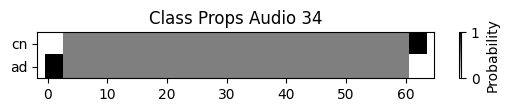

35
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


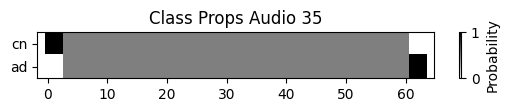

36
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


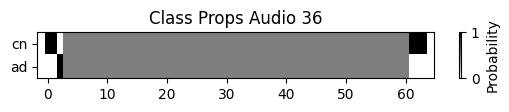

37
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


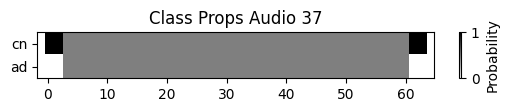

38
2/2 [==============================] - 0s 25ms/step
The dx is: cn 
The actual dx is: ad 


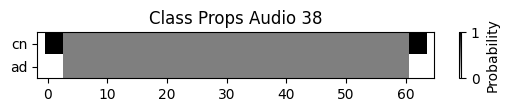

39
2/2 [==============================] - 0s 21ms/step
The dx is: cn 
The actual dx is: ad 


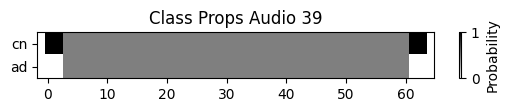

40
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


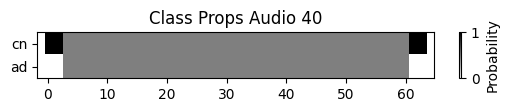

41
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


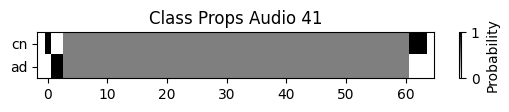

42
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


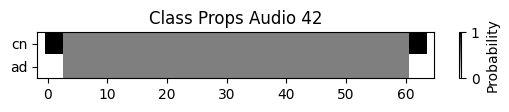

43
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


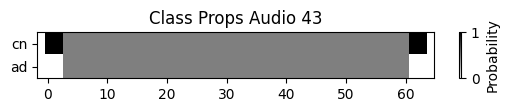

44
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


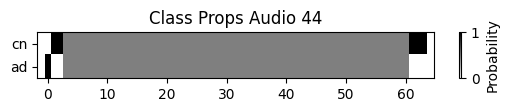

45
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


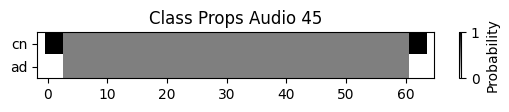

46
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


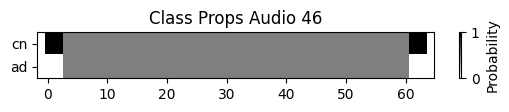

47
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


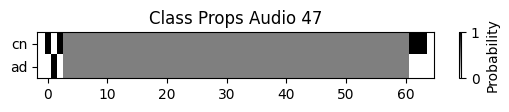

48
2/2 [==============================] - 0s 31ms/step
The dx is: cn 
The actual dx is: ad 


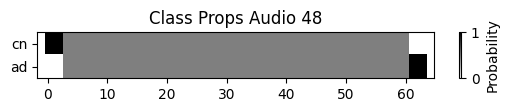

49
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


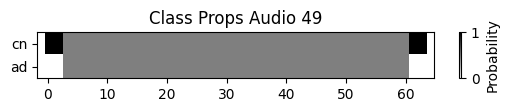

50
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


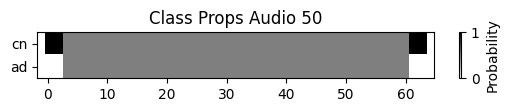

51
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


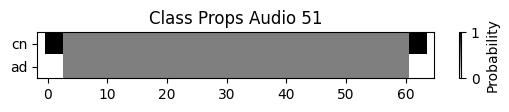

52
2/2 [==============================] - 0s 13ms/step
The dx is: cn 
The actual dx is: ad 


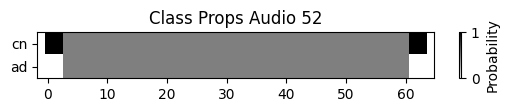

53
2/2 [==============================] - 0s 22ms/step
The dx is: cn 
The actual dx is: ad 


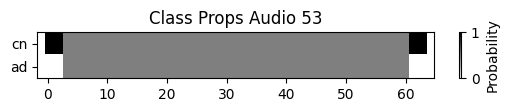

54
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: ad 


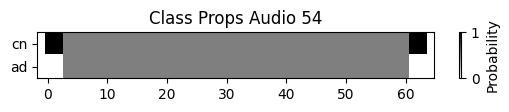

55
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


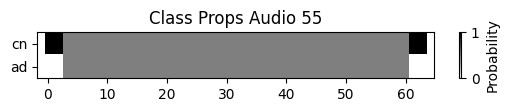

56
2/2 [==============================] - 0s 32ms/step
The dx is: ad 
The actual dx is: cn 


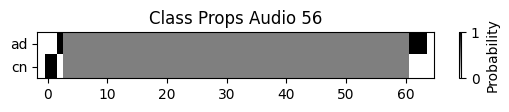

57
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


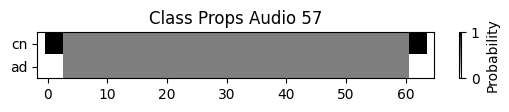

58
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


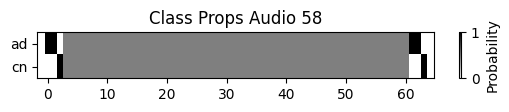

59
2/2 [==============================] - 0s 23ms/step
The dx is: ad 
The actual dx is: cn 


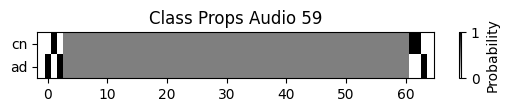

60
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


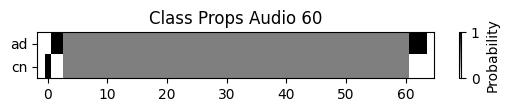

61
2/2 [==============================] - 0s 20ms/step
The dx is: cn 
The actual dx is: cn 


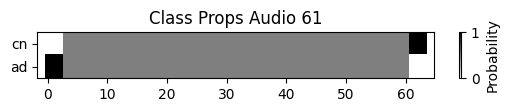

62
2/2 [==============================] - 0s 15ms/step
The dx is: ad 
The actual dx is: cn 


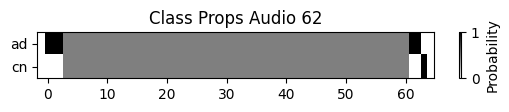

63
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


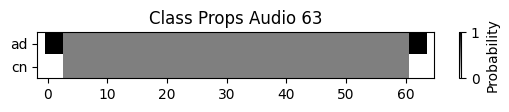

64
2/2 [==============================] - 0s 33ms/step
The dx is: ad 
The actual dx is: cn 


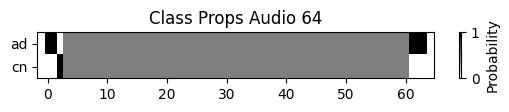

65
2/2 [==============================] - 0s 21ms/step
The dx is: ad 
The actual dx is: cn 


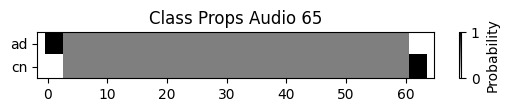

66
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: cn 


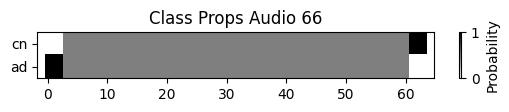

67
2/2 [==============================] - 0s 20ms/step
The dx is: ad 
The actual dx is: cn 


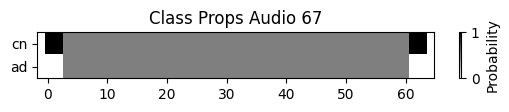

68
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


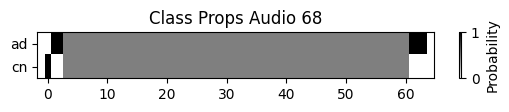

69
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


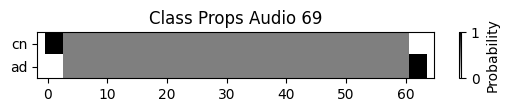

70
2/2 [==============================] - 0s 19ms/step
The dx is: ad 
The actual dx is: cn 


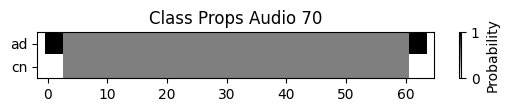

71
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


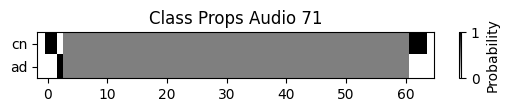

72
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


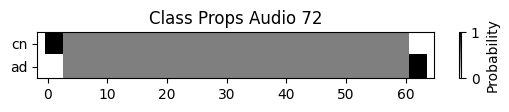

73
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


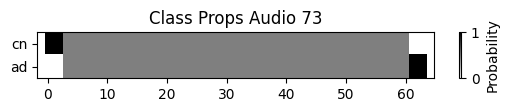

74
2/2 [==============================] - 0s 26ms/step
The dx is: ad 
The actual dx is: cn 


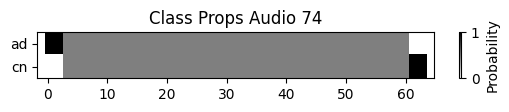

75
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: cn 


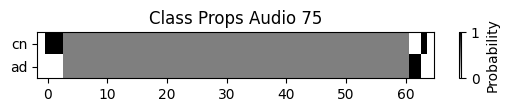

76
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


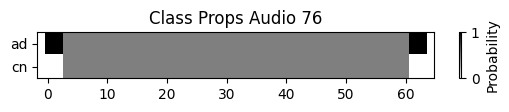

77
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


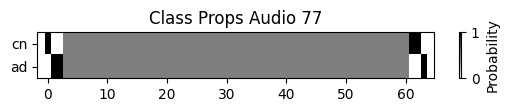

78
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


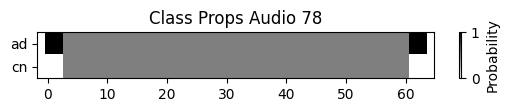

79
2/2 [==============================] - 0s 15ms/step
The dx is: ad 
The actual dx is: cn 


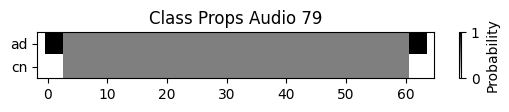

80
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


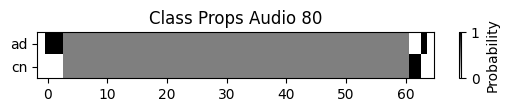

81
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


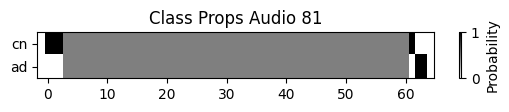

82
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


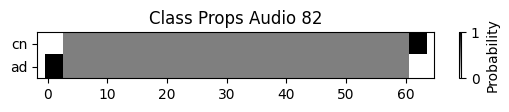

83
2/2 [==============================] - 0s 33ms/step
The dx is: ad 
The actual dx is: cn 


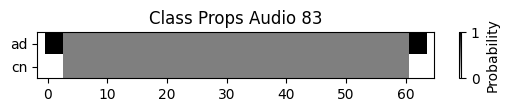

84
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


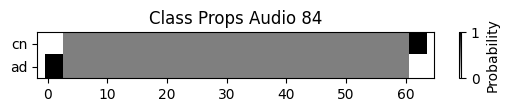

85
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


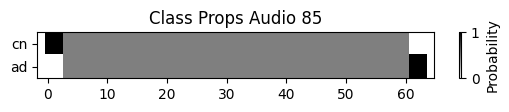

86
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


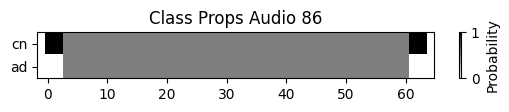

87
2/2 [==============================] - 0s 33ms/step
The dx is: cn 
The actual dx is: ad 


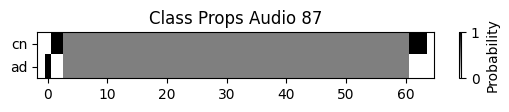

88
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: ad 


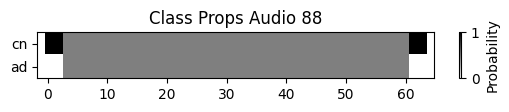

89
2/2 [==============================] - 0s 23ms/step
The dx is: cn 
The actual dx is: ad 


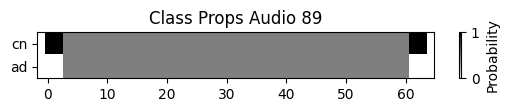

90
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


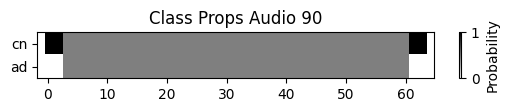

91
2/2 [==============================] - 0s 14ms/step
The dx is: cn 
The actual dx is: ad 


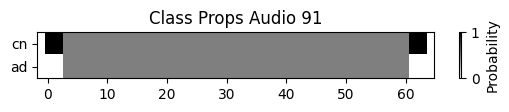

92
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


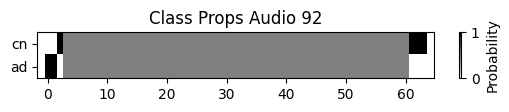

93
2/2 [==============================] - 0s 30ms/step
The dx is: cn 
The actual dx is: ad 


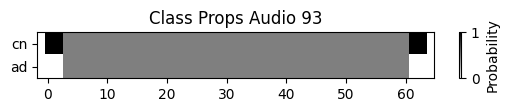

94
2/2 [==============================] - 0s 29ms/step
The dx is: cn 
The actual dx is: ad 


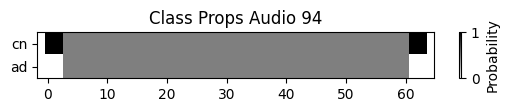

95
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: ad 


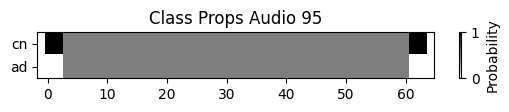

96
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


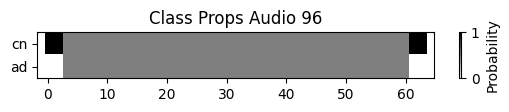

97
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


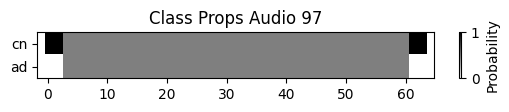

98
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


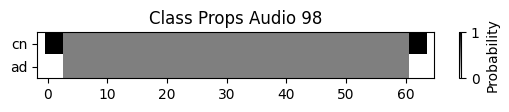

99
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


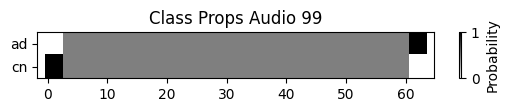

100
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


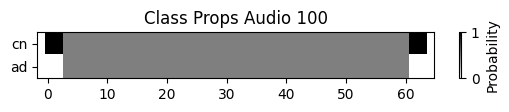

101
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: ad 


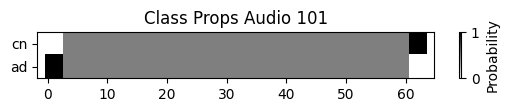

102
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


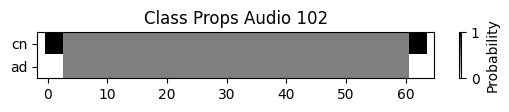

103
2/2 [==============================] - 0s 37ms/step
The dx is: cn 
The actual dx is: ad 


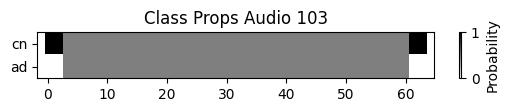

104
2/2 [==============================] - 0s 22ms/step
The dx is: cn 
The actual dx is: ad 


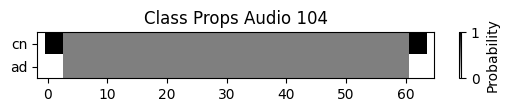

105
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: ad 


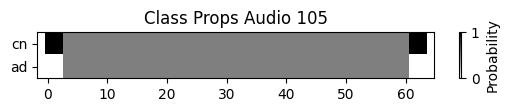

106
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


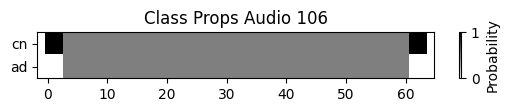

107
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: ad 


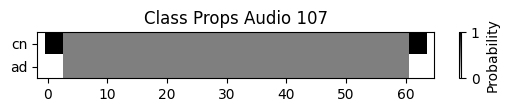

108
2/2 [==============================] - 0s 14ms/step
The dx is: cn 
The actual dx is: ad 


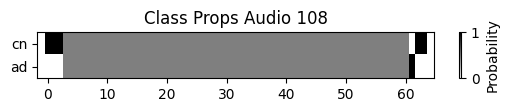

109
2/2 [==============================] - 0s 20ms/step
The dx is: cn 
The actual dx is: ad 


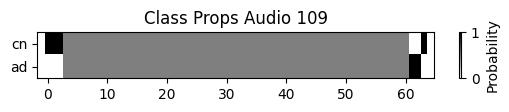

110
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


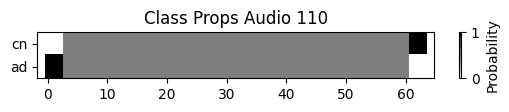

111
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


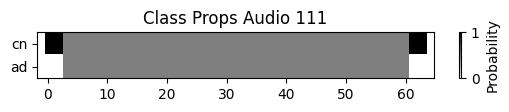

112
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


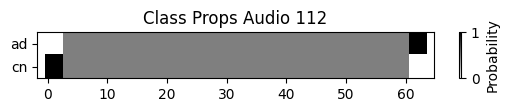

113
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


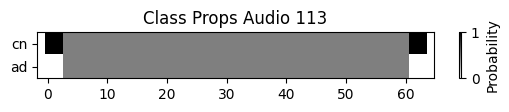

114
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


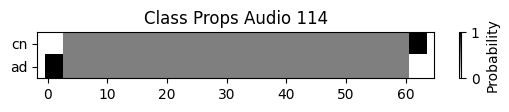

115
2/2 [==============================] - 0s 20ms/step
The dx is: cn 
The actual dx is: ad 


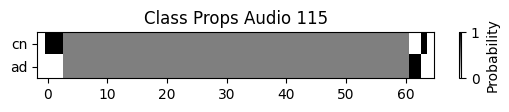

116
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


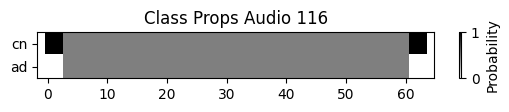

117
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


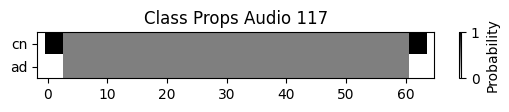

118
2/2 [==============================] - 0s 17ms/step
The dx is: cn 
The actual dx is: ad 


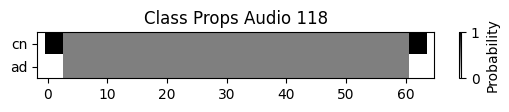

119
2/2 [==============================] - 0s 19ms/step
The dx is: cn 
The actual dx is: ad 


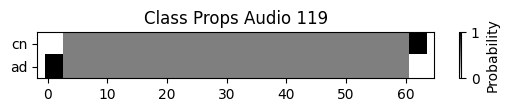

120
2/2 [==============================] - 0s 16ms/step
The dx is: cn 
The actual dx is: ad 


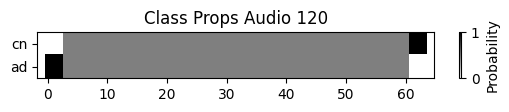

121
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: ad 


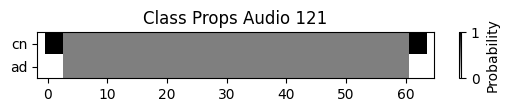

122
2/2 [==============================] - 0s 22ms/step
The dx is: cn 
The actual dx is: ad 


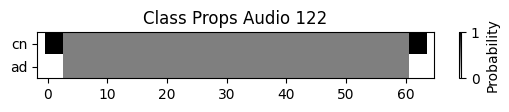

123
2/2 [==============================] - 0s 31ms/step
The dx is: cn 
The actual dx is: ad 


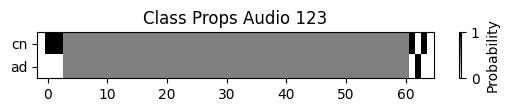

124
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


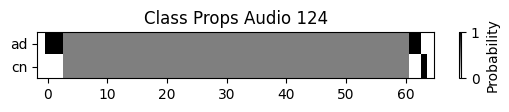

125
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


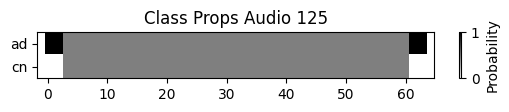

126
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


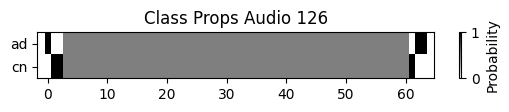

127
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


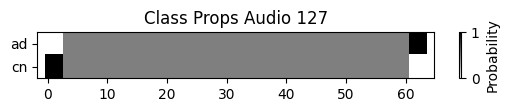

128
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


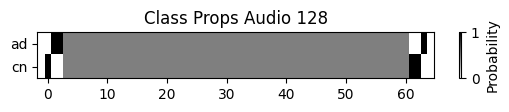

129
2/2 [==============================] - 0s 19ms/step
The dx is: ad 
The actual dx is: cn 


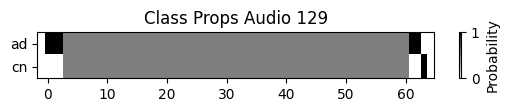

130
2/2 [==============================] - 0s 35ms/step
The dx is: ad 
The actual dx is: cn 


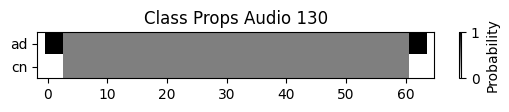

131
2/2 [==============================] - 0s 25ms/step
The dx is: ad 
The actual dx is: cn 


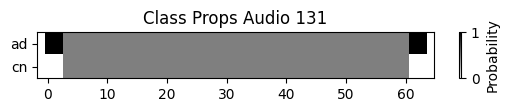

132
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


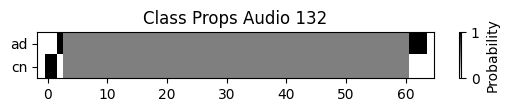

133
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


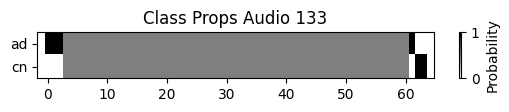

134
2/2 [==============================] - 0s 15ms/step
The dx is: ad 
The actual dx is: cn 


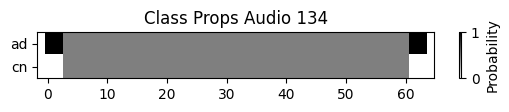

135
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


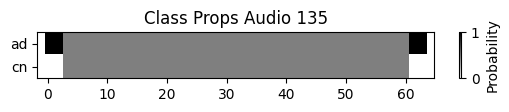

136
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


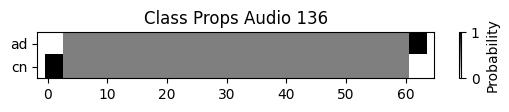

137
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


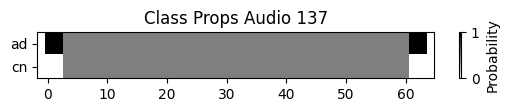

138
2/2 [==============================] - 0s 19ms/step
The dx is: ad 
The actual dx is: cn 


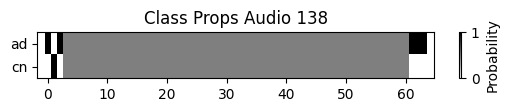

139
2/2 [==============================] - 0s 19ms/step
The dx is: ad 
The actual dx is: cn 


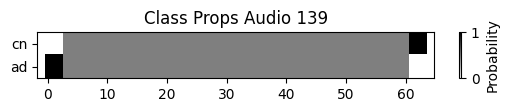

140
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


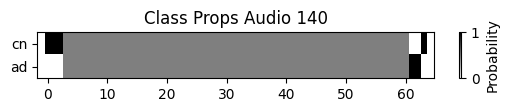

141
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


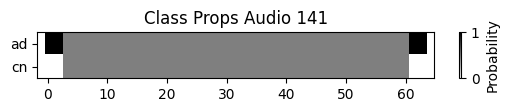

142
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


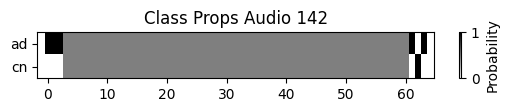

143
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


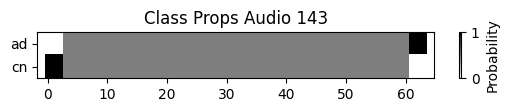

144
2/2 [==============================] - 0s 15ms/step
The dx is: cn 
The actual dx is: cn 


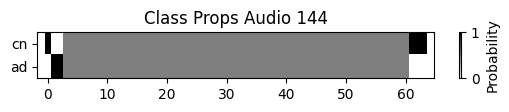

145
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


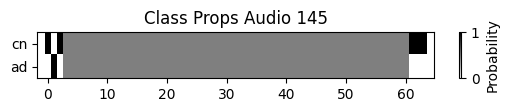

146
2/2 [==============================] - 0s 18ms/step
The dx is: cn 
The actual dx is: cn 


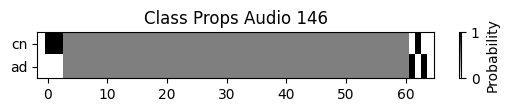

147
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


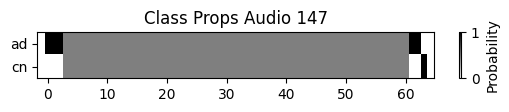

148
2/2 [==============================] - 0s 22ms/step
The dx is: ad 
The actual dx is: cn 


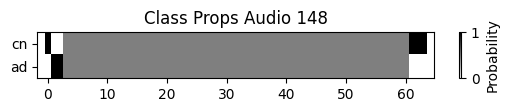

149
2/2 [==============================] - 0s 20ms/step
The dx is: ad 
The actual dx is: cn 


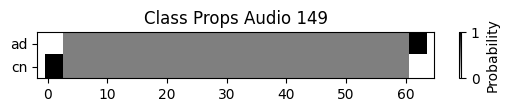

150
2/2 [==============================] - 0s 24ms/step
The dx is: ad 
The actual dx is: cn 


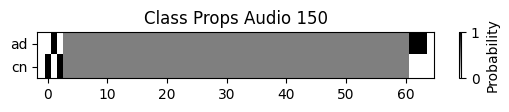

151
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


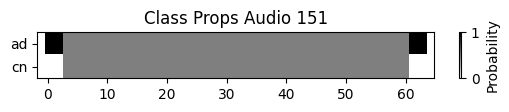

152
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


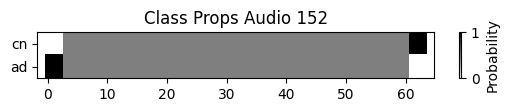

153
2/2 [==============================] - 0s 16ms/step
The dx is: ad 
The actual dx is: cn 


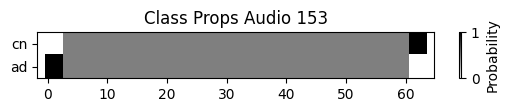

154
2/2 [==============================] - 0s 17ms/step
The dx is: ad 
The actual dx is: cn 


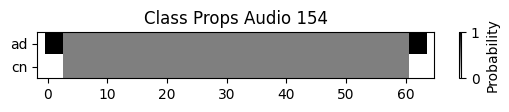

155
2/2 [==============================] - 0s 18ms/step
The dx is: ad 
The actual dx is: cn 


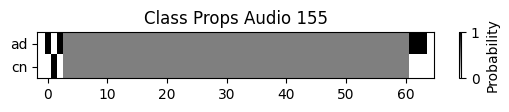

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

for i in range(0, 156):
    print(i)
    filename = metadata['filename'].iloc[i].split('/')[-1]
    audio_wav, predictions, mel_spectrogram = filename_to_predictions(metadata['filename'].iloc[i])

    infered_class = class_names[predictions.mean(axis=0).argmax()]

    timeframes = map_timeframes(post_process(predictions), mel_spectrogram.numpy().T)
    print(f"The dx is: {infered_class} ")
    print(f"The actual dx is: {metadata['dx'].iloc[i]} ")

    # Normalize the probabilities for each timestep to sum to 1
    normalized_predictions = predictions / np.sum(predictions, axis=1, keepdims=True)

    # Plot and label the model output scores for the top-scoring classes.
    mean_predictions = np.mean(predictions, axis=0)
    top_class_indices = np.argsort(mean_predictions)[::-1]
    plt.subplot(5, 1, 5)
    plt.title('Class Props Audio '+str(i))
    plt.imshow(
        normalized_predictions[:, top_class_indices].T,
        aspect="auto",
        interpolation="nearest",
        cmap="gray_r",
    )
    patch_padding = (0.025 / 2) / 0.01
    plt.xlim([-patch_padding - 0.5, predictions.shape[0] + patch_padding - 0.5])
    # Label the top_N classes.
    yticks = range(0, len(class_names), 1)
    plt.yticks(yticks, [class_names[top_class_indices[x]] for x in yticks])
    _ = plt.ylim(-0.5 + np.array([len(class_names), 0]))
    plt.colorbar(label='Probability')
    plt.subplots_adjust(hspace=0.75)
    plt.show()


In [ ]:
a=[]
for i in attention:
  a.append(i)
df = pd.DataFrame(a)

In [ ]:
df.T #column = relation index

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.053311,0.047288,0.051158,0.054083,0.050389,0.041965,0.032510,0.045442,0.038308,0.046467,...,0.051270,0.048137,0.050742,0.050373,0.043840,0.036393,0.032527,0.046429,0.033410,0.024653
1,0.020102,0.026102,0.024996,0.021607,0.024557,0.034171,0.065842,0.030959,0.043283,0.029480,...,0.026456,0.028630,0.024026,0.024043,0.031216,0.049509,0.060177,0.031858,0.059212,0.091264
2,0.004233,0.003956,0.004075,0.004250,0.004274,0.003737,0.002817,0.003665,0.003622,0.003914,...,0.003595,0.003624,0.003812,0.003837,0.003732,0.003242,0.002882,0.003573,0.002894,0.001847
3,0.018827,0.021003,0.019323,0.019100,0.019917,0.022724,0.017493,0.022202,0.020195,0.020581,...,0.017443,0.018765,0.018814,0.018673,0.022431,0.019119,0.017644,0.018816,0.017273,0.013739
4,0.082296,0.090507,0.086058,0.082048,0.082654,0.091046,0.087697,0.090121,0.092919,0.090291,...,0.082853,0.083930,0.083150,0.080848,0.089006,0.089615,0.085953,0.087413,0.087504,0.083713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.181942,0.218660,0.204552,0.186267,0.206042,0.266921,0.425195,0.240345,0.318459,0.235321,...,0.219385,0.231919,0.207754,0.207539,0.248330,0.349705,0.407855,0.252497,0.392210,0.549826
60,0.278802,0.260765,0.277654,0.283292,0.266440,0.236748,0.215144,0.256333,0.229874,0.260745,...,0.282769,0.268225,0.271435,0.270641,0.247010,0.224303,0.212938,0.263364,0.220858,0.200433
61,0.268668,0.247992,0.257140,0.266041,0.257743,0.236300,0.203395,0.245137,0.220777,0.242699,...,0.266345,0.260259,0.262304,0.264094,0.241663,0.221658,0.212392,0.250638,0.222343,0.214243
62,0.033791,0.041800,0.039361,0.035149,0.039000,0.050562,0.085959,0.046596,0.062625,0.045998,...,0.041601,0.044513,0.039808,0.039283,0.047434,0.068102,0.078604,0.048649,0.076857,0.104622


In [ ]:
a=0
ad_score=[]
print('AD :')
for i in ad_index:
  for j in ad[i]:
    a=a+j
  ad_score.append(a)
  print('Relation '+str(i)+' '+str(a))
print('sum :',sum(ad_score))

b=0
cn_score=[]
print('CN :')
for i in cn_index:
  for j in cn[i]:
    b=b+j
  cn_score.append(b)
  print('Relation '+str(i)+' '+str(b))
print('sum :',sum(cn_score))

AD :
Relation 6 7.543904167452638
Relation 33 16.631993778302785
Relation 38 22.92648095079312
Relation 50 28.948850644636877
Relation 59 35.8715515915801
sum : 111.92278113276552
CN :
Relation 8 6.671507739165463
Relation 24 21.42127810970618
Relation 28 27.413572579351637
Relation 56 33.45561260852941
Relation 60 40.797407085288285
sum : 129.75937812204097


In [ ]:
ิิืืืืืb=0
print('CN :')
for i in [29,30,43,46,55,61]:
  for j in ad[i]:
    b=b+j
  print('Relation '+str(i)+' '+str(b))

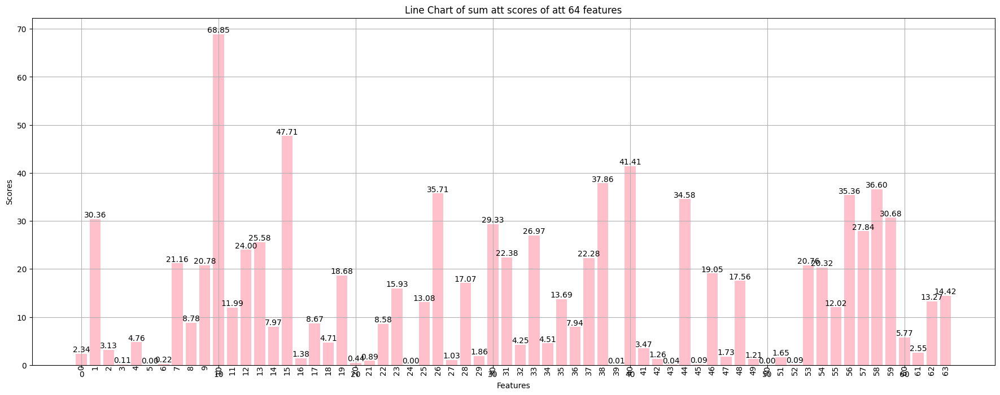

In [ ]:
+weight=22
height=8

plt.figure(figsize=(weight, height))

data = df.iloc[64]
index_labels = np.arange(len(data))

# Plot the bar chart
plt.bar(index_labels, data, color='pink')

plt.title('Line Chart of sum att scores of att 64 features')
plt.xlabel('Features')
plt.ylabel('Scores')
# Display data labels above each bar
for i in range(len(data)):
    plt.text(i, data[i] + 0.02, f'{data[i]:.2f}', ha='center', va='bottom')

# Display index labels beside each bar
for i in range(len(data)):
    plt.text(i, -0.02, f'{index_labels[i]}', ha='center', va='top', rotation=90)

plt.grid(True)
plt.show()

In [ ]:
a=[]
  for i in high_value_data['att']:
    a.append(i[0])
  df = pd.DataFrame(a)

  # add sum_score row
  j=0
  sum_score = []
  while j<df.shape[1]:
    sum_score.append(df[j].sum())
    j+=1
  a.append(sum_score)
  df = pd.DataFrame(a)

  # sum score for att feature
  sum_att_features_scores = df.iloc[df.shape[0]-1]

In [ ]:
audio_df = pd.DataFrame(columns=['filename','frame','start','end','audio','mel_spec','emb','att','ad_score','cn_score'])
file_i_df = gen_dataframe(filename, audio_wav, mel_spectrogram, embedding, attention, predictions)
i_df = pd.concat([audio_df, file_i_df], ignore_index=True)
i_df

In [ ]:
embedding.shape

In [ ]:
len(audio_wav.numpy().tolist())

494875

In [ ]:
#Audio(audio_wav, rate=16000)
n = 0 #drop silent frame
i = 0

for val in audio_wav.numpy().tolist():
        if float(-0.005) < float(val) < float(0.005):
            n += 1

print(n)

186134


###Audio dataframe

In [ ]:
df = pd.DataFrame(columns=['filename','frame','start','end','audio','mel_spec','emb','att','ad_score','cn_score','true_label'])

In [ ]:
def gen_dataframe(filename,audio_wav,mel_spectrogram,embedding,attention,predictions,true_label):
  df = pd.DataFrame(columns=['filename','frame','start','end','audio','mel_spec','emb','att','ad_score','cn_score','true_label'])
  data = []
  for i, timeframe in enumerate(timeframes):
    frame=i+1
    filename = filename
    true_label = true_label
    prediction_ad=predictions[i][0]
    prediction_cn=predictions[i][1]
    start=round(timeframe['start_time'])
    end=round(timeframe['end_time'])

    audio = audio_wav[start:end]

    s=round(i*48)
    e=round((i+1)*48)
    mel_spec=mel_spectrogram[s:e]

    trim_embedding=embedding[i:i+1]
    trim_attention=attention[i:i+1]

    df = df.append({'filename': filename,
                'frame': frame,
                'start': start,
                'end': end,
                'audio': audio,
                'mel_spec': mel_spec,
                'emb': trim_embedding,
                'att': trim_attention,
                'ad_score': prediction_ad,
                'cn_score': prediction_cn,
                'true_label': true_label}, ignore_index=True)

    #data.append([filename,frame,start,end,audio,mel_spec,trim_embedding,trim_attention,prediction_ad,prediction_cn])

  #df = pd.DataFrame(data,columns=['filename','frame','start','end','audio','mel_spec','emb','att','ad_score','cn_score'])
  #return df
  return df

In [ ]:
def gen_dataframe2(filename, audio_wav, mel_spectrogram, embedding, attention, predictions, true_label):
    data = []
    for i, timeframe in enumerate(timeframes):
        frame = i + 1
        start = round(timeframe['start_time'])
        end = round(timeframe['end_time'])
        audio = audio_wav[start:end]
        s = round(i * 48)
        e = round((i + 1) * 48)
        mel_spec = mel_spectrogram[s:e]
        trim_embedding = embedding[i:i+1]
        trim_attention = attention[i:i+1]
        prediction_ad = predictions[i][0]
        prediction_cn = predictions[i][1]

        data.append({'filename': filename,
                     'frame': frame,
                     'start': start,
                     'end': end,
                     'audio': audio,
                     'mel_spec': mel_spec,
                     'emb': trim_embedding,
                     'att': trim_attention,
                     'ad_score': prediction_ad,
                     'cn_score': prediction_cn,
                     'true_label': true_label})

    df = pd.DataFrame(data)
    return df

In [ ]:
attention = keras.Model(inputs=model.input, outputs=model.get_layer("attention").output)
attention=attention.predict(all_ds)

embedding = keras.Model(inputs=model.input, outputs=model.get_layer("embedding").output)
embedding=embedding.predict(all_ds)

156/156 [==============================] - 0s 1ms/step


In [ ]:
i=0 #select only correct
while i < 156:
  filename = metadata['filename'].iloc[i].split('/')[-1]
  true_label = metadata['dx'].iloc[i]
  audio_wav, predictions, mel_spectrogram = filename_to_predictions(metadata['filename'].iloc[i])

  file_att = attention
  file_ebd = embedding

  timeframes = map_timeframes(post_process(predictions),  mel_spectrogram.numpy().T)
  file_att, file_ebd = get_att_end(i, file_att, file_ebd)

  infered_class = class_names[predictions.mean(axis=0).argmax()]

  #if infered_class == metadata['dx'].iloc[i]:
  file_i_df = gen_dataframe2(filename, audio_wav, mel_spectrogram, file_ebd, file_att, predictions, true_label)
  df = pd.concat([df, file_i_df], ignore_index=True)
  print(df.shape)
  print(i)
  i+=1

2/2 [==============================] - 0s 20ms/step
(64, 11)
0
2/2 [==============================] - 0s 18ms/step
(128, 11)
1
2/2 [==============================] - 0s 11ms/step
(192, 11)
2
2/2 [==============================] - 0s 12ms/step
(256, 11)
3


2/2 [==============================] - 0s 12ms/step
(320, 11)
4


2/2 [==============================] - 0s 12ms/step
(384, 11)
5
2/2 [==============================] - 0s 12ms/step
(448, 11)
6
2/2 [==============================] - 0s 13ms/step
(512, 11)
7
2/2 [==============================] - 0s 15ms/step
(576, 11)
8
2/2 [==============================] - 0s 12ms/step
(640, 11)
9
2/2 [==============================] - 0s 12ms/step
(704, 11)
10
2/2 [==============================] - 0s 12ms/step
(768, 11)
11
2/2 [==============================] - 0s 20ms/step
(832, 11)
12
2/2 [==============================] - 0s 16ms/step
(896, 11)
13
2/2 [==============================] - 0s 11ms/step
(960, 11)
14
2/2 [==============================] - 0s 12ms/step
(1024, 11)
15
2/2 [==============================] - 0s 12ms/step
(1088, 11)
16
2/2 [==============================] - 0s 12ms/step
(1152, 11)
17
2/2 [==============================] - 0s 12ms/step
(1216, 11)
18
2/2 [==============================] - 0s 12ms/step
(1280, 11)
19
2/2 [====================

In [ ]:
df

,filename,frame,start,end,audio,mel_spec,emb,att,ad_score,cn_score,true_label
0,adrso002_split0.wav,1,0,7732,"(tf.Tensor(-2.468036e-10, shape=(), dtype=floa...","((tf.Tensor(-6.9059153, shape=(), dtype=float3...","[[0.08343923, 1.184995, 0.0, 0.0, 0.002480328,...","[[0.54432195, 0.0, 0.038689487, 0.0, 0.0065530...",0.785382,0.000000,cn
1,adrso002_split0.wav,2,7732,15465,"(tf.Tensor(-0.0014631692, shape=(), dtype=floa...","((tf.Tensor(-1.9417634, shape=(), dtype=float3...","[[0.07954777, 0.3085998, 0.04035149, 0.1550899...","[[0.5212805, 0.0, 0.04214205, 0.0, 0.006356984...",0.779623,0.000000,cn
2,adrso002_split0.wav,3,15465,23197,"(tf.Tensor(-0.22117981, shape=(), dtype=float3...","((tf.Tensor(-0.7516864, shape=(), dtype=float3...","[[0.089550495, 0.6286292, 0.56269854, 0.547260...","[[0.5681642, 0.0, 0.035294548, 0.0, 0.00675497...",0.791510,0.000000,cn
3,adrso002_split0.wav,4,23197,30930,"(tf.Tensor(-0.07402328, shape=(), dtype=float3...","((tf.Tensor(1.7155465, shape=(), dtype=float32...","[[0.26593077, 0.14558418, 0.0, 0.12316098, 0.2...","[[0.63283235, 0.0, 0.026590306, 0.0, 0.0072763...",0.401405,0.401405,cn
4,adrso002_split0.wav,5,30930,38662,"(tf.Tensor(-0.007828117, shape=(), dtype=float...","((tf.Tensor(-0.96445835, shape=(), dtype=float...","[[0.037756514, 0.54645723, 0.0, 0.006843393, 0...","[[0.56454194, 0.0, 0.03582083, 0.0, 0.00673932...",0.400678,0.400678,cn
...,...,...,...,...,...,...,...,...,...,...,...
9979,adrso316_split164.wav,60,456213,463945,"(tf.Tensor(-0.0077462, shape=(), dtype=float32...","((tf.Tensor(-2.6951852, shape=(), dtype=float3...","[[0.0, 0.47204128, 0.12736146, 0.0, 0.0, 0.0, ...","[[0.19702187, 0.0, 0.1090105, 0.0, 0.057232395...",0.342529,0.342529,cn
9980,adrso316_split164.wav,61,463945,471678,"(tf.Tensor(0.006242819, shape=(), dtype=float3...","((tf.Tensor(-1.7983813, shape=(), dtype=float3...","[[0.0, 1.4496474, 1.2580624, 0.0, 0.0, 0.0, 0....","[[0.16559626, 0.0, 0.12625821, 0.0, 0.10367726...",0.346293,0.346293,cn
9981,adrso316_split164.wav,62,471678,479410,"(tf.Tensor(-0.0010727595, shape=(), dtype=floa...","((tf.Tensor(-1.869702, shape=(), dtype=float32...","[[0.0, 0.5987703, 0.8522491, 0.020573094, 0.0,...","[[0.22924098, 0.0, 0.097220354, 0.0, 0.0241139...",0.690627,0.000000,cn
9982,adrso316_split164.wav,63,479410,487143,"(tf.Tensor(-0.044854064, shape=(), dtype=float...","((tf.Tensor(0.7895115, shape=(), dtype=float32...","[[0.25760987, 0.40407154, 0.014937582, 0.0, 0....","[[0.35921958, 0.0, 0.08081528, 0.0, 0.01123907...",0.759007,0.000000,cn


In [ ]:
print('Total files : '+str(df.shape[0]/64))

Total files : 156.0


In [ ]:
audio_df = df # all = 61 files
#print((audio_df['ad_score'] > audio_df['cn_score']).sum())
#audio_df = audio_df[(audio_df['ad_score'] > audio_df['cn_score']) | (audio_df['ad_score'] < audio_df['cn_score'])] # query ad!=cn = 366 rows

In [ ]:
#select ad!=cn

audio_df = audio_df[(audio_df['ad_score'] > audio_df['cn_score']) | (audio_df['ad_score'] < audio_df['cn_score'])] # query ad!=cn = 366 rows
audio_df.shape

(936, 11)

In [ ]:
n = 0 #drop silent frame
i = 0
a=[]
while i < len(audio_df):
    for val in audio_df.iloc[i][4].numpy().tolist():
        n+=val
    a.append(n)
    n = 0
    i+=1

print(len(a))


936


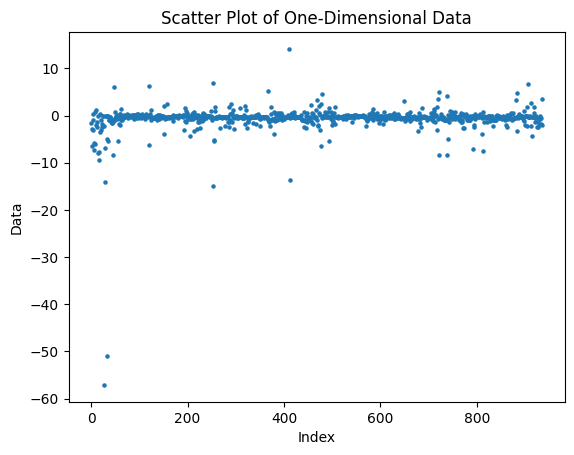

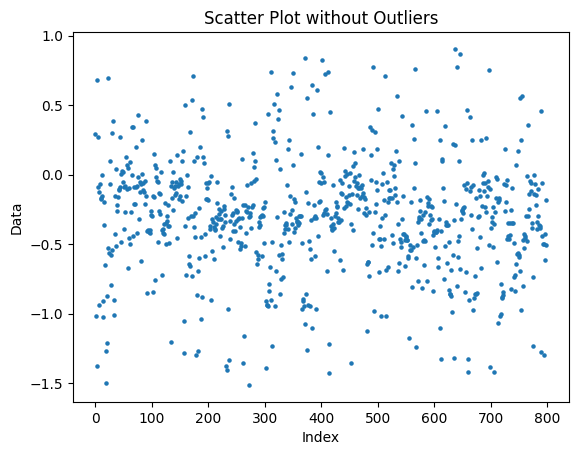

In [ ]:
data = a
# Plot scatter plot
plt.scatter(np.arange(len(data)), data, s=5)  # s determines the marker size
plt.xlabel('Index')
plt.ylabel('Data')
plt.title('Scatter Plot of One-Dimensional Data')
plt.show()

# Calculate the first and third quartiles
q1, q3 = np.percentile(data, [25, 80])

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the outlier threshold
threshold = 1.5

# Identify outliers
outliers_indices = np.where((data < q1 - threshold * iqr) | (data > q3 + threshold * iqr))[0]

# Deselect outliers
data_no_outliers = np.delete(data, outliers_indices)

# Plot scatter plot without outliers
plt.scatter(np.arange(len(data_no_outliers)), data_no_outliers, s=5)
plt.xlabel('Index')
plt.ylabel('Data')
plt.title('Scatter Plot without Outliers')
plt.show()

In [ ]:
df_no_outliers = df.drop(outliers_indices)
df_no_outliers.shape ##all which deselect outliner ยังแยก ad,cn ได้ไม่ดี

(9847, 11)

In [ ]:
#select ad!=cn
audio_df = df_no_outliers #all which deselect outliner with ad!=cn condition
audio_df = audio_df[(audio_df['ad_score'] > audio_df['cn_score']) | (audio_df['ad_score'] < audio_df['cn_score'])] # query ad!=cn = 366 rows
audio_df.shape

(918, 11)

In [ ]:
outliers_audio = df.iloc[outliers_indices]

In [ ]:
n = 0 #drop silent frame
i = 0
a=[]
while i < len(outliers_audio):
    for val in outliers_audio.iloc[i][4].numpy().tolist():
        n+=val
    a.append(n)
    n = 0
    i+=1

print(len(a))


137


###Kmeans

In [ ]:
audio_df['att']
#df_no_outliers['att']

61      [[0.62336415, 0.0, 0.027826937, 0.0, 0.0071967...
62      [[0.55812776, 0.0, 0.036556743, 0.0, 0.0066972...
64      [[0.6820806, 0.0, 0.046489123, 0.0, 0.02571225...
65      [[0.5220329, 0.0, 0.0703602, 0.0, 0.03729965, ...
66      [[0.57154256, 0.0, 0.062230993, 0.0, 0.0314882...
                              ...                        
9921    [[0.013097727, 0.0, 0.2863054, 0.0, 0.53060156...
9922    [[0.20193416, 0.0, 0.10607844, 0.0, 0.04780417...
9981    [[0.22924098, 0.0, 0.097220354, 0.0, 0.0241139...
9982    [[0.35921958, 0.0, 0.08081528, 0.0, 0.01123907...
9983    [[0.28927368, 0.0, 0.09080384, 0.0, 0.01380521...
Name: att, Length: 918, dtype: object

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming X is properly prepared as a 2D array

# Perform Singular Value Decomposition (SVD)
U, S, Vt = np.linalg.svd(X)

# Project data onto the first two principal components
num_components = min(2, X.shape[1])  # Ensure not to exceed the number of original features
X_2d = np.dot(X, Vt[:num_components].T)

# Plot the 2D representation if there are at least two components
if num_components >= 2:
    plt.scatter(X_2d[:, 0], X_2d[:, 1])
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.title('2D Representation of Data after SVD')
    plt.show()
else:
    print("Insufficient components for 2D representation after dimensionality reduction.")

Insufficient components for 2D representation after dimensionality reduction.


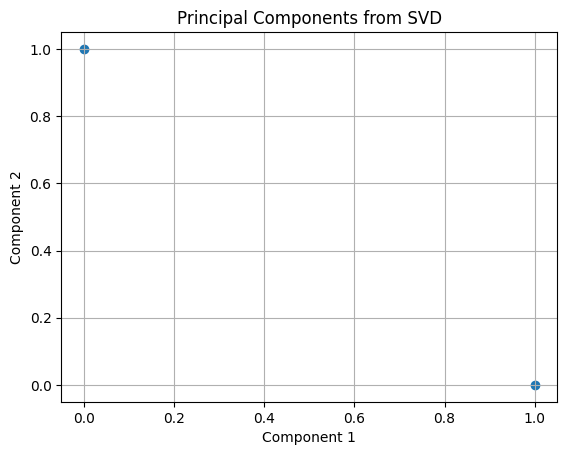

In [ ]:
from sklearn.decomposition import PCA
X = np.array(audio_df['att'].tolist())

# Reshape X to make it two-dimensional
n_samples = X.shape[0]
X = X.reshape(n_samples, -1)  # Reshape to (n_samples, 64)

# Perform PCA for dimensionality reduction
pca = PCA(n_components=2)  # Reduce to 2 dimensions
X_2d = pca.fit_transform(X)

# X_2d now contains the 2-dimensional representation of the original data
#print(X_2d.shape)

import matplotlib.pyplot as plt
import numpy as np

# Assuming X is properly prepared as a 2D array

# Perform Singular Value Decomposition (SVD)
U, S, Vt = np.linalg.svd(X_2d)

plt.scatter(X_2d)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Principal Components from PCA')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

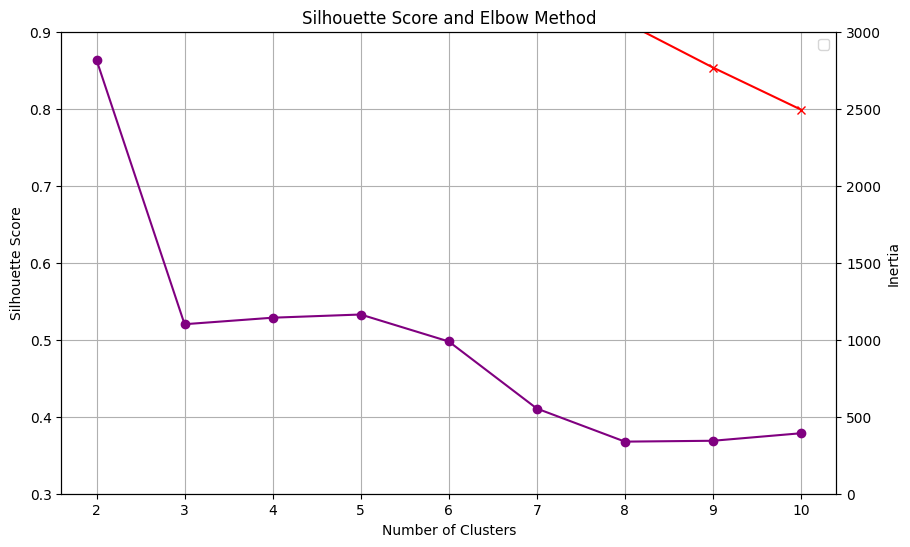

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Initialize lists to store silhouette scores and inertia scores (Elbow method)
silhouette_scores = []
inertia_scores = []

# Define the range of cluster numbers to try
min_clusters = 2
max_clusters = 10

vectors = np.array([np.array(x) for x in audio_df['att']])

# Convert the list of vectors into a matrix
X = np.vstack(vectors)

# Perform K-means clustering for different values of k
for k in range(min_clusters, max_clusters + 1):
    # Perform K-means clustering
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    labels = kmeans.labels_

    # Calculate silhouette score
    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

    # Calculate inertia (within-cluster sum of squares) for the Elbow method
    inertia_scores.append(kmeans.inertia_)

# Plot silhouette scores and inertia scores on the same image
plt.figure(figsize=(10, 6))

# Plot silhouette scores
plt.plot(range(min_clusters, max_clusters + 1), silhouette_scores, marker='o',color='purple', label='Silhouette')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.ylim(0.3, 0.9)
plt.grid(True)

# Create a secondary y-axis for inertia scores (Elbow method)
ax2 = plt.gca().twinx()
ax2.plot(range(min_clusters, max_clusters + 1), inertia_scores, marker='x', color='red')
ax2.set_ylabel('Inertia')
ax2.set_ylim(0, 3000)

# Add legend
lines1, labels1 = plt.gca().get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
plt.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.title('Silhouette Score and Elbow Method')
plt.show()

In [ ]:
silhouette_scores

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


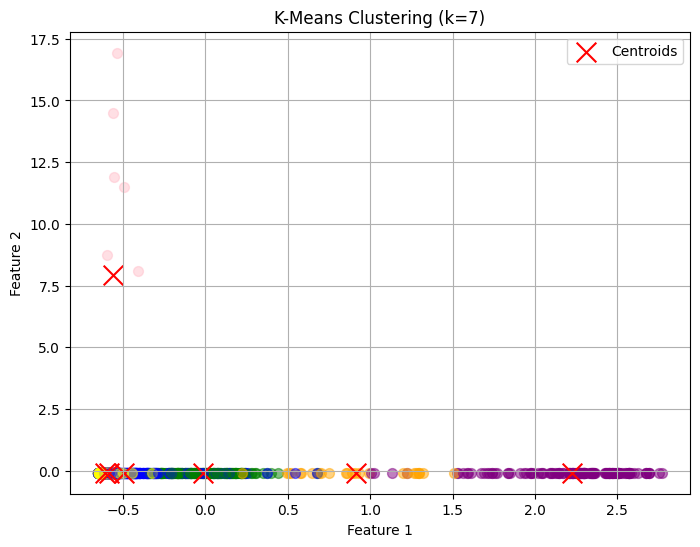

In [ ]:
# if k=7
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Extract vectors from the DataFrame np.array(x)
vectors = np.array([np.array(x) for x in audio_df['att']])

# Convert the list of vectors into a matrix
X = np.vstack(vectors)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=7)  # Set number of clusters to 5
kmeans.fit(X_scaled)
centroids = kmeans.cluster_centers_
labels = kmeans.labels_

# Define custom colors for each cluster
colors = ['yellow', 'purple', 'green', 'blue', 'orange', 'pink', 'red']  # Define colors for each cluster label

# Plot the data points and centroids with custom colors
plt.figure(figsize=(8, 6))
for i in range(len(X_scaled)):
    plt.scatter(X_scaled[i, 0], X_scaled[i, 1], c=colors[labels[i]], s=50, alpha=0.5)  # Use custom color
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, color='red', label='Centroids')
plt.title('K-Means Clustering (k=7)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from collections import Counter
label_counts = Counter(labels)

# Print the counts for each cluster
for cluster, count in label_counts.items():
    print(f"Cluster {cluster}: {count} data points")

Cluster 0: 252 data points
Cluster 3: 338 data points
Cluster 1: 138 data points
Cluster 2: 150 data points
Cluster 4: 25 data points
Cluster 6: 6 data points
Cluster 5: 9 data points


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

select_index = []
num_clusters = len(np.unique(labels))  # Get the number of clusters found by K-means

for i in range(num_clusters):
    # Set the selected cluster label
    selected_cluster = i  # Change this to the cluster label you want to plot

    # Calculate the number of bins using the square root of the number of data points in the selected cluster
    num_bins = int(np.sqrt(np.sum(labels == selected_cluster)))

    # Plot the data points for the selected cluster with the specified number of bins
    plt.figure(figsize=(8, 6))
    plt.hist2d(X[labels == selected_cluster, 0], X[labels == selected_cluster, 1], bins=num_bins, cmap='Blues')

    # Plot the centroids of the selected cluster if centroids exist
    #if selected_cluster < centroids.shape[0]:
    plt.scatter(centroids[selected_cluster, 0], centroids[selected_cluster, 1], marker='x', s=200, color='red', label='Centroid')

    plt.title(f'K-Means Clustering: Cluster {selected_cluster}')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.legend()
    plt.grid(True)
    plt.colorbar(label='Counts')  # Add color bar to indicate density

    #plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering: Cluster '+str(i)+'.png')

    plt.show()

    # Get the indices of data points belonging to the selected cluster
    indices_selected_cluster = np.where(labels == selected_cluster)[0]
    select_index.append(indices_selected_cluster)

    # Print the indices
    print("Indices of data points in the selected cluster:", indices_selected_cluster)

    # Extract rows corresponding to the selected cluster from the DataFrame
    selected_rows_cluster = audio_df.iloc[indices_selected_cluster.tolist()]

    # Print characteristics of the selected cluster
    print("Characteristics of Cluster", selected_cluster)
    print(selected_rows_cluster.describe())

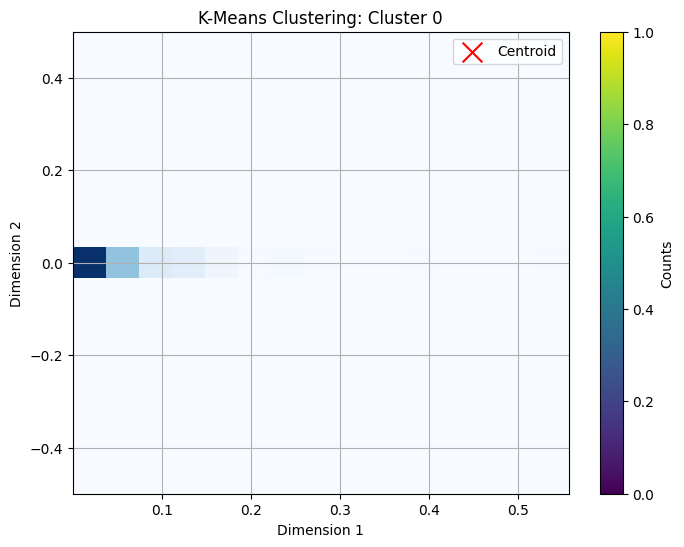

Indices of data points in the selected cluster: [  0   1   2   3   4   5   6   7   8   9  10  11  12  14  15  16  26  27
  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  48  49
 114 116 117 118 119 139 140 141 174 175 176 177 178 179 195 196 197 201
 202 229 230 231 232 233 242 253 254 272 273 274 275 276 290 300 301 302
 303 305 313 320 321 322 323 330 331 333 334 343 349 350 360 361 362 363
 364 365 379 380 392 393 394 409 410 417 418 419 423 424 425 426 427 428
 429 430 431 435 436 438 439 440 441 442 443 445 446 449 450 451 452 453
 454 455 456 457 458 459 460 461 462 463 467 472 473 474 475 476 480 481
 482 483 484 485 486 487 492 493 494 495 496 497 578 579 580 581 588 589
 590 591 592 593 607 608 609 610 611 633 642 643 644 645 646 647 655 657
 659 663 666 667 675 676 687 710 721 722 723 751 752 757 762 763 764 765
 766 767 777 780 781 782 784 785 798 799 800 801 802 803 810 811 812 813
 814 815 843 844 845 864 865 866 867 868 878 879 880 881 882 883 884 885
 88

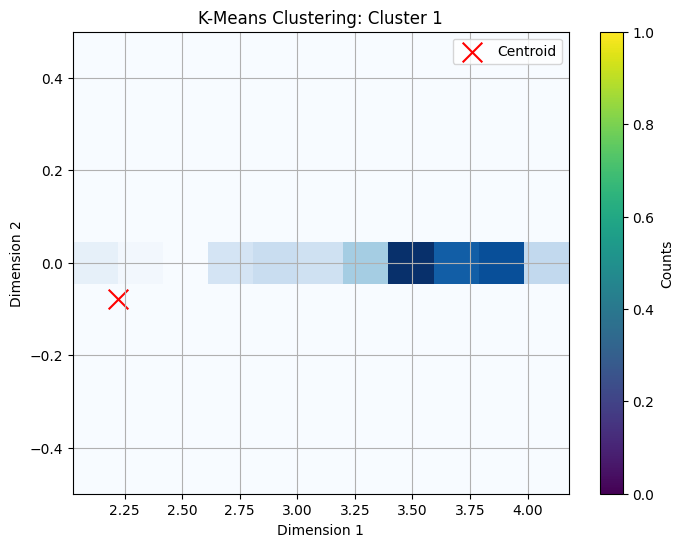

Indices of data points in the selected cluster: [ 57  58 108 109 110 111 112 113 115 126 127 129 130 132 133 138 142 143
 147 148 149 198 199 222 223 224 227 228 240 241 243 244 245 252 255 256
 257 294 295 296 297 298 299 318 319 335 339 340 342 348 351 352 353 381
 382 383 384 385 386 387 388 389 408 411 412 413 414 415 416 420 421 422
 432 433 437 444 447 448 477 478 479 489 490 491 553 555 556 557 576 577
 613 614 615 616 617 621 622 623 624 625 626 627 628 629 630 631 632 634
 635 641 648 649 656 672 677 685 686 689 708 711 712 713 714 715 716 725
 819 820 821 846 849 850 851 862 869 897 898 899]
Characteristics of Cluster 1
         ad_score    cn_score
count  138.000000  138.000000
mean     0.009803    0.967568
std      0.082305    0.123441
min      0.000000    0.000000
25%      0.000000    0.985320
50%      0.000000    0.989078
75%      0.000000    0.992076
max      0.790887    0.994746


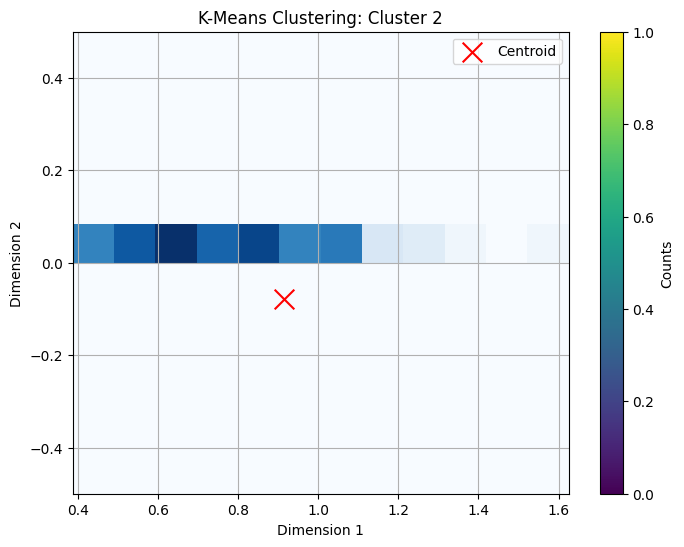

Indices of data points in the selected cluster: [ 63  72  73  74  78  79  82  83  84  90  91  92  93  94  95  98 101 102
 103 104 105 106 120 121 123 124 125 150 151 152 153 154 155 156 157 158
 159 160 161 162 164 165 166 167 168 169 170 180 183 184 185 207 208 209
 212 214 215 216 217 218 259 260 261 262 263 264 309 310 311 324 325 326
 327 328 329 359 368 375 376 377 398 507 508 515 516 539 541 542 543 544
 545 546 547 548 549 550 551 558 559 561 562 563 566 567 568 569 570 571
 572 575 587 594 595 596 597 598 599 600 601 602 603 604 605 612 660 661
 679 692 694 695 731 744 745 746 750 753 822 824 827 852 853 854 855 856
 857 877 903 904 905 913]
Characteristics of Cluster 2
         ad_score    cn_score
count  150.000000  150.000000
mean     0.011284    0.784075
std      0.079308    0.144327
min      0.000000    0.000000
25%      0.000000    0.739573
50%      0.000000    0.813914
75%      0.000000    0.877296
max      0.593043    0.946945


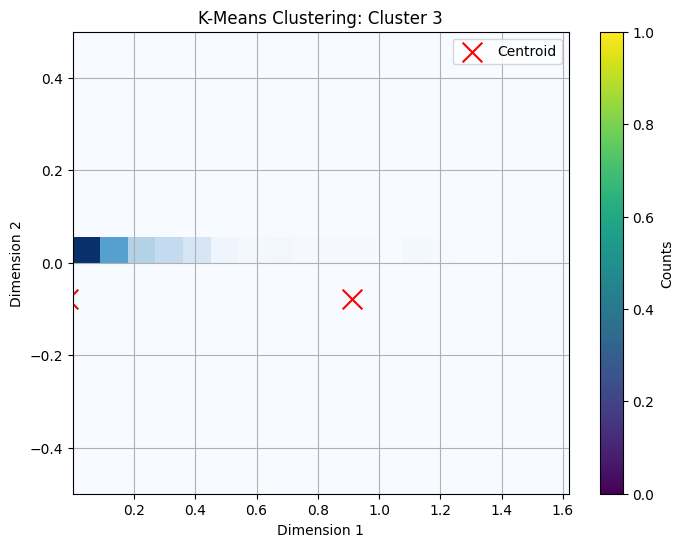

Indices of data points in the selected cluster: [ 13  17  18  19  20  21  22  23  24  25  44  45  46  47  50  51  52  53
  54  55  56  59  60  61  62  64  65  66  67  68  69  70  71  75  76  77
  80  81  85  86  87  88  89 107 122 128 131 134 135 136 137 144 145 146
 163 171 172 173 181 182 186 187 188 189 190 191 192 193 194 200 203 204
 205 206 210 211 213 219 220 221 225 226 234 235 236 237 238 239 246 247
 248 249 250 251 258 265 266 267 268 269 277 278 279 280 281 282 283 284
 285 286 287 288 289 304 306 307 308 312 314 317 332 336 337 338 341 344
 345 346 347 354 355 356 357 358 366 367 369 370 371 372 373 374 378 390
 391 395 396 397 399 400 401 402 403 404 405 406 407 434 464 465 466 468
 469 470 471 488 504 505 506 509 510 511 512 513 514 517 518 519 520 521
 522 523 524 525 526 527 528 529 530 531 532 533 534 535 536 537 538 540
 552 554 560 564 565 573 574 582 583 584 585 586 618 636 637 638 639 640
 650 651 652 653 654 658 662 664 665 668 669 670 671 673 674 678 680 681
 68

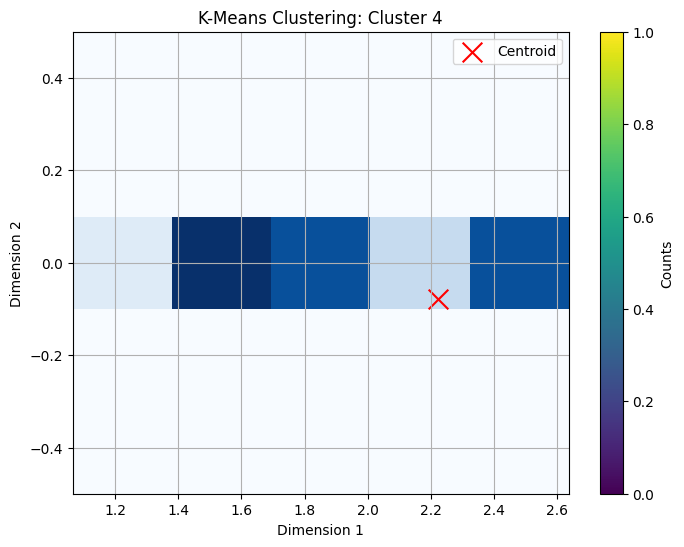

Indices of data points in the selected cluster: [ 96  97  99 100 270 271 291 292 293 315 316 498 499 500 501 502 503 606
 619 620 705 740 741 761 774]
Characteristics of Cluster 4
        ad_score   cn_score
count  25.000000  25.000000
mean    0.043785   0.839329
std     0.151986   0.274591
min     0.000000   0.000000
25%     0.000000   0.884596
50%     0.000000   0.943029
75%     0.000000   0.974685
max     0.587410   0.987163


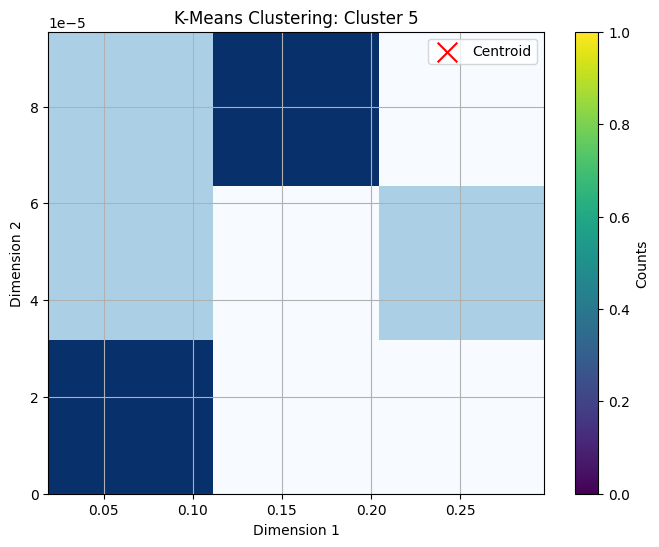

Indices of data points in the selected cluster: [816 817 818 870 871 872 873 874 875]
Characteristics of Cluster 5
       ad_score  cn_score
count  9.000000       9.0
mean   0.725605       0.0
std    0.105804       0.0
min    0.556660       0.0
25%    0.683275       0.0
50%    0.698780       0.0
75%    0.833412       0.0
max    0.858313       0.0


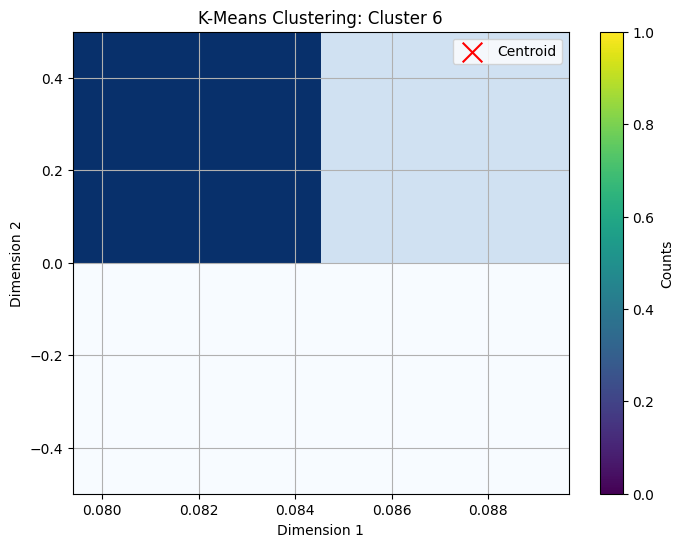

Indices of data points in the selected cluster: [768 769 770 771 772 773]
Characteristics of Cluster 6
       ad_score  cn_score
count  6.000000       6.0
mean   0.588022       0.0
std    0.056294       0.0
min    0.530778       0.0
25%    0.538320       0.0
50%    0.590544       0.0
75%    0.639380       0.0
max    0.639695       0.0


In [ ]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have already defined 'X', 'labels', and 'centroids'

select_index = []
num_clusters = len(np.unique(labels))  # Get the number of clusters found by K-means

for i in range(num_clusters):
    # Set the selected cluster label
    selected_cluster = i  # Change this to the cluster label you want to plot

    # Calculate the number of bins using the square root of the number of data points in the selected cluster
    num_bins = int(np.sqrt(np.sum(labels == selected_cluster)))

    # Plot the data points for the selected cluster with the specified number of bins
    plt.figure(figsize=(8, 6))
    plt.hist2d(X[labels == selected_cluster, 0], X[labels == selected_cluster, 1], bins=num_bins, cmap='Blues')

    # Plot all centroids
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, color='red', label='Centroid')

    plt.title(f'K-Means Clustering: Cluster {selected_cluster}')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.legend()
    plt.grid(True)
    plt.colorbar(label='Counts')  # Add color bar to indicate density

    plt.show()

    # Get the indices of data points belonging to the selected cluster
    indices_selected_cluster = np.where(labels == selected_cluster)[0]
    select_index.append(indices_selected_cluster)

    # Print the indices
    print("Indices of data points in the selected cluster:", indices_selected_cluster)

    # Extract rows corresponding to the selected cluster from the DataFrame
    selected_rows_cluster = audio_df.iloc[indices_selected_cluster.tolist()]

    # Print characteristics of the selected cluster
    print("Characteristics of Cluster", selected_cluster)
    print(selected_rows_cluster.describe())


In [ ]:
data = "[96 99 100 261 262 263 270 271 291 292 293 315 316 479 489 490 491 498 499 500 501 502 503 587 606 612 618 619 620 679 705 725 740 741 761 774]"
result = data.replace(" ", ",")

print(result)

[96,99,100,261,262,263,270,271,291,292,293,315,316,479,489,490,491,498,499,500,501,502,503,587,606,612,618,619,620,679,705,725,740,741,761,774]


In [ ]:
result = [0,1,2,3,4,5,6,7,8,9,10,11,12,14,15,16,18,19,20,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,48,49,114,116,117,118,119,139,140,141,145,146,174,175,176,177,178,179,200,201,202,203,229,230,231,232,233,253,254,272,273,274,275,276,277,278,279,280,281,300,301,302,303,313,320,321,322,323,330,331,333,334,343,344,345,346,347,349,350,361,363,364,365,378,379,380,393,409,410,417,418,419,423,424,425,426,427,428,429,430,431,435,436,445,446,449,450,451,452,453,454,455,456,457,458,459,460,461,462,467,474,475,476,480,481,482,483,484,485,492,493,494,495,496,497,578,579,580,581,588,589,590,591,592,593,607,608,609,610,611,633,642,643,644,646,647,654,655,657,658,659,666,675,676,687,710,720,721,722,723,724,751,752,757,762,763,764,765,766,767,777,780,781,782,783,784,785,798,799,800,801,802,803,810,811,812,813,814,815,843,844,845,864,865,866,867,871,872,874,875,882,883,884,885,886,887,888,889,890,891,892,894,895,896,906,907,908,909,910,911]

indices_selected_cluster = np.array(result, dtype=int)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Convert 'data' into a numpy array
data = np.array(data)

# Assuming 'centroids' is a numpy array with shape (n_clusters, 2)

result = [0,1,2,3,4,5,6,7,8,9,10,11,12,14,15,16,18,19,20,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,48,49,114,116,117,118,119,139,140,141,145,146,174,175,176,177,178,179,200,201,202,203,229,230,231,232,233,253,254,272,273,274,275,276,277,278,279,280,281,300,301,302,303,313,320,321,322,323,330,331,333,334,343,344,345,346,347,349,350,361,363,364,365,378,379,380,393,409,410,417,418,419,423,424,425,426,427,428,429,430,431,435,436,445,446,449,450,451,452,453,454,455,456,457,458,459,460,461,462,467,474,475,476,480,481,482,483,484,485,492,493,494,495,496,497,578,579,580,581,588,589,590,591,592,593,607,608,609,610,611,633,642,643,644,646,647,654,655,657,658,659,666,675,676,687,710,720,721,722,723,724,751,752,757,762,763,764,765,766,767,777,780,781,782,783,784,785,798,799,800,801,802,803,810,811,812,813,814,815,843,844,845,864,865,866,867,871,872,874,875,882,883,884,885,886,887,888,889,890,891,892,894,895,896,906,907,908,909,910,911]

indices_selected_cluster = np.array(result, dtype=int)
num_bins = int(np.sqrt(len(indices_selected_cluster)))

# Plot the data points for the selected cluster with the specified number of bins
plt.figure(figsize=(8, 6))
plt.hist2d(data[indices_selected_cluster, 0], data[indices_selected_cluster, 1], bins=num_bins, cmap='Blues')

# Plot all centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, color='red', label='Centroid')

plt.title(f'K-Means Clustering: Cluster 6')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.grid(True)
plt.colorbar(label='Counts')  # Add color bar to indicate density
plt.show()

# Print the indices
print("Indices of data points in the selected cluster:", indices_selected_cluster)

# Extract rows corresponding to the selected cluster from the DataFrame
selected_rows_cluster = audio_df.iloc[indices_selected_cluster]

# Print characteristics of the selected cluster
print("Characteristics of Cluster", selected_cluster)
print(selected_rows_cluster.describe())


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

<Figure size 800x600 with 0 Axes>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Perform K-means clustering with k=8
k = 7
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
labels = kmeans.labels_

# Calculate silhouette score
silhouette_avg = silhouette_score(X, labels)
print(f"Silhouette Score for k=7: {silhouette_avg:.4f}")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for k=7: 0.4376


In [ ]:
c0 = audio_df.iloc[select_index[0].tolist()]
c1 = audio_df.iloc[select_index[1].tolist()]
c2 = audio_df.iloc[select_index[2].tolist()]
c3 = audio_df.iloc[select_index[3].tolist()]
c4 = audio_df.iloc[select_index[4].tolist()]
c5 = audio_df.iloc[select_index[5].tolist()]
c6 = audio_df.iloc[select_index[6].tolist()]

NameError: name 'audio_df' is not defined

In [ ]:
c0.head(2)

,filename,frame,start,end,audio,mel_spec,emb,att,ad_score,cn_score,true_label
61,adrso002_split0.wav,62,471678,479410,"(tf.Tensor(-0.089961626, shape=(), dtype=float...","((tf.Tensor(-4.4157495, shape=(), dtype=float3...","[[0.041230727, 0.022691175, 0.0, 0.0, 0.0, 0.0...","[[0.00011974116, 0.0, 0.0, 0.0011381536, 0.012...",0.798803,0.0,cn
62,adrso002_split0.wav,63,479410,487143,"(tf.Tensor(0.0893376, shape=(), dtype=float32)...","((tf.Tensor(0.45907825, shape=(), dtype=float3...","[[0.078594856, 0.53958374, 0.0, 0.031694163, 0...","[[0.00016844069, 0.0, 0.0, 0.00142826, 0.01062...",0.787468,0.0,cn


In [ ]:
dflist = [c0,c1,c2,c3,c4,c5,c6]
for i in dflist:
  ad_count = (i['ad_score'] != 0).sum()
  cn_count = (i['cn_score'] != 0).sum()
  print('Cluster')
  print("Number of ad:", ad_count)
  print("Number of cn:", cn_count)

Cluster
Number of ad: 244
Number of cn: 3
Cluster
Number of ad: 2
Number of cn: 130
Cluster
Number of ad: 6
Number of cn: 0
Cluster
Number of ad: 0
Number of cn: 132
Cluster
Number of ad: 3
Number of cn: 0
Cluster
Number of ad: 262
Number of cn: 100
Cluster
Number of ad: 2
Number of cn: 34


In [ ]:
df.head(2)
label_encoder = LabelEncoder()

# Scale the numerical labels to the range [0, 1]
df_labels = label_encoder.fit_transform(df['true_label']) / (len(label_encoder.classes_) - 1)
threshold = 0.5
# Map values to binary format based on the threshold
y_pred = [1 if x >= threshold else 0 for x in df['ad_score']]

df['scaled_labels'] = df_labels.tolist()
df['y_pred'] = y_pred

In [ ]:
import random

n = 6
df = df
import random
i = random.randint(0, df.shape[0])
frame_index = df['frame'].iloc[i]
path = '/content/drive/MyDrive/A_senior_project/origi_wav/a/cut_wav/'
filename = path+df['filename'].iloc[i]
audio_wav = df['audio'].iloc[i]

Audio(audio_wav.numpy(), rate=16000)
mel_spectrogram = df['mel_spec'].iloc[i]
attention = df['att'].iloc[i]
embedding = df['emb'].iloc[i]
print(i)
print(f"The dx is: {df['y_pred'].iloc[i]} ")
print(f"The actual dx is: {df['true_label'].iloc[i]} ")

import numpy as np
from IPython.display import Audio
Audio(audio_wav.numpy(), rate=16000)
#0,6,8,12,16,38,53,61

632
The dx is: 0 
The actual dx is: cn 


In [ ]:
range = [0,6,8,12,16,38,53,61]
for i in range:
  print(attention[0][i])
print(attention[0][17])
print(attention[0][56])

7.4050093
1.4809949
7.1214814
0.0
1.8881247
4.3985705
3.407431
0.95370144
0.0
0.0


Frame : 57


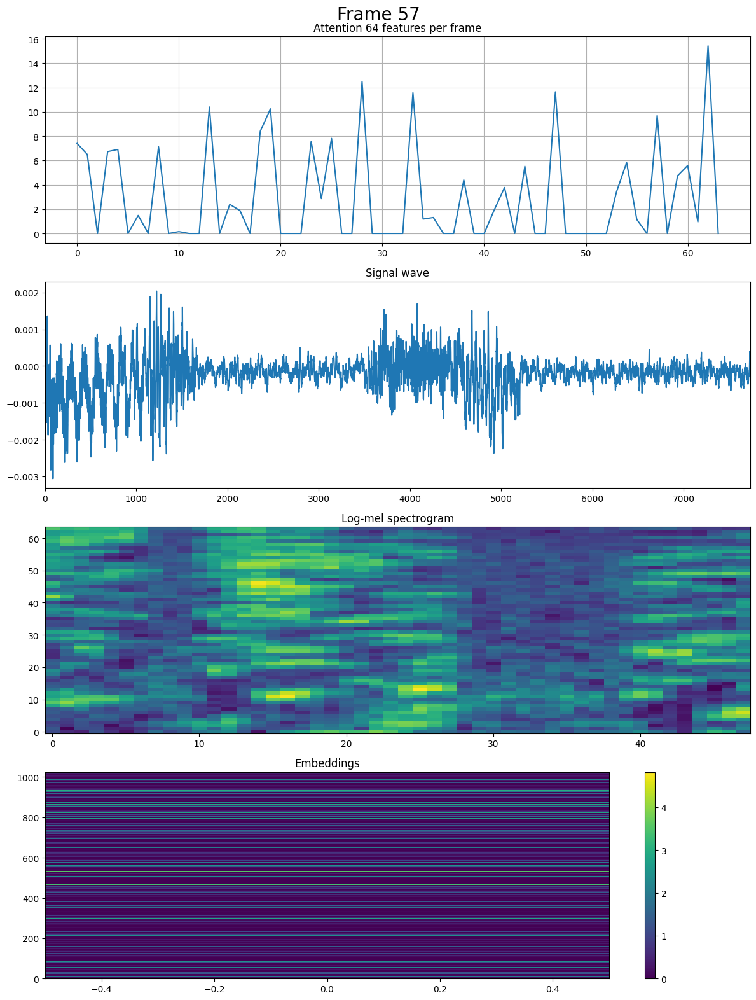

In [ ]:
plot_frame(frame_index, audio_wav, mel_spectrogram, embedding, attention)

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
c0['cn_score'].plot(kind='hist', bins=20, title='cn_score Cluster 0')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.subplot(1, 2, 2)
c0['ad_score'].plot(kind='hist', bins=20, title='ad_score Cluster 0')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering Label : Cluster 0.png')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
c1['cn_score'].plot(kind='hist', bins=20, title='cn_score Cluster 1')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.subplot(1, 2, 2)
c1['ad_score'].plot(kind='hist', bins=20, title='ad_score Cluster 1')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering Label : Cluster 1.png')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
c2['cn_score'].plot(kind='hist', bins=20, title='cn_score Cluster 2')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.subplot(1, 2, 2)
c2['ad_score'].plot(kind='hist', bins=20, title='ad_score Cluster 2')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering Label : Cluster 2.png')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
c3['cn_score'].plot(kind='hist', bins=20, title='cn_score Cluster 3')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.subplot(1, 2, 2)
c3['ad_score'].plot(kind='hist', bins=20, title='ad_score Cluster 3')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering Label : Cluster 3.png')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
c4['cn_score'].plot(kind='hist', bins=20, title='cn_score Cluster 4')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.subplot(1, 2, 2)
c4['ad_score'].plot(kind='hist', bins=20, title='ad_score Cluster 4')
plt.xlim(0, 1)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering Label : Cluster 4.png')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
c5['cn_score'].plot(kind='hist', bins=20, title='cn_score Cluster 5')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.subplot(1, 2, 2)
c5['ad_score'].plot(kind='hist', bins=20, title='ad_score Cluster 5')
plt.xlim(0, 1)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering Label : Cluster 5.png')
plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
c6['cn_score'].plot(kind='hist', bins=20, title='cn_score Cluster 6')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.subplot(1, 2, 2)
c6['ad_score'].plot(kind='hist', bins=20, title='ad_score Cluster 6')
plt.xlim(0, 1)
plt.ylim(0, 267)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/A_senior_project/K-Means_Clustering/'+'K-Means Clustering Label : Cluster 6.png')
plt.show()

In [ ]:
print(c0['true_label'])
print(c0['true_label'].dtype)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


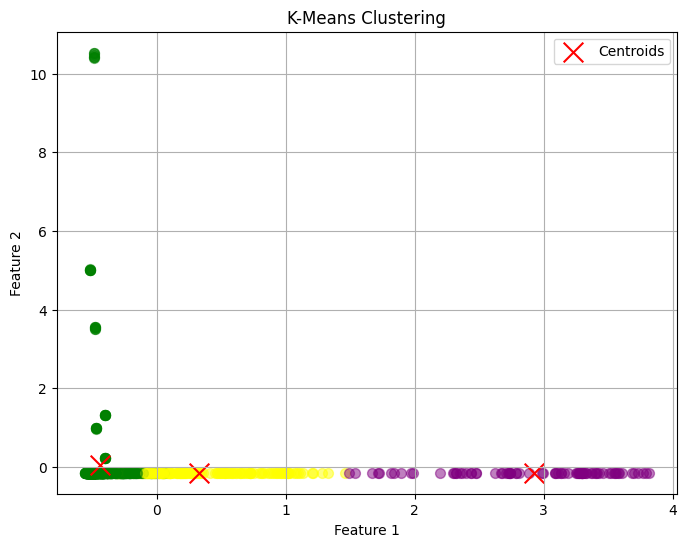

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Extract vectors from the DataFrame np.array(x)
vectors = np.array([np.array(x) for x in audio_df['att']])

# Convert the list of vectors into a matrix
X = np.vstack(vectors)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform k-means clustering
kmeans = KMeans(n_clusters=3)  # Set number of clusters to 3
kmeans.fit(X_scaled)
centroids = kmeans.cluster_centers_
labels = kmeans.labels_

# Define custom colors for each cluster
colors = ['yellow', 'purple', 'green']  # Define colors for each cluster label

# Plot the data points and centroids with custom colors
plt.figure(figsize=(8, 6))
for i in range(len(X_scaled)):
    plt.scatter(X_scaled[i, 0], X_scaled[i, 1], c=colors[labels[i]], s=50, alpha=0.5)  # Use custom color
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, color='red', label='Centroids')
plt.title('K-Means Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
ad_count = (selected_row_c0['ad_score'] != 0).sum()
cn_count = (selected_row_c0['cn_score'] != 0).sum()

print("Number of ad:", ad_count)
print("Number of cn:", cn_count)

Number of ad: 66
Number of cn: 101


In [ ]:
# Export DataFrame to CSV in a specific directory
#selected_row_cn.to_csv('/content/drive/MyDrive/A_senior_project/origi_wav/a/cut_wav/cluster1_dataframe.csv', index=False)

###TP

In [ ]:
# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Scale the numerical labels to the range [0, 1]
c0_labels = label_encoder.fit_transform(c0['true_label']) / (len(label_encoder.classes_) - 1)
c1_labels = label_encoder.fit_transform(c1['true_label']) / (len(label_encoder.classes_) - 1)
c2_labels = label_encoder.fit_transform(c2['true_label']) / (len(label_encoder.classes_) - 1)
c3_labels = label_encoder.fit_transform(c3['true_label']) / (len(label_encoder.classes_) - 1)
c4_labels = label_encoder.fit_transform(c4['true_label']) / (len(label_encoder.classes_) - 1)
c5_labels = label_encoder.fit_transform(c5['true_label']) / (len(label_encoder.classes_) - 1)
c6_labels = label_encoder.fit_transform(c6['true_label']) / (len(label_encoder.classes_) - 1)

<ipython-input-52-416e6e108572>:7: RuntimeWarning: invalid value encountered in divide
  c2_labels = label_encoder.fit_transform(c2['true_label']) / (len(label_encoder.classes_) - 1)
<ipython-input-52-416e6e108572>:9: RuntimeWarning: invalid value encountered in divide
  c4_labels = label_encoder.fit_transform(c4['true_label']) / (len(label_encoder.classes_) - 1)


In [ ]:
all_true_label = c0_labels.tolist() + c1_labels.tolist() + c2_labels.tolist()+ c3_labels.tolist() + c4_labels.tolist() + c5_labels.tolist() + c6_labels.tolist()
len(all_true_label)

918

In [ ]:
threshold = 0.5
# Map values to binary format based on the threshold
y_pred0 = [1 if x >= threshold else 0 for x in c0['ad_score']]
y_pred1 = [1 if x >= threshold else 0 for x in c1['ad_score']]
y_pred2 = [1 if x >= threshold else 0 for x in c2['ad_score']]
y_pred3 = [1 if x >= threshold else 0 for x in c3['ad_score']]
y_pred4 = [1 if x >= threshold else 0 for x in c4['ad_score']]
y_pred5 = [1 if x >= threshold else 0 for x in c5['ad_score']]
y_pred6 = [1 if x >= threshold else 0 for x in c6['ad_score']]

In [ ]:
c0['scaled_labels'] = c0_labels.tolist()
c0['y_pred'] = y_pred0
c1['scaled_labels'] = c1_labels.tolist()
c1['y_pred'] = y_pred1
c2['scaled_labels'] = c2_labels.tolist()
c2['y_pred'] = y_pred2
c3['scaled_labels'] = c3_labels.tolist()
c3['y_pred'] = y_pred3
c4['scaled_labels'] = c4_labels.tolist()
c4['y_pred'] = y_pred4
c5['scaled_labels'] = c5_labels.tolist()
c5['y_pred'] = y_pred5
c6['scaled_labels'] = c6_labels.tolist()
c6['y_pred'] = y_pred6

<ipython-input-55-e3a3c7550f9d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c0['scaled_labels'] = c0_labels.tolist()
<ipython-input-55-e3a3c7550f9d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c0['y_pred'] = y_pred0
<ipython-input-55-e3a3c7550f9d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

In [ ]:
# Function to label each row
def label_row(row):
    if row['scaled_labels'] == 1 and row['y_pred'] == 1:
        return 'TP'
    elif row['scaled_labels'] == 0 and row['y_pred'] == 0:
        return 'TN'
    elif row['scaled_labels'] == 0 and row['y_pred'] == 1:
        return 'FP'
    elif row['scaled_labels'] == 1 and row['y_pred'] == 0:
        return 'FN'

# Apply the function to label each row
c0['classification'] = c0.apply(label_row, axis=1)
c1['classification'] = c1.apply(label_row, axis=1)
c2['classification'] = c2.apply(label_row, axis=1)
c3['classification'] = c3.apply(label_row, axis=1)
c4['classification'] = c4.apply(label_row, axis=1)
c5['classification'] = c5.apply(label_row, axis=1)
c6['classification'] = c6.apply(label_row, axis=1)

<ipython-input-56-4b417b42f3d1>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c0['classification'] = c0.apply(label_row, axis=1)
<ipython-input-56-4b417b42f3d1>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c1['classification'] = c1.apply(label_row, axis=1)
<ipython-input-56-4b417b42f3d1>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.o

In [ ]:
all_data = pd.concat([c0,c1,c2,c3,c4,c5,c6])

# Reset index if needed
all_data.reset_index(drop=True, inplace=True)

# Print the concatenated DataFrame
print(all_data.shape)

(918, 14)


In [ ]:
all_data['att']

0      [[0.020648347, 0.00010626046, 0.061778214, 0.0...
1      [[0.020667996, 0.00010631117, 0.061776362, 0.0...
2      [[0.020702815, 0.00010638587, 0.061805688, 0.0...
3      [[0.02077863, 0.000106175765, 0.06191368, 0.02...
4      [[0.020769753, 0.00010619924, 0.06200975, 0.02...
                             ...                        
913    [[0.050703507, 2.940027e-05, 0.032257464, 0.02...
914    [[0.050655223, 2.9114935e-05, 0.03223864, 0.02...
915    [[0.051350642, 2.880632e-05, 0.03202213, 0.021...
916    [[0.050610896, 2.9108367e-05, 0.032226108, 0.0...
917    [[0.050592612, 2.9205457e-05, 0.032256242, 0.0...
Name: att, Length: 918, dtype: object

In [ ]:
tp = all_data[(all_data['classification'] == 'TP')]
tn = all_data[(all_data['classification'] == 'TN')]
fp = all_data[(all_data['classification'] == 'FP')]
fn = all_data[(all_data['classification'] == 'FN')]

In [ ]:
print(tp.shape, #239
      tn.shape, #365
      fp.shape, #143
      fn.shape, #171
      )

(295, 14) (287, 14) (215, 14) (112, 14)




*   ดูกล่องสั้น
*   TP,TN สูง
*   outliner น้อยๆ



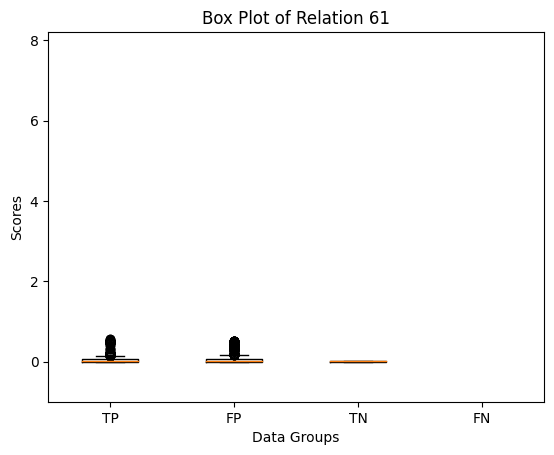

In [ ]:
n=61
while n <62 :
  list_tp=[]
  for i in tp['att']:
      list_tp.append(i[0][n]) #relation0

  list_tn=[]
  for i in tn['att']:
      list_tn.append(i[0][n]) #relation0

  list_fp=[]
  for i in fp['att']:
      list_fp.append(i[0][n]) #relation0

  list_fn=[]
  for i in fn['att']:
      list_fn.append(i[0][n]) #relation0

  #plot
  relation = [list_tp, list_fp, list_tn, list_fn]
  plt.boxplot(relation)

  # Add labels and title
  plt.xlabel('Data Groups')
  plt.ylabel('Scores')
  plt.title('Box Plot of Relation '+str(n))

  plt.xticks([1, 2, 3, 4], ['TP', 'FP', 'TN', 'FN'])
  plt.ylim(-1, 8.2)
  #save images
  plt.savefig('/content/drive/MyDrive/A_senior_project/Relation_plot/'+'Box Plot of Relation '+str(n)+'.png')

  plt.show()

  n+=1

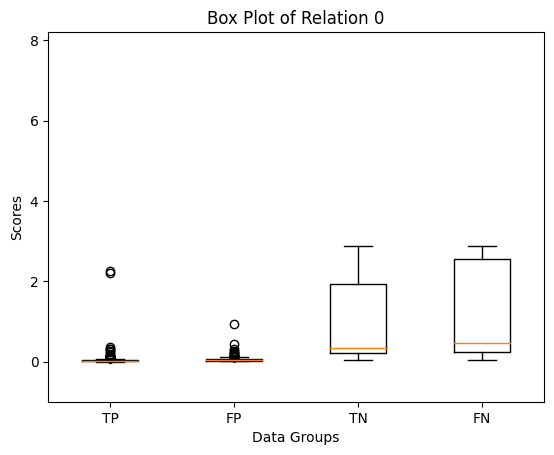

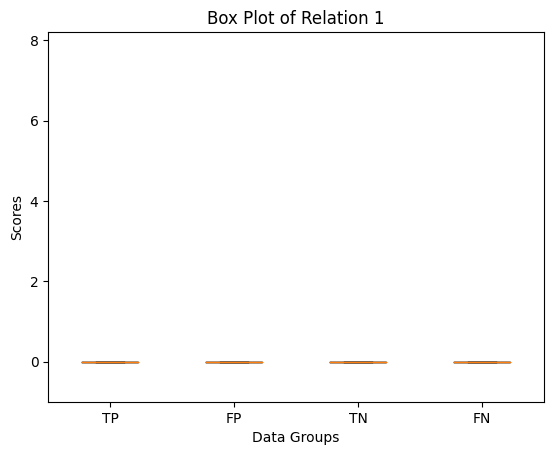

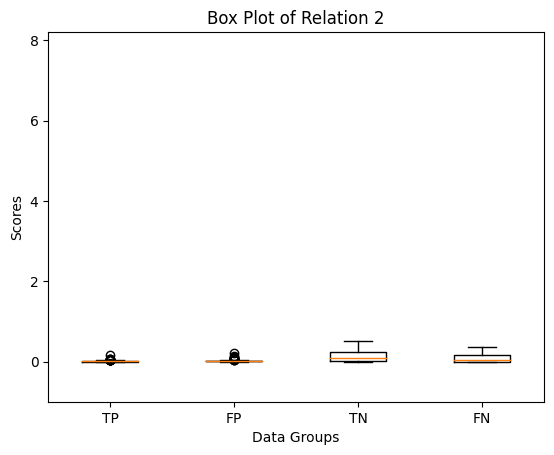

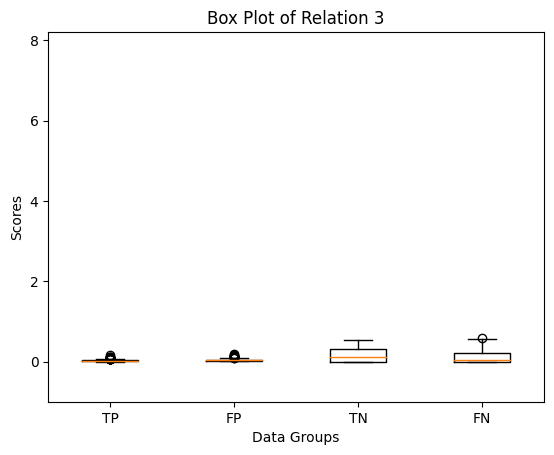

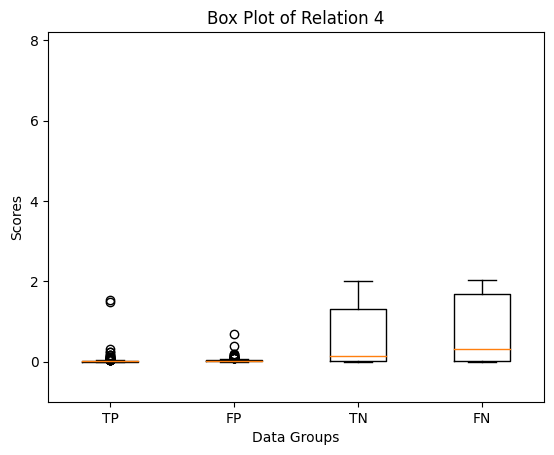

...

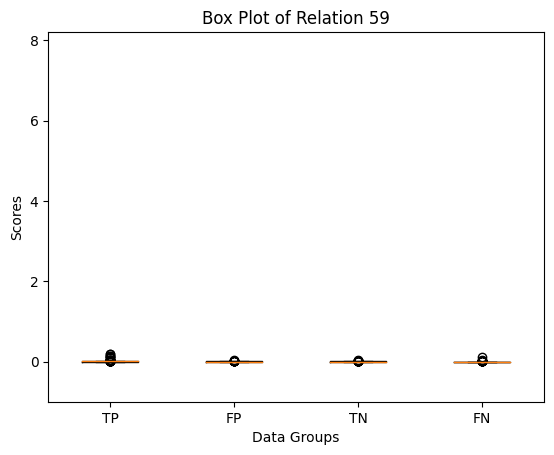

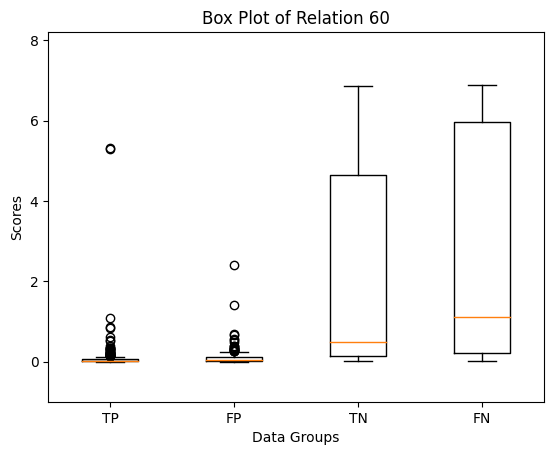

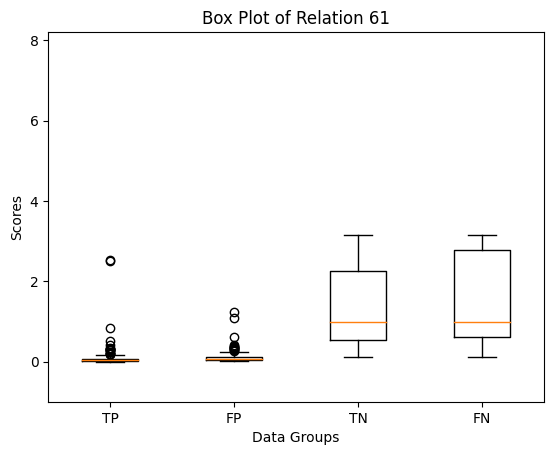

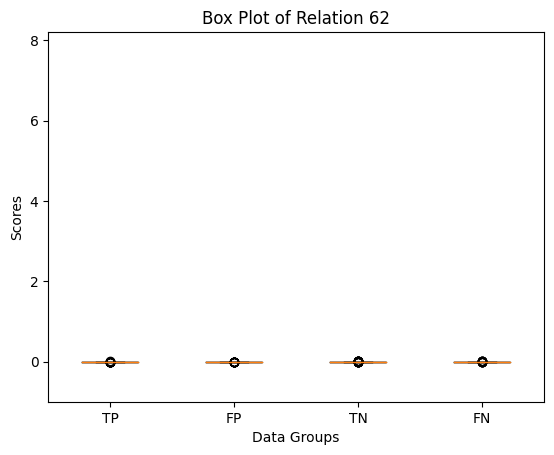

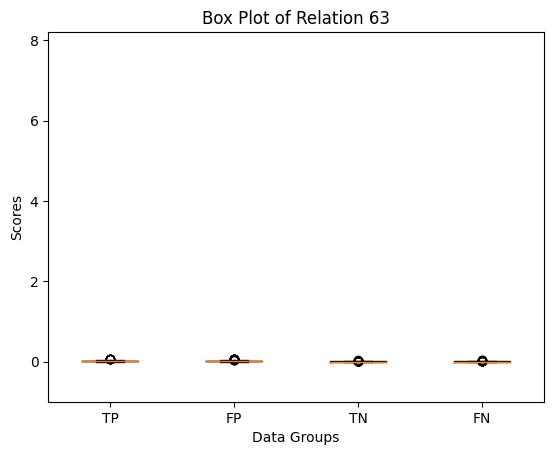

In [ ]:
n=0
relation_list=[]
while n < 64:
  list_tp=[]
  for i in tp['att']:
      list_tp.append(i[0][n]) #relation0

  list_tn=[]
  for i in tn['att']:
      list_tn.append(i[0][n]) #relation0

  list_fp=[]
  for i in fp['att']:
      list_fp.append(i[0][n]) #relation0

  list_fn=[]
  for i in fn['att']:
      list_fn.append(i[0][n]) #relation0

  #plot
  relation = [list_tp, list_fp, list_tn, list_fn]
  relation_list.append(relation)
  plt.boxplot(relation)

  # Add labels and title
  plt.xlabel('Data Groups')
  plt.ylabel('Scores')
  plt.title('Box Plot of Relation '+str(n))

  plt.xticks([1, 2, 3, 4], ['TP', 'FP', 'TN', 'FN'])
  plt.ylim(-1, 8.2)
  #save images
  plt.savefig('/content/drive/MyDrive/A_senior_project/Relation_plot/'+'Box Plot of Relation '+str(n)+'.png')

  plt.show()

  n+=1

###K means 2

In [ ]:
selected_row_c0.shape
selected_row_c1.shape
selected_row_c2.shape

(124, 11)

In [ ]:
selected_row_c0

In [ ]:
  # create dataframe for query data
a=[]
for i in selected_row_c0['att']:
    a.append(i[0])
selected_row_c0 = pd.DataFrame(a)

a=[]
for i in selected_row_c1['att']:
    a.append(i[0])
selected_row_c1 = pd.DataFrame(a)

a=[]
for i in selected_row_c2['att']:
    a.append(i[0])
selected_row_c2 = pd.DataFrame(a)

In [ ]:
len(selected_row_c0.iloc[0]), len(selected_row_c1.iloc[0]), len(selected_row_c2.iloc[0])

(64, 64, 64)

In [ ]:
relation1=[]
for i in selected_row_c0.T.iloc[0]:
  relation1.append(i)
for i in selected_row_c1.T.iloc[0]:
  relation1.append(i)
for i in selected_row_c2.T.iloc[0]:
  relation1.append(i)
#selected_row_c0.iloc[0]+selected_row_c1.iloc[0]+selected_row_c2.iloc[0]

In [ ]:
relation1

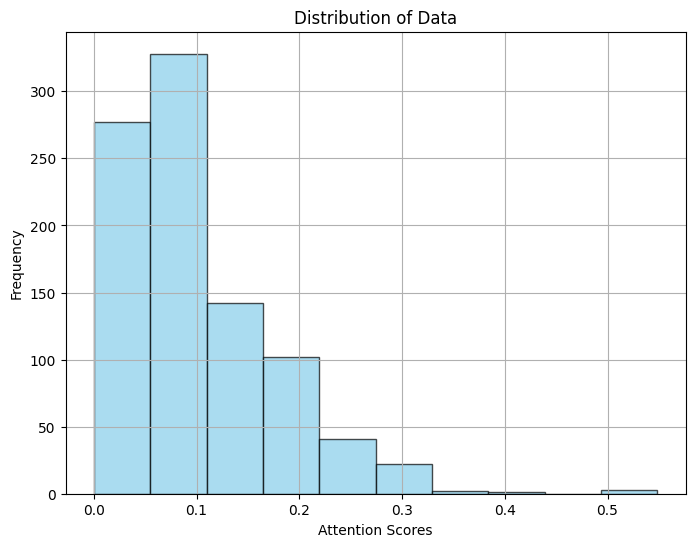

In [ ]:
data = relation1

# Plot the distribution using a histogram
plt.figure(figsize=(8, 6))
plt.hist(data, bins=10, color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel('Attention Scores')
plt.ylabel('Frequency')
plt.title('Distribution of Data')
plt.grid(True)
plt.show()

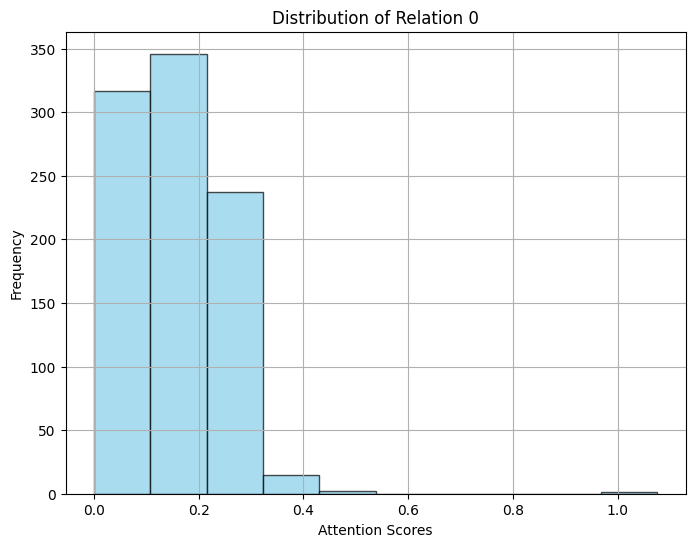

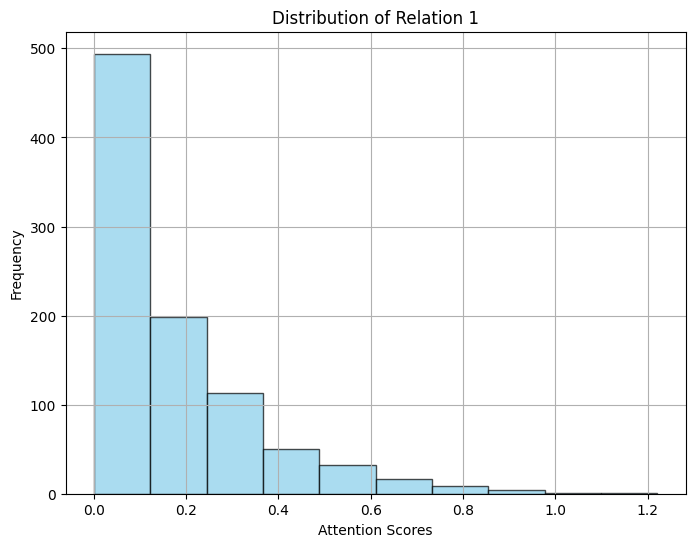

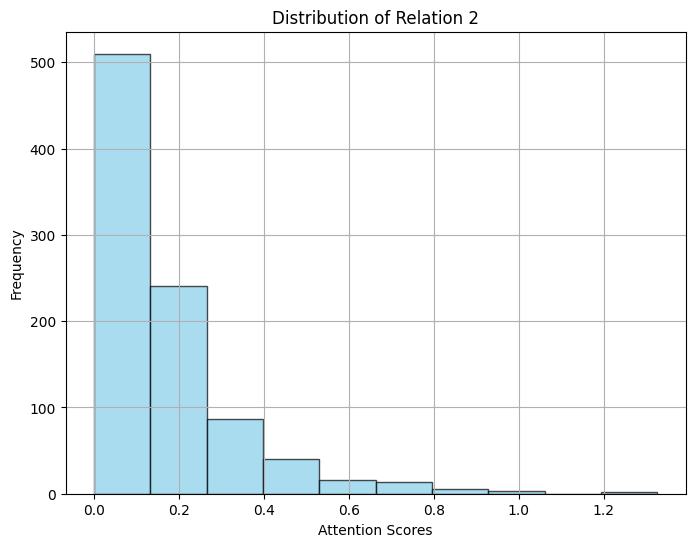

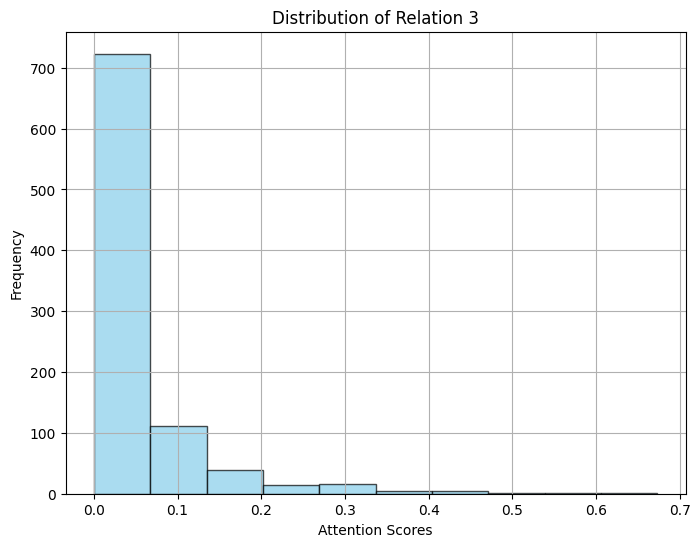

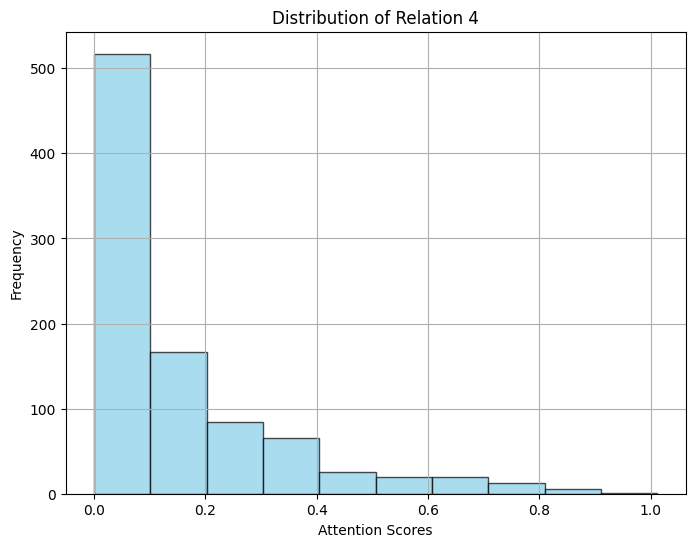

...

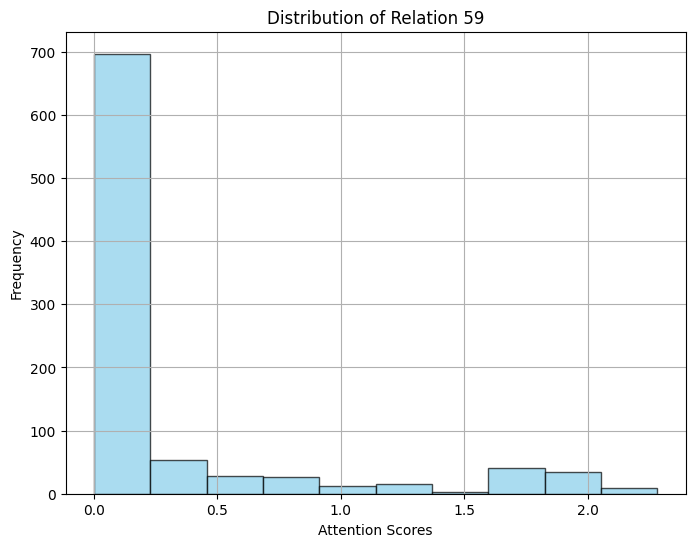

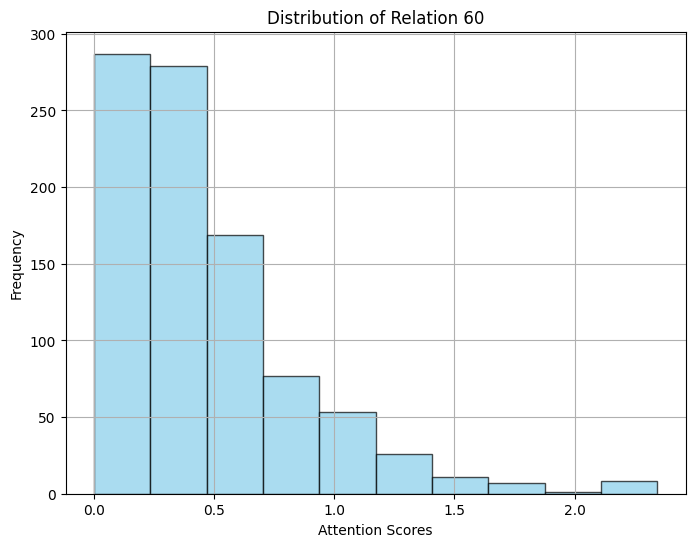

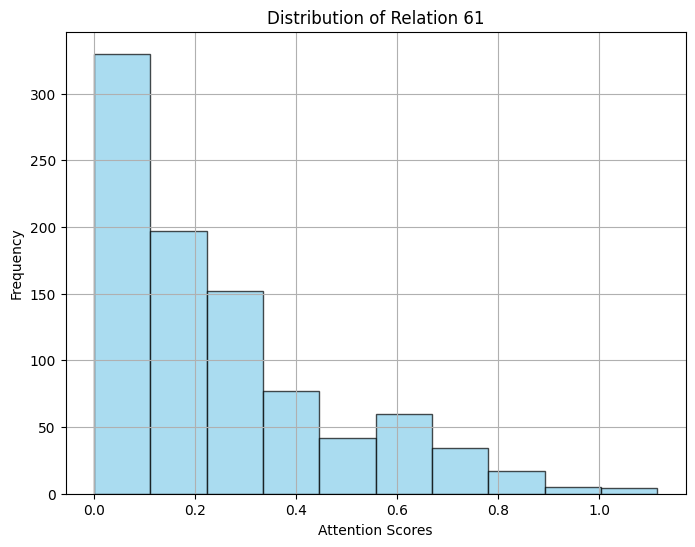

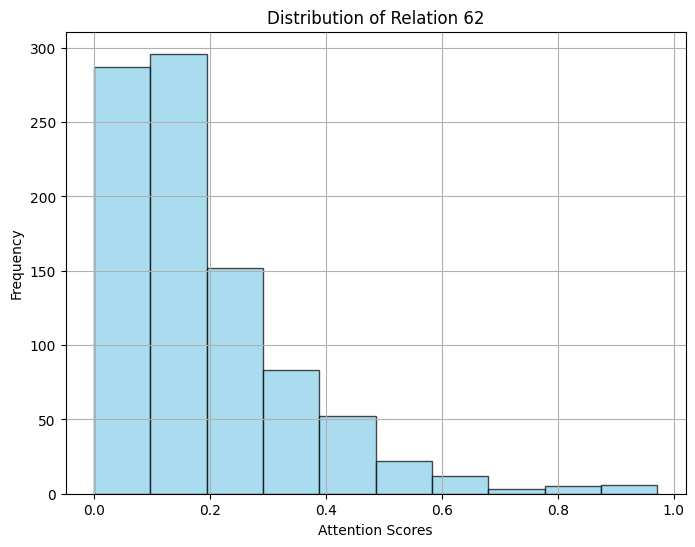

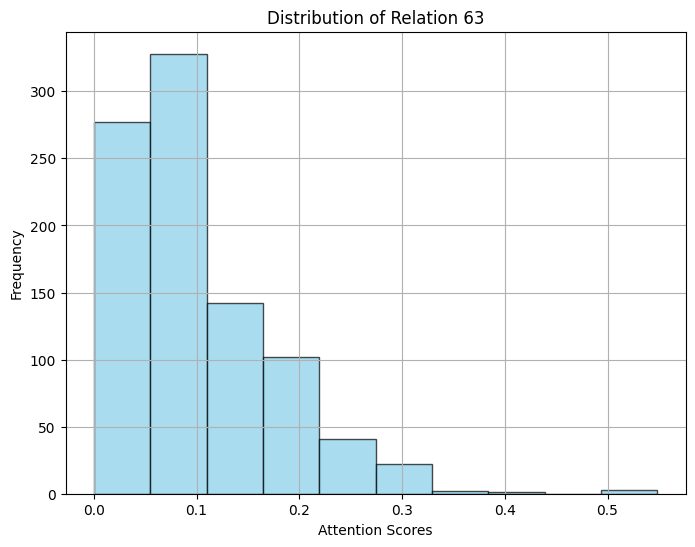

In [ ]:
n=0
while n<64:
  relation1=[]
  for i in selected_row_c0.T.iloc[n]:
    relation1.append(i)
  for i in selected_row_c1.T.iloc[n]:
    relation1.append(i)
  for i in selected_row_c2.T.iloc[n]:
    relation1.append(i)

  #plot
  data = relation1

  plt.figure(figsize=(8, 6))
  plt.hist(data, bins=10, color='skyblue', edgecolor='black', alpha=0.7)
  plt.xlabel('Attention Scores')
  plt.ylabel('Frequency')
  plt.title('Distribution of Relation '+str(n))
  plt.grid(True)
  plt.show()

  n+=1

In [ ]:
n=0
while n<64:
  data = pd.DataFrame({ "AD>0":selected_row_c0.iloc[n],
                      # "CN>0":selected_row_c1.iloc[n],
                        "CN=1":selected_row_c2.iloc[n]} )

  data.boxplot()

  for i,d in enumerate(data):
      y = data[d]
      x = np.random.normal(i+1, 0.04, len(y))
      plt.plot(x, y, mfc = ["orange","yellow","green"][i], mec='k', ms=3, marker="o", linestyle="None")

  plt.hlines(1,0,4,linestyle="--")
  plt.title('Relation '+str(n))
  plt.figure(figsize=(10, 15))
  plt.show()
  n+=1

<Axes: title={'center': 'CN = 1 with AD = 0'}>

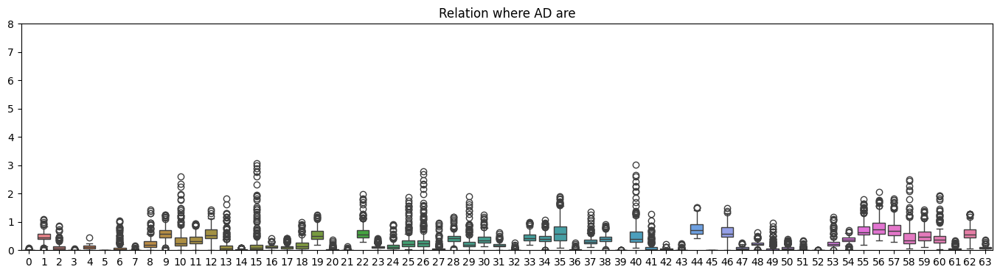

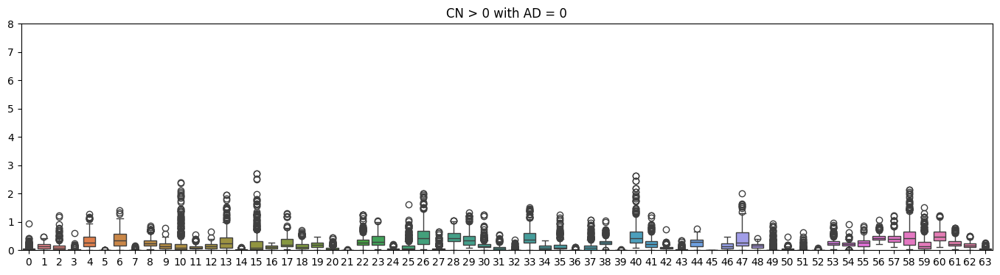

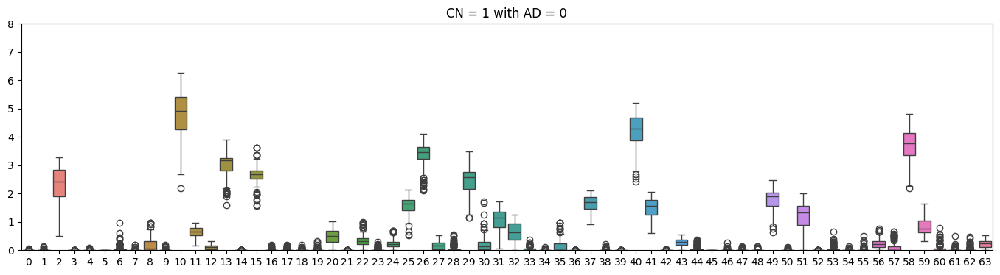

In [ ]:
plt.figure(figsize=(17, 4))
plt.title('Relation where AD are')
plt.ylim(0, 8)
sns.boxplot(data=selected_row_c0)# ad

plt.figure(figsize=(17, 4))
plt.ylim(0, 8)
plt.title('CN > 0 with AD = 0')
sns.boxplot(data=selected_row_c1)#cn>0


plt.figure(figsize=(17, 4))
plt.ylim(0, 8)
plt.title('CN = 1 with AD = 0')
sns.boxplot(data=selected_row_c2) #cn=1, ad=0


In [ ]:
data=[]
for i in selected_row['att']:
  data.append(i)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generating example data
np.random.seed(0)
data = data
experiments = ['exp1', 'exp2', 'exp3']
names = np.random.choice(experiments, size=(42, 64))

# Reshape the data
reshaped_data = data.reshape(-1, 64)
reshaped_names = names.reshape(-1)

# Creating DataFrame
test_data = pd.DataFrame(reshaped_data, columns=[f"col{i}" for i in range(64)])
test_data["name"] = reshaped_names

# Plotting
fig, ax = plt.subplots(figsize=(15, 12))
test_data.boxplot(column='value', by='name', ax=ax)
plt.show()

AttributeError: 'list' object has no attribute 'reshape'

###Map back audio

In [ ]:
import random
#i = random.randint(0, 164)
i=158
print(i)
filename = metadata['filename'].iloc[i].split('/')[-1]
audio_wav, predictions, mel_spectrogram = filename_to_predictions(metadata['filename'].iloc[i])

infered_class = class_names[predictions.mean(axis=0).argmax()]

attention = keras.Model(inputs=model.input, outputs=model.get_layer("attention").output)
attention=attention.predict(all_ds)

embedding = keras.Model(inputs=model.input, outputs=model.get_layer("embedding").output)
embedding=embedding.predict(all_ds)

timeframes = map_timeframes(post_process(predictions),  mel_spectrogram.numpy().T)
attention, embedding = get_att_end(i, attention, embedding)
print(f"The dx is: {infered_class} ")
print(f"The actual dx is: {metadata['dx'].iloc[i]} ")
print(attention.shape,embedding.shape)
plot_all(audio_wav,mel_spectrogram,embedding,attention,predictions,class_names)

158


IndexError: single positional indexer is out-of-bounds

In [ ]:
Audio(audio_wav, rate=16000)

In [ ]:
filename

'adrso002_split0.wav'

In [ ]:
att_df = pd.DataFrame(attention)
att_df

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.000550,0.472829,0.045589,0.217481,0.000324,0.0,0.001270,0.0,0.332414,0.0,...,0.0,0.292877,0.0,0.000777,0.007301,0.440513,0.0,0.001013,0.351862,0.050412
1,0.000559,0.470457,0.045533,0.216451,0.000330,0.0,0.001292,0.0,0.330783,0.0,...,0.0,0.291553,0.0,0.000791,0.007268,0.438385,0.0,0.001030,0.350314,0.050236
2,0.000547,0.473873,0.045654,0.217938,0.000323,0.0,0.001264,0.0,0.333143,0.0,...,0.0,0.293533,0.0,0.000773,0.007306,0.441517,0.0,0.001008,0.352598,0.050471
3,0.000564,0.471342,0.045554,0.216838,0.000333,0.0,0.001304,0.0,0.331379,0.0,...,0.0,0.292036,0.0,0.000798,0.007278,0.439207,0.0,0.001040,0.350900,0.050297
4,0.000556,0.472046,0.045558,0.217142,0.000328,0.0,0.001284,0.0,0.331883,0.0,...,0.0,0.292451,0.0,0.000786,0.007289,0.439837,0.0,0.001024,0.351370,0.050346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000552,0.473086,0.045607,0.217596,0.000326,0.0,0.001275,0.0,0.332596,0.0,...,0.0,0.293061,0.0,0.000780,0.007299,0.440794,0.0,0.001016,0.352065,0.050416
60,0.000551,0.474811,0.045623,0.218342,0.000325,0.0,0.001273,0.0,0.333775,0.0,...,0.0,0.294011,0.0,0.000779,0.007329,0.442349,0.0,0.001015,0.353180,0.050533
61,0.000556,0.472960,0.045555,0.217531,0.000328,0.0,0.001286,0.0,0.332511,0.0,...,0.0,0.292944,0.0,0.000787,0.007306,0.440650,0.0,0.001025,0.351948,0.050412
62,0.000571,0.468672,0.045481,0.215678,0.000337,0.0,0.001320,0.0,0.329543,0.0,...,0.0,0.290513,0.0,0.000808,0.007243,0.436775,0.0,0.001053,0.349141,0.050116


In [ ]:
row_sums = att_df.sum(axis=1)

# Print the row sums
print("Row Sums:")
print(row_sums)

Row Sums:
0     6.035508
1     6.007891
2     6.048262
3     6.018368
4     6.026575
        ...   
59    6.038871
60    6.059001
61    6.037236
62    5.986975
63    6.001801
Length: 64, dtype: float32


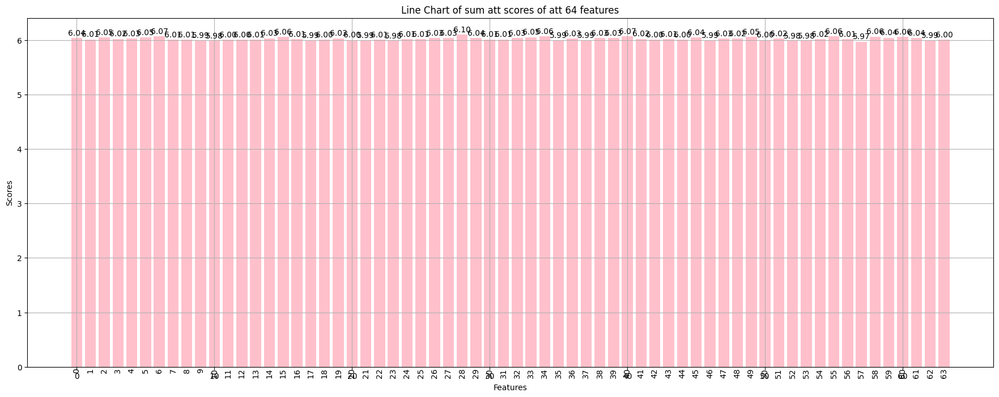

In [ ]:
weight=22
height=8

plt.figure(figsize=(weight, height))

data = row_sums
index_labels = np.arange(len(data))

# Plot the bar chart
plt.bar(index_labels, data, color='pink')

plt.title('Line Chart of sum att scores of att 64 features')
plt.xlabel('Features')
plt.ylabel('Scores')
# Display data labels above each bar
for i in range(len(data)):
    plt.text(i, data[i] + 0.02, f'{data[i]:.2f}', ha='center', va='bottom')

# Display index labels beside each bar
for i in range(len(data)):
    plt.text(i, -0.02, f'{index_labels[i]}', ha='center', va='top', rotation=90)

plt.grid(True)
plt.show()

In [ ]:
df.columns = ['Feature ' + str(i) for i in range(64)]
sorted_df = row_sums.sort_values(ascending=False)
top_10_ranks = sorted_df[:10]
print("Top 10 Ranks:\n", top_10_ranks)

Top 10 Ranks:
 28    6.098585
6     6.069475
40    6.065761
34    6.063277
55    6.062931
58    6.062180
60    6.059001
15    6.055898
49    6.054491
33    6.051115
dtype: float32


CN
Feature 19    121.999886
Feature 23    117.606636
Feature 32     96.429977
Feature 41     88.132401
Feature 57     87.261162
Feature 0      63.707684
Feature 58     51.675468
Feature 5      50.366341

63    9.995900
25    9.759911
36    9.581119
47    9.510817
37    9.420839
0     9.388773
61    9.365507
39    9.247591
13    8.888542
14    8.877934

